## Sparkling wine Sales

We have analyzed the data of different types of wine sales in the 20th century, which are from the same company but represent different wines. As analysts at ABC Estate Wines, we were tasked with analyzing and forecasting wine sales in the 20th century.

### Reading the data as an appropriate Time Series data and ploting the data.

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt

In [2]:
df_sparkling = pd.read_csv('Sparkling.csv',parse_dates=True,index_col='YearMonth')
df_sparkling.head() 

,Sparkling
YearMonth,
1980-01-01,1686
1980-02-01,1591
1980-03-01,2304
1980-04-01,1712
1980-05-01,1471


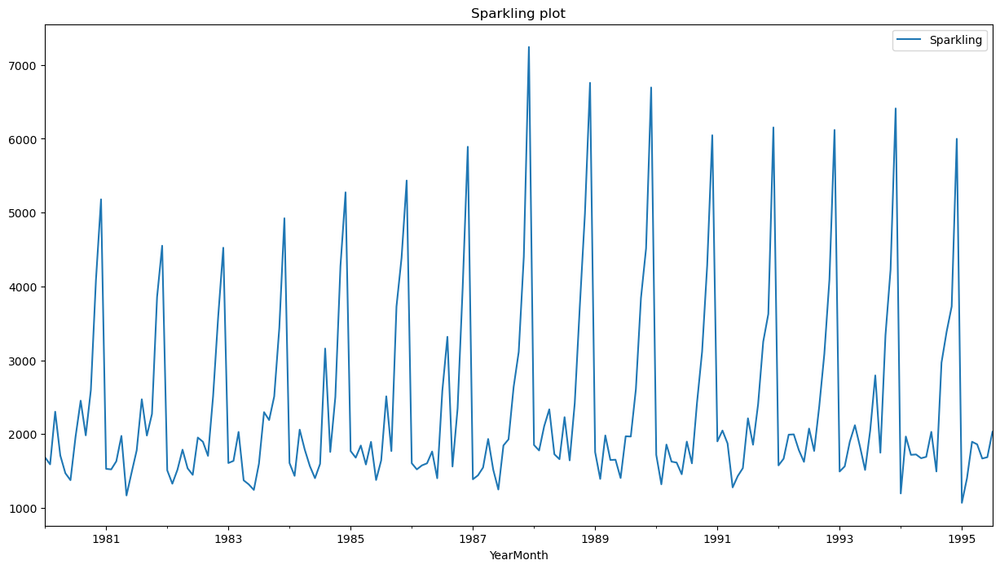

In [3]:
from pylab import rcParams
rcParams['figure.figsize'] = 15,8
df_sparkling.plot()
plt.title('Sparkling plot')
plt.show()

### Performing appropriate Exploratory Data Analysis to understand the data and also performing decomposition.

In [4]:
df_sparkling.shape

(187, 1)

In [5]:
df_sparkling.isnull().sum()

Sparkling    0
dtype: int64

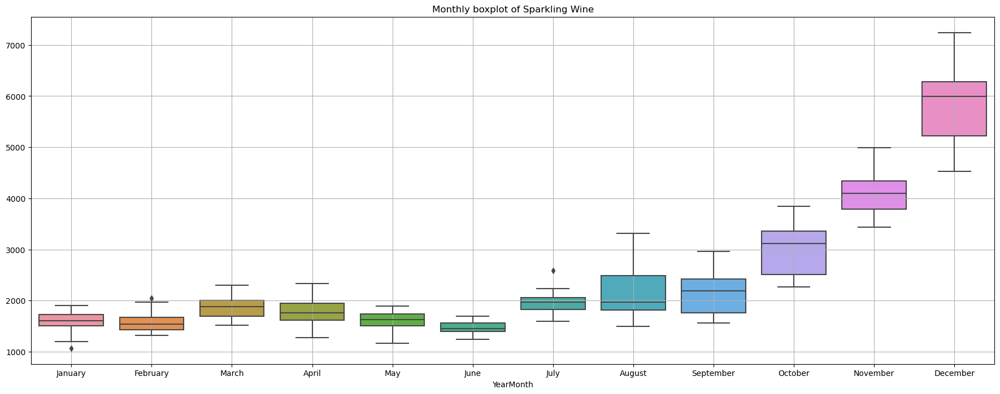

In [6]:
_, ax = plt.subplots(figsize=(22,8))
sns.boxplot(x = df_sparkling.index.month_name(),y = df_sparkling.values[:,0],ax=ax)
plt.grid()
plt.title('Monthly boxplot of Sparkling Wine')
plt.show()

In [7]:
monthly_sales_across_years = pd.pivot_table(df_sparkling, values = 'Sparkling', columns = df_sparkling.index.month_name(), index = df_sparkling.index.year)
monthly_sales_across_years

YearMonth,April,August,December,February,January,July,June,March,May,November,October,September
YearMonth,,,,,,,,,,,,
1980,1712.0,2453.0,5179.0,1591.0,1686.0,1966.0,1377.0,2304.0,1471.0,4087.0,2596.0,1984.0
1981,1976.0,2472.0,4551.0,1523.0,1530.0,1781.0,1480.0,1633.0,1170.0,3857.0,2273.0,1981.0
1982,1790.0,1897.0,4524.0,1329.0,1510.0,1954.0,1449.0,1518.0,1537.0,3593.0,2514.0,1706.0
1983,1375.0,2298.0,4923.0,1638.0,1609.0,1600.0,1245.0,2030.0,1320.0,3440.0,2511.0,2191.0
1984,1789.0,3159.0,5274.0,1435.0,1609.0,1597.0,1404.0,2061.0,1567.0,4273.0,2504.0,1759.0
1985,1589.0,2512.0,5434.0,1682.0,1771.0,1645.0,1379.0,1846.0,1896.0,4388.0,3727.0,1771.0
1986,1605.0,3318.0,5891.0,1523.0,1606.0,2584.0,1403.0,1577.0,1765.0,3987.0,2349.0,1562.0
1987,1935.0,1930.0,7242.0,1442.0,1389.0,1847.0,1250.0,1548.0,1518.0,4405.0,3114.0,2638.0
1988,2336.0,1645.0,6757.0,1779.0,1853.0,2230.0,1661.0,2108.0,1728.0,4988.0,3740.0,2421.0


Text(0.5, 1.0, 'Sparkling year-month analyses')

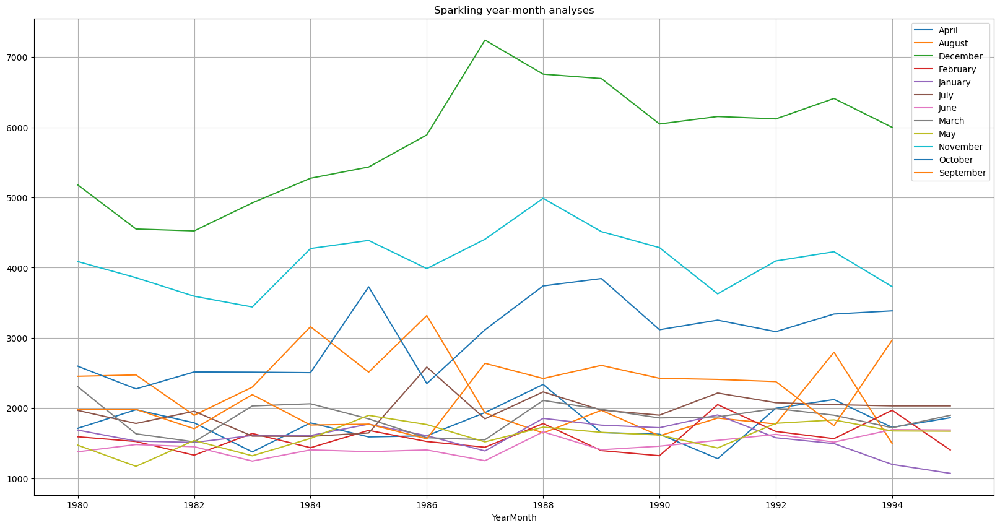

In [8]:
monthly_sales_across_years.plot(figsize=(20,10))
plt.grid()
plt.legend(loc='best')
plt.title('Sparkling year-month analyses')

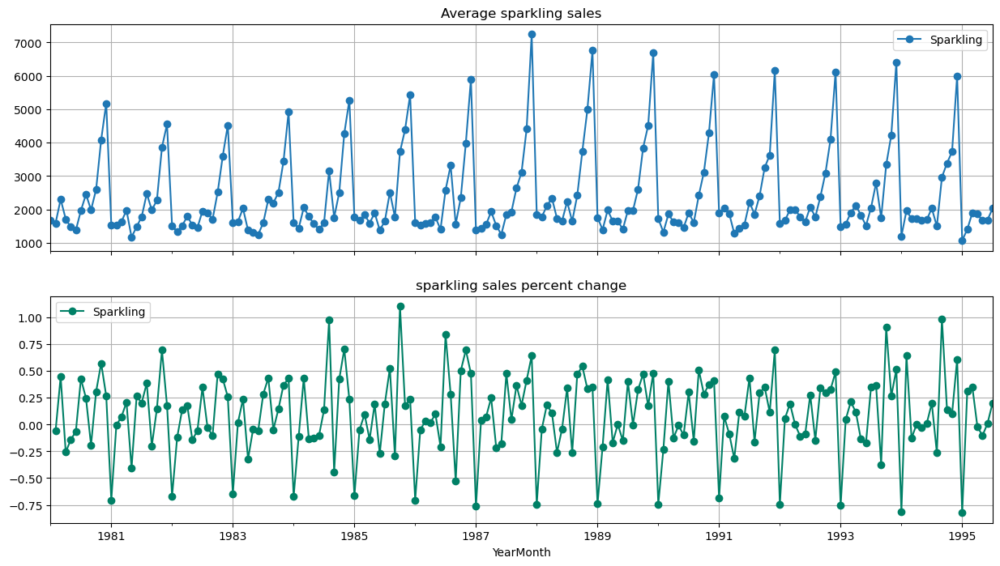

In [9]:
# group by date and get average RetailSales, and precent change
average    = df_sparkling.groupby(df_sparkling.index)["Sparkling"].mean()
pct_change = df_sparkling.groupby(df_sparkling.index)["Sparkling"].sum().pct_change()

fig, (axis1,axis2) = plt.subplots(2,1,sharex=True,figsize=(15,8))

# plot average RetailSales over time(year-month)
ax1 = average.plot(legend=True,ax=axis1,marker='o',title="Average sparkling sales",grid=True)
ax1.set_xticks(range(len(average)))
ax1.set_xticklabels(average.index.tolist())
# plot precent change for RetailSales over time(year-month)
ax2 = pct_change.plot(legend=True,ax=axis2,marker='o',colormap="summer",title="sparkling sales percent change",grid=True)

In [10]:
df_sparkling.describe()

,Sparkling
count,187.000000
mean,2402.417112
std,1295.111540
min,1070.000000
25%,1605.000000
50%,1874.000000
75%,2549.000000
max,7242.000000


In [11]:
from statsmodels.tsa.seasonal import seasonal_decompose

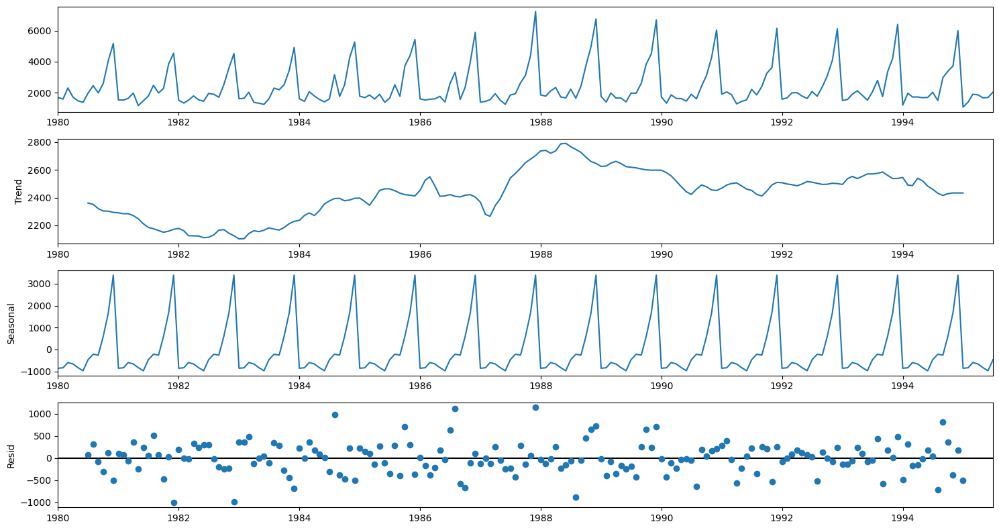

In [12]:
decomposition = seasonal_decompose(df_sparkling,model='additive')
decomposition.plot();

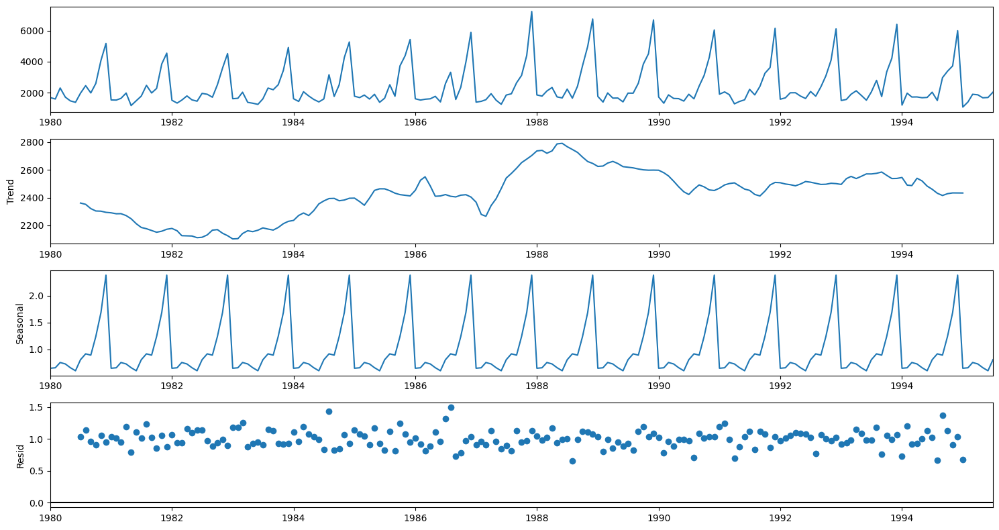

In [13]:
decomposition = seasonal_decompose(df_sparkling,model='multiplicative')
decomposition.plot();

In [14]:
trend = decomposition.trend
seasonality = decomposition.seasonal
residual = decomposition.resid

print('Trend','\n',trend.head(12),'\n')
print('Seasonality','\n',seasonality.head(12),'\n')
print('Residual','\n',residual.head(12),'\n')

Trend 
 YearMonth
1980-01-01            NaN
1980-02-01            NaN
1980-03-01            NaN
1980-04-01            NaN
1980-05-01            NaN
1980-06-01            NaN
1980-07-01    2360.666667
1980-08-01    2351.333333
1980-09-01    2320.541667
1980-10-01    2303.583333
1980-11-01    2302.041667
1980-12-01    2293.791667
Name: trend, dtype: float64 

Seasonality 
 YearMonth
1980-01-01    0.649843
1980-02-01    0.659214
1980-03-01    0.757440
1980-04-01    0.730351
1980-05-01    0.660609
1980-06-01    0.603468
1980-07-01    0.809164
1980-08-01    0.918822
1980-09-01    0.894367
1980-10-01    1.241789
1980-11-01    1.690158
1980-12-01    2.384776
Name: seasonal, dtype: float64 

Residual 
 YearMonth
1980-01-01         NaN
1980-02-01         NaN
1980-03-01         NaN
1980-04-01         NaN
1980-05-01         NaN
1980-06-01         NaN
1980-07-01    1.029230
1980-08-01    1.135407
1980-09-01    0.955954
1980-10-01    0.907513
1980-11-01    1.050423
1980-12-01    0.946770
Name: resi

### Splitting the data into training and test. The test data starts in 1991.

In [15]:
train_sparkling = df_sparkling[df_sparkling.index.year < 1991]
test_sparkling = df_sparkling[df_sparkling.index.year >= 1991]

In [16]:
print(train_sparkling.shape)
print(test_sparkling.shape)

(132, 1)
(55, 1)


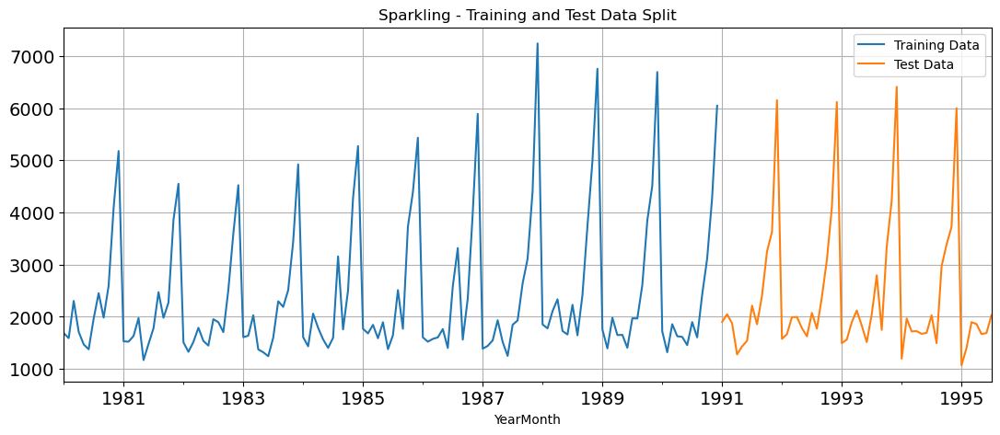

In [17]:
train_sparkling['Sparkling'].plot(figsize=(13,5), fontsize=14)
test_sparkling['Sparkling'].plot(figsize=(13,5), fontsize=14)
plt.grid()
plt.legend(['Training Data','Test Data'])
plt.title('Sparkling - Training and Test Data Split')
plt.show()

### Building all the exponential smoothing models on the training data and evaluating the model using RMSE on the test data. Other additional models such as regression, naïve forecast models, simple average models, moving average models are also built on the training data. The performance on the test data using RMSE was also checked.

### Model 1: Linear Regression

In [18]:
train_time_sparkling = [i+1 for i in range(len(train_sparkling))]
test_time_sparkling = [i+133 for i in range(len(test_sparkling))]
print('Training Time instance for Sparkling','\n\n',train_time_sparkling)
print('')
print('Test Time instance for Sparkling','\n\n',test_time_sparkling)

Training Time instance for Sparkling 

 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132]

Test Time instance for Sparkling 

 [133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187]


In [19]:
LinearRegression_train_sparkling = train_sparkling.copy()
LinearRegression_test_sparkling = test_sparkling.copy()

In [20]:
LinearRegression_train_sparkling['time'] = train_time_sparkling
LinearRegression_test_sparkling['time'] = test_time_sparkling

print('First few rows of Training Data for Sparkling','\n',LinearRegression_train_sparkling.head(),'\n')
print('Last few rows of Training Data for Sparkling','\n',LinearRegression_train_sparkling.tail(),'\n')
print('First few rows of Test Data for Sparkling','\n',LinearRegression_test_sparkling.head(),'\n')
print('Last few rows of Test Data for Sparkling','\n',LinearRegression_test_sparkling.tail(),'\n')

First few rows of Training Data for Sparkling 
             Sparkling  time
YearMonth                  
1980-01-01       1686     1
1980-02-01       1591     2
1980-03-01       2304     3
1980-04-01       1712     4
1980-05-01       1471     5 

Last few rows of Training Data for Sparkling 
             Sparkling  time
YearMonth                  
1990-08-01       1605   128
1990-09-01       2424   129
1990-10-01       3116   130
1990-11-01       4286   131
1990-12-01       6047   132 

First few rows of Test Data for Sparkling 
             Sparkling  time
YearMonth                  
1991-01-01       1902   133
1991-02-01       2049   134
1991-03-01       1874   135
1991-04-01       1279   136
1991-05-01       1432   137 

Last few rows of Test Data for Sparkling 
             Sparkling  time
YearMonth                  
1995-03-01       1897   183
1995-04-01       1862   184
1995-05-01       1670   185
1995-06-01       1688   186
1995-07-01       2031   187 



In [21]:
from sklearn.linear_model import LinearRegression
lr_sparkling = LinearRegression()

In [22]:
lr_sparkling.fit(LinearRegression_train_sparkling[['time']],LinearRegression_train_sparkling['Sparkling'].values)

LinearRegression()

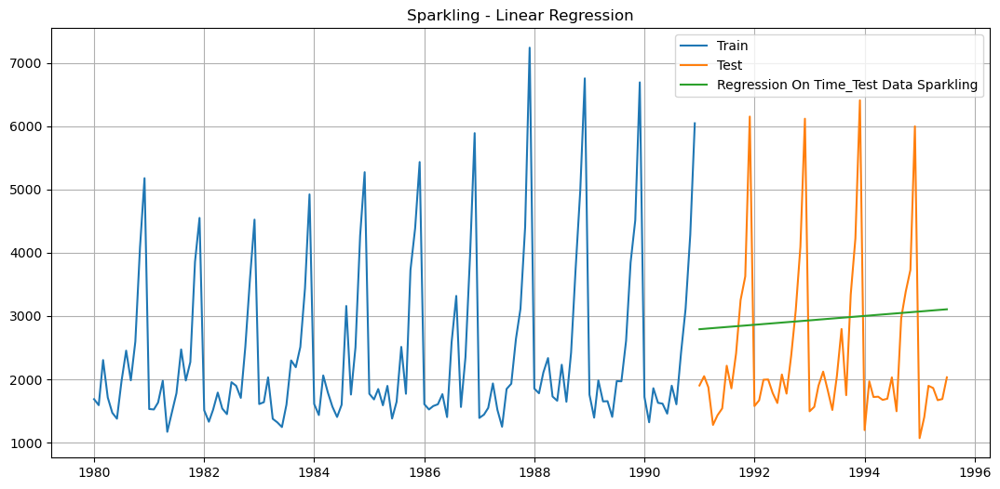

In [23]:
test_predictions_lr_sparkling         = lr_sparkling.predict(LinearRegression_test_sparkling[['time']])
LinearRegression_test_sparkling['RegOnTime'] = test_predictions_lr_sparkling

plt.figure(figsize=(13,6))
plt.plot(train_sparkling['Sparkling'], label='Train')
plt.plot(test_sparkling['Sparkling'], label='Test')
plt.plot(LinearRegression_test_sparkling['RegOnTime'], label='Regression On Time_Test Data Sparkling')
plt.legend(loc='best')
plt.title('Sparkling - Linear Regression')
plt.grid();

In [24]:
## Test Data - RMSE

from sklearn import metrics

rmse_lr_test_sparkling = metrics.mean_squared_error(test_sparkling['Sparkling'],test_predictions_lr_sparkling,squared=False)
print("For RegressionOnTime forecast on the Test Data for Sparkling,  RMSE is %3.3f" %(rmse_lr_test_sparkling))

For RegressionOnTime forecast on the Test Data for Sparkling,  RMSE is 1389.135


In [25]:
resultsDf_sparkling = pd.DataFrame({'Test RMSE Sparkling': [rmse_lr_test_sparkling]},index=['Linear Regression'])
resultsDf_sparkling

,Test RMSE Sparkling
Linear Regression,1389.135175


### Model 2: Naive Approach

In [26]:
NaiveModel_train_sparkling = train_sparkling.copy()
NaiveModel_test_sparkling = test_sparkling.copy()

In [27]:
NaiveModel_test_sparkling['naive'] = np.asarray(train_sparkling['Sparkling'])[len(np.asarray(train_sparkling['Sparkling']))-1]
NaiveModel_test_sparkling['naive'].head()

YearMonth
1991-01-01    6047
1991-02-01    6047
1991-03-01    6047
1991-04-01    6047
1991-05-01    6047
Name: naive, dtype: int64

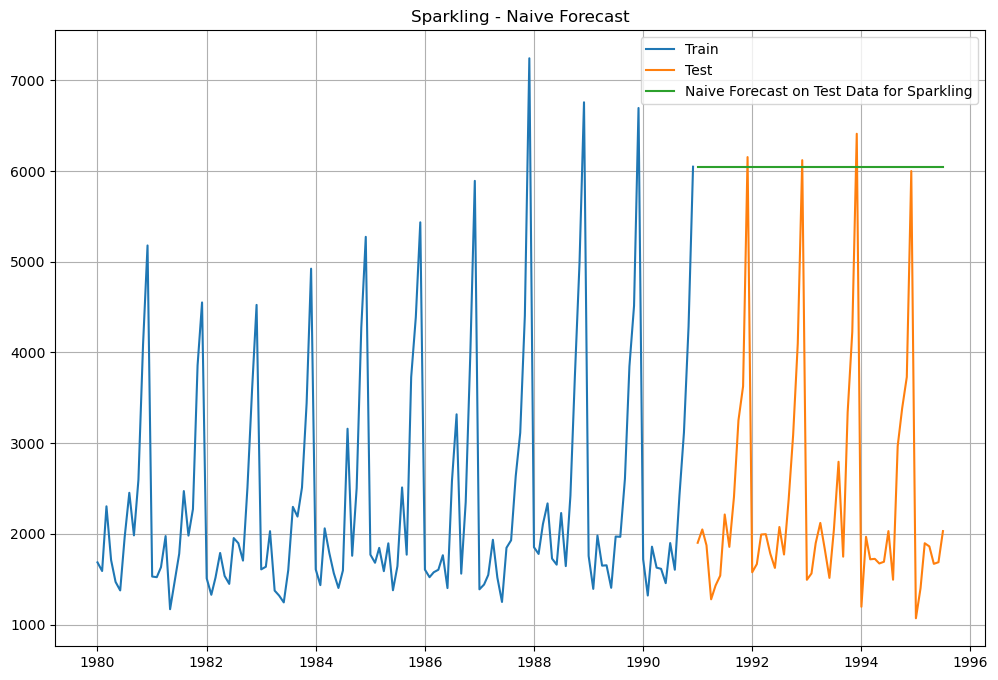

In [28]:
plt.figure(figsize=(12,8))
plt.plot(NaiveModel_train_sparkling['Sparkling'], label='Train')
plt.plot(test_sparkling['Sparkling'], label='Test')
plt.plot(NaiveModel_test_sparkling['naive'], label='Naive Forecast on Test Data for Sparkling')
plt.legend(loc='best')
plt.title("Sparkling - Naive Forecast")
plt.grid();

In [29]:
## Test Data - RMSE

rmse_naive_test_sparkling = metrics.mean_squared_error(test_sparkling['Sparkling'],NaiveModel_test_sparkling['naive'],squared=False)
print("For RegressionOnTime forecast on the Test Data for Sparkling,  RMSE is %3.3f" %(rmse_naive_test_sparkling))

For RegressionOnTime forecast on the Test Data for Sparkling,  RMSE is 3864.279


In [30]:
resultsDf_3 = pd.DataFrame({'Test RMSE Sparkling': [rmse_naive_test_sparkling]},index=['Naive Model'])

resultsDf_sparkling = pd.concat([resultsDf_sparkling, resultsDf_3])
resultsDf_sparkling

,Test RMSE Sparkling
Linear Regression,1389.135175
Naive Model,3864.279352


### Model 3: Simple Average

In [31]:
SimpleAverage_train_sparkling = train_sparkling.copy()
SimpleAverage_test_sparkling = test_sparkling.copy()

In [32]:
SimpleAverage_test_sparkling['mean_forecast'] = train_sparkling['Sparkling'].mean()
SimpleAverage_test_sparkling.head()

,Sparkling,mean_forecast
YearMonth,,
1991-01-01,1902,2403.780303
1991-02-01,2049,2403.780303
1991-03-01,1874,2403.780303
1991-04-01,1279,2403.780303
1991-05-01,1432,2403.780303


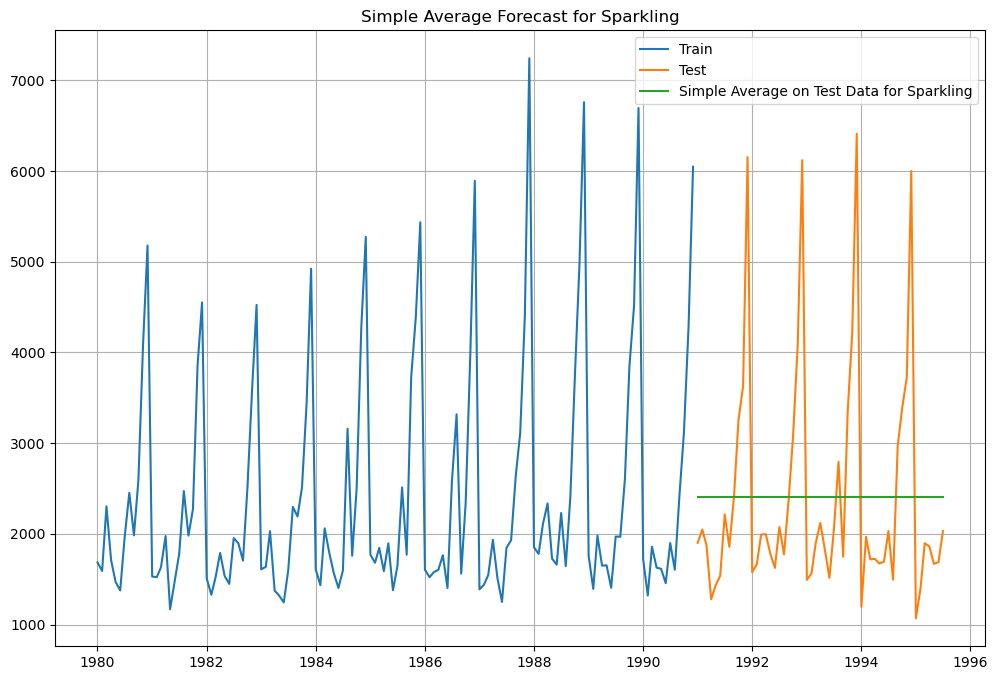

In [33]:
plt.figure(figsize=(12,8))
plt.plot(SimpleAverage_train_sparkling['Sparkling'], label='Train')
plt.plot(SimpleAverage_test_sparkling['Sparkling'], label='Test')
plt.plot(SimpleAverage_test_sparkling['mean_forecast'], label='Simple Average on Test Data for Sparkling')
plt.legend(loc='best')
plt.title("Simple Average Forecast for Sparkling")
plt.grid();

In [34]:
## Test Data - RMSE 

rmse_sa_test_sparkling = metrics.mean_squared_error(test_sparkling['Sparkling'],SimpleAverage_test_sparkling['mean_forecast'],squared=False)
print("For Simple Average forecast on the Test Data for Sparkling,  RMSE is %3.3f" %(rmse_sa_test_sparkling))

For Simple Average forecast on the Test Data for Sparkling,  RMSE is 1275.082


In [35]:
resultsDf_5 = pd.DataFrame({'Test RMSE Sparkling': [rmse_sa_test_sparkling]},index=['Simple Average Model'])

resultsDf_sparkling = pd.concat([resultsDf_sparkling, resultsDf_5])
resultsDf_sparkling

,Test RMSE Sparkling
Linear Regression,1389.135175
Naive Model,3864.279352
Simple Average Model,1275.081804


### Model 4: Moving Average

In [36]:
MovingAverage_sparkling = df_sparkling.copy()
MovingAverage_sparkling.head()

,Sparkling
YearMonth,
1980-01-01,1686
1980-02-01,1591
1980-03-01,2304
1980-04-01,1712
1980-05-01,1471


In [37]:
MovingAverage_sparkling['Trailing_2'] = MovingAverage_sparkling['Sparkling'].rolling(2).mean()
MovingAverage_sparkling['Trailing_4'] = MovingAverage_sparkling['Sparkling'].rolling(4).mean()
MovingAverage_sparkling['Trailing_6'] = MovingAverage_sparkling['Sparkling'].rolling(6).mean()
MovingAverage_sparkling['Trailing_9'] = MovingAverage_sparkling['Sparkling'].rolling(9).mean()

MovingAverage_sparkling.head(10)

,Sparkling,Trailing_2,Trailing_4,Trailing_6,Trailing_9
YearMonth,,,,,
1980-01-01,1686,NaN,NaN,NaN,NaN
1980-02-01,1591,1638.5,NaN,NaN,NaN
1980-03-01,2304,1947.5,NaN,NaN,NaN
1980-04-01,1712,2008.0,1823.25,NaN,NaN
1980-05-01,1471,1591.5,1769.50,NaN,NaN
1980-06-01,1377,1424.0,1716.00,1690.166667,NaN
1980-07-01,1966,1671.5,1631.50,1736.833333,NaN
1980-08-01,2453,2209.5,1816.75,1880.500000,NaN
1980-09-01,1984,2218.5,1945.00,1827.166667,1838.222222


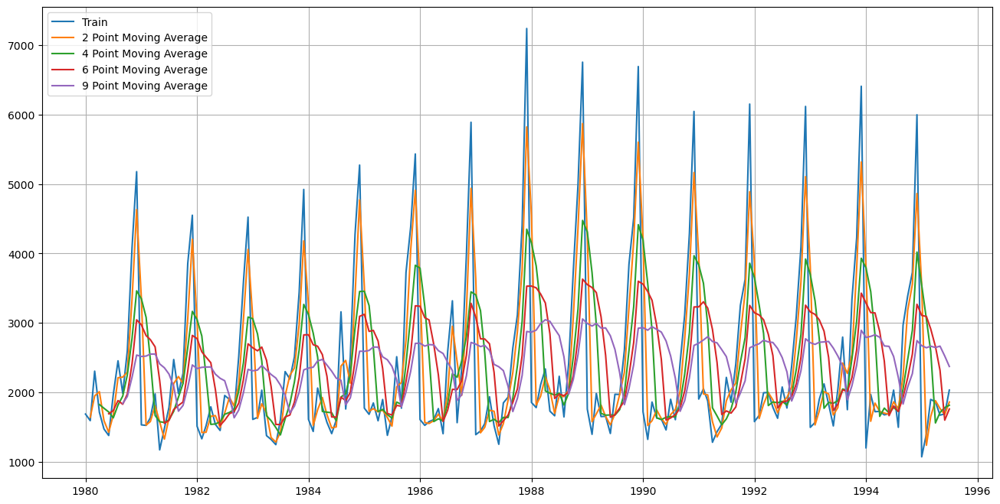

In [38]:
## Plotting on the whole data

plt.figure(figsize=(16,8))
plt.plot(MovingAverage_sparkling['Sparkling'], label='Train')
plt.plot(MovingAverage_sparkling['Trailing_2'], label='2 Point Moving Average')
plt.plot(MovingAverage_sparkling['Trailing_4'], label='4 Point Moving Average')
plt.plot(MovingAverage_sparkling['Trailing_6'],label = '6 Point Moving Average')
plt.plot(MovingAverage_sparkling['Trailing_9'],label = '9 Point Moving Average')

plt.legend(loc = 'best')
plt.grid();

In [39]:
#Creating train and test set 
trailing_MovingAverage_train_sparkling=MovingAverage_sparkling[MovingAverage_sparkling.index.year < 1991] 
trailing_MovingAverage_test_sparkling=MovingAverage_sparkling[MovingAverage_sparkling.index.year >= 1991]

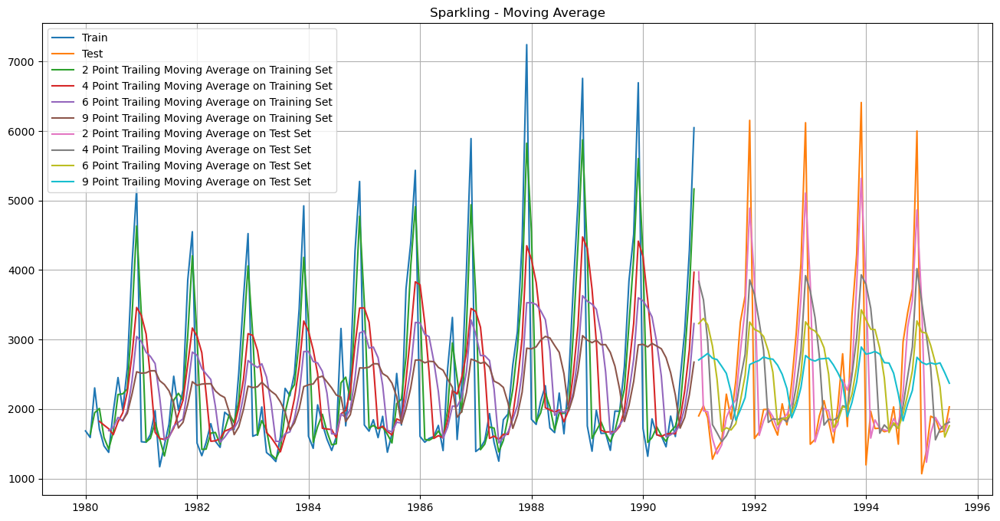

In [40]:
## Plotting on both the Training and Test data

plt.figure(figsize=(16,8))
plt.plot(trailing_MovingAverage_train_sparkling['Sparkling'], label='Train')
plt.plot(trailing_MovingAverage_test_sparkling['Sparkling'], label='Test')

plt.plot(trailing_MovingAverage_train_sparkling['Trailing_2'], label='2 Point Trailing Moving Average on Training Set')
plt.plot(trailing_MovingAverage_train_sparkling['Trailing_4'], label='4 Point Trailing Moving Average on Training Set')
plt.plot(trailing_MovingAverage_train_sparkling['Trailing_6'],label = '6 Point Trailing Moving Average on Training Set')
plt.plot(trailing_MovingAverage_train_sparkling['Trailing_9'],label = '9 Point Trailing Moving Average on Training Set')

plt.plot(trailing_MovingAverage_test_sparkling['Trailing_2'], label='2 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test_sparkling['Trailing_4'], label='4 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test_sparkling['Trailing_6'],label = '6 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test_sparkling['Trailing_9'],label = '9 Point Trailing Moving Average on Test Set')
plt.title('Sparkling - Moving Average')
plt.legend(loc = 'best')
plt.grid();

In [41]:
## Test Data - RMSE --> 2 point Trailing MA

rmse_ma_test_2_sparkling = metrics.mean_squared_error(test_sparkling['Sparkling'],trailing_MovingAverage_test_sparkling['Trailing_2'],squared=False)
print("For 2 point Moving Average Model forecast on the Testing Data for Sparkling,  RMSE is %3.3f" %(rmse_ma_test_2_sparkling))

## Test Data - RMSE  --> 4 point Trailing MA

rmse_ma_test_4_sparkling = metrics.mean_squared_error(test_sparkling['Sparkling'],trailing_MovingAverage_test_sparkling['Trailing_4'],squared=False)
print("For 4 point Moving Average Model forecast on the Testing Data for Sparkling,  RMSE is %3.3f" %(rmse_ma_test_4_sparkling))

## Test Data - RMSE --> 6 point Trailing MA

rmse_ma_test_6_sparkling = metrics.mean_squared_error(test_sparkling['Sparkling'],trailing_MovingAverage_test_sparkling['Trailing_6'],squared=False)
print("For 6 point Moving Average Model forecast on the Testing Data for Sparkling,  RMSE is %3.3f" %(rmse_ma_test_6_sparkling))

## Test Data - RMSE  --> 9 point Trailing MA

rmse_ma_test_9_sparkling = metrics.mean_squared_error(test_sparkling['Sparkling'],trailing_MovingAverage_test_sparkling['Trailing_9'],squared=False)
print("For 9 point Moving Average Model forecast on the Testing Data for Sparkling,  RMSE is %3.3f " %(rmse_ma_test_9_sparkling))

For 2 point Moving Average Model forecast on the Testing Data for Sparkling,  RMSE is 813.401
For 4 point Moving Average Model forecast on the Testing Data for Sparkling,  RMSE is 1156.590
For 6 point Moving Average Model forecast on the Testing Data for Sparkling,  RMSE is 1283.927
For 9 point Moving Average Model forecast on the Testing Data for Sparkling,  RMSE is 1346.278 


In [42]:
resultsDf_7 = pd.DataFrame({'Test RMSE Sparkling': [rmse_ma_test_2_sparkling,rmse_ma_test_4_sparkling
                                          ,rmse_ma_test_6_sparkling,rmse_ma_test_9_sparkling]}
                           ,index=['2pointTrailingMovingAverage','4pointTrailingMovingAverage'
                                   ,'6pointTrailingMovingAverage','9pointTrailingMovingAverage'])

resultsDf_sparkling = pd.concat([resultsDf_sparkling, resultsDf_7])
resultsDf_sparkling

,Test RMSE Sparkling
Linear Regression,1389.135175
Naive Model,3864.279352
Simple Average Model,1275.081804
2pointTrailingMovingAverage,813.400684
4pointTrailingMovingAverage,1156.589694
6pointTrailingMovingAverage,1283.927428
9pointTrailingMovingAverage,1346.278315


### Model 5: Simple Exponential Smoothing

In [43]:
SES_train_sparkling = train_sparkling.copy()
SES_test_sparkling = test_sparkling.copy()

In [44]:
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
model_SES_sparkling = SimpleExpSmoothing(SES_train_sparkling['Sparkling'])

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [45]:
model_SES_autofit_sparkling = model_SES_sparkling.fit(optimized=True)

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


In [46]:
model_SES_autofit_sparkling.params

{'smoothing_level': 0.04960736049406556,
 'smoothing_trend': nan,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 2151.614314422547,
 'initial_trend': nan,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [47]:
SES_test_sparkling['predict'] = model_SES_autofit_sparkling.forecast(steps=len(test_sparkling))
SES_test_sparkling.head()

,Sparkling,predict
YearMonth,,
1991-01-01,1902,2725.336037
1991-02-01,2049,2725.336037
1991-03-01,1874,2725.336037
1991-04-01,1279,2725.336037
1991-05-01,1432,2725.336037


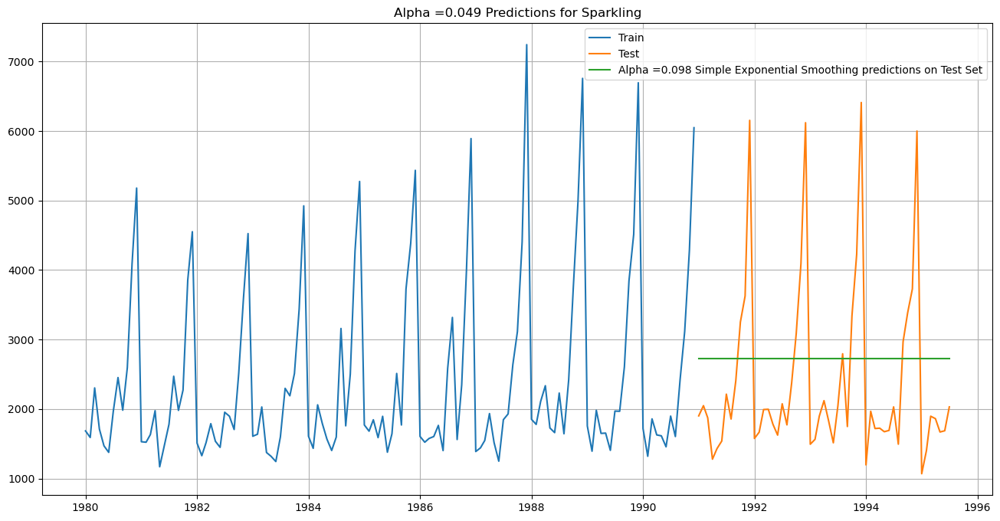

In [48]:
## Plotting on both the Training and Test data

plt.figure(figsize=(16,8))
plt.plot(SES_train_sparkling['Sparkling'], label='Train')
plt.plot(SES_test_sparkling['Sparkling'], label='Test')

plt.plot(SES_test_sparkling['predict'], label='Alpha =0.098 Simple Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Alpha =0.049 Predictions for Sparkling');

In [49]:
## Test Data

rmse_ses_test_sparkling = metrics.mean_squared_error(SES_test_sparkling['Sparkling'],SES_test_sparkling['predict'],squared=False)
print("For Alpha =0.049 Simple Exponential Smoothing Model forecast on the Test Data for Sparkling, RMSE is %3.3f" %(rmse_ses_test_sparkling))


For Alpha =0.049 Simple Exponential Smoothing Model forecast on the Test Data for Sparkling, RMSE is 1316.135


In [50]:
resultsDf_9 = pd.DataFrame({'Test RMSE Sparkling': [rmse_ses_test_sparkling]},index=['Alpha=0.049,SimpleExponentialSmoothing'])

resultsDf_sparkling = pd.concat([resultsDf_sparkling, resultsDf_9])
resultsDf_sparkling

,Test RMSE Sparkling
Linear Regression,1389.135175
Naive Model,3864.279352
Simple Average Model,1275.081804
2pointTrailingMovingAverage,813.400684
4pointTrailingMovingAverage,1156.589694
6pointTrailingMovingAverage,1283.927428
9pointTrailingMovingAverage,1346.278315
"Alpha=0.049,SimpleExponentialSmoothing",1316.135411


In [51]:
## First we will define an empty dataframe to store our values from the loop

resultsDf_sparkling_12 = pd.DataFrame({'Alpha Values':[],'Train RMSE':[],'Test RMSE': []})
resultsDf_sparkling_12

,Alpha Values,Train RMSE,Test RMSE


In [52]:
for i in np.arange(0.01,0.1,0.01):
    model_SES_alpha_i_sparkling = model_SES_sparkling.fit(smoothing_level=i,optimized=False,use_brute=True)
    SES_train_sparkling['predict',i] = model_SES_alpha_i_sparkling.fittedvalues
    SES_test_sparkling['predict',i] = model_SES_alpha_i_sparkling.forecast(steps=1000)
    
    rmse_model5_train_i_sparkling = metrics.mean_squared_error(SES_train_sparkling['Sparkling'],SES_train_sparkling['predict',i],squared=False)
    
    rmse_model5_test_i_sparkling = metrics.mean_squared_error(SES_test_sparkling['Sparkling'],SES_test_sparkling['predict',i],squared=False)
    
    resultsDf_sparkling_12 = resultsDf_sparkling_12.append({'Alpha Values':i,'Train RMSE':rmse_model5_train_i_sparkling 
                                      ,'Test RMSE':rmse_model5_test_i_sparkling}, ignore_index=True)

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\1467563243.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_sparkling_12 = resultsDf_sparkling_12.append({'Alpha Values':i,'Train RMSE':rmse_model5_train_i_sparkling
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\1467563243.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_sparkling_12 = resultsDf_sparkling_12.append({'Alpha Values':i,'Train RMSE':rmse_model5_train_i_sparkling
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\1467563243.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_sparkling_12 = resultsDf_sparkling_12.append({'Alpha Values':i,'Train RMSE':rmse_model5_train_i_sparkling
C:\Users\cheru\AppData\Local\Temp\ipykernel

In [53]:
resultsDf_sparkling_12.sort_values(by=['Test RMSE'],ascending=True)

,Alpha Values,Train RMSE,Test RMSE
1,0.02,1328.406554,1279.495201
0,0.01,1361.997529,1281.032699
2,0.03,1318.846031,1293.110073
3,0.04,1317.138929,1305.462953
4,0.05,1318.429335,1316.411742
5,0.06,1320.978240,1326.919366
6,0.07,1324.062570,1337.684405
7,0.08,1327.343381,1349.163420
8,0.09,1330.646063,1361.662607


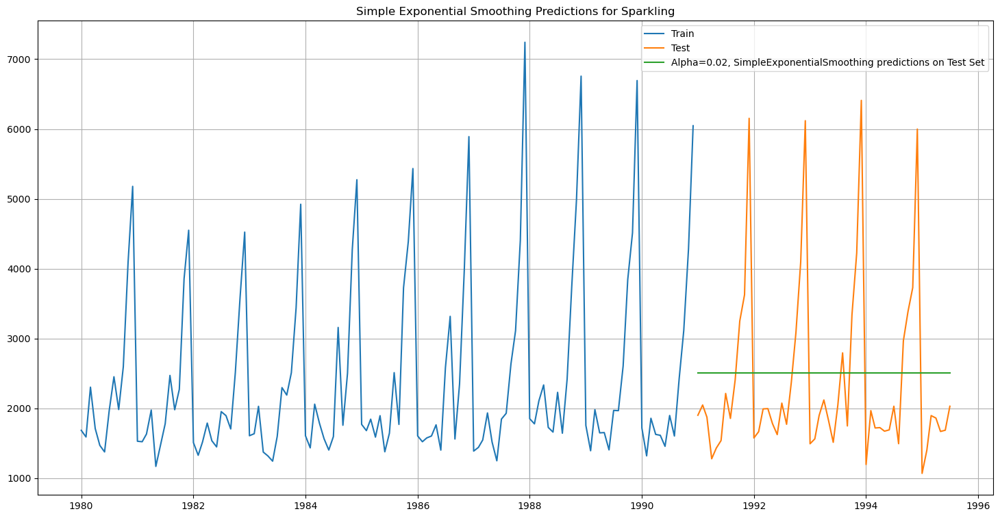

In [54]:
## Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(SES_train_sparkling['Sparkling'], label='Train')
plt.plot(SES_test_sparkling['Sparkling'], label='Test')

plt.plot(SES_test_sparkling['predict', 0.02], label='Alpha=0.02, SimpleExponentialSmoothing predictions on Test Set')


plt.legend(loc='best')
plt.grid()
plt.title('Simple Exponential Smoothing Predictions for Sparkling');

In [55]:
resultsDf_13 = pd.DataFrame({'Test RMSE Sparkling': [resultsDf_sparkling_12.sort_values(by=['Test RMSE'],ascending=True).values[0][2]]}
                           ,index=['Alpha=0.02,SimpleExponentialSmoothing'])

resultsDf_sparkling = pd.concat([resultsDf_sparkling, resultsDf_13])
resultsDf_sparkling

,Test RMSE Sparkling
Linear Regression,1389.135175
Naive Model,3864.279352
Simple Average Model,1275.081804
2pointTrailingMovingAverage,813.400684
4pointTrailingMovingAverage,1156.589694
6pointTrailingMovingAverage,1283.927428
9pointTrailingMovingAverage,1346.278315
"Alpha=0.049,SimpleExponentialSmoothing",1316.135411
"Alpha=0.02,SimpleExponentialSmoothing",1279.495201


### Model 6: Double Explonential Smoothing (Holt's Model)

In [56]:
DES_train_sparkling = train_sparkling.copy()
DES_test_sparkling = test_sparkling.copy()

In [57]:
# Initializing the Double Exponential Smoothing Model
model_DES_sparkling = Holt(DES_train_sparkling,initialization_method='estimated')
# Fitting the model
model_DES_sparkling = model_DES_sparkling.fit()

print('')
print('Holt model Exponential Smoothing Estimated Parameters ==')
print('')
print(model_DES_sparkling.params)


Holt model Exponential Smoothing Estimated Parameters ==

{'smoothing_level': 0.6649999999999999, 'smoothing_trend': 0.0001, 'smoothing_seasonal': nan, 'damping_trend': nan, 'initial_level': 1502.1999999999991, 'initial_trend': 74.87272727272739, 'initial_seasons': array([], dtype=float64), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


In [58]:
# Forecasting using this model for the duration of the test set
DES_predict_sparkling =  model_DES_sparkling.forecast(len(DES_test_sparkling))
DES_predict_sparkling

1991-01-01    5401.733026
1991-02-01    5476.005230
1991-03-01    5550.277433
1991-04-01    5624.549637
1991-05-01    5698.821840
1991-06-01    5773.094044
1991-07-01    5847.366248
1991-08-01    5921.638451
1991-09-01    5995.910655
1991-10-01    6070.182858
1991-11-01    6144.455062
1991-12-01    6218.727266
1992-01-01    6292.999469
1992-02-01    6367.271673
1992-03-01    6441.543876
1992-04-01    6515.816080
1992-05-01    6590.088284
1992-06-01    6664.360487
1992-07-01    6738.632691
1992-08-01    6812.904894
1992-09-01    6887.177098
1992-10-01    6961.449302
1992-11-01    7035.721505
1992-12-01    7109.993709
1993-01-01    7184.265912
1993-02-01    7258.538116
1993-03-01    7332.810320
1993-04-01    7407.082523
1993-05-01    7481.354727
1993-06-01    7555.626930
1993-07-01    7629.899134
1993-08-01    7704.171338
1993-09-01    7778.443541
1993-10-01    7852.715745
1993-11-01    7926.987948
1993-12-01    8001.260152
1994-01-01    8075.532356
1994-02-01    8149.804559
1994-03-01  

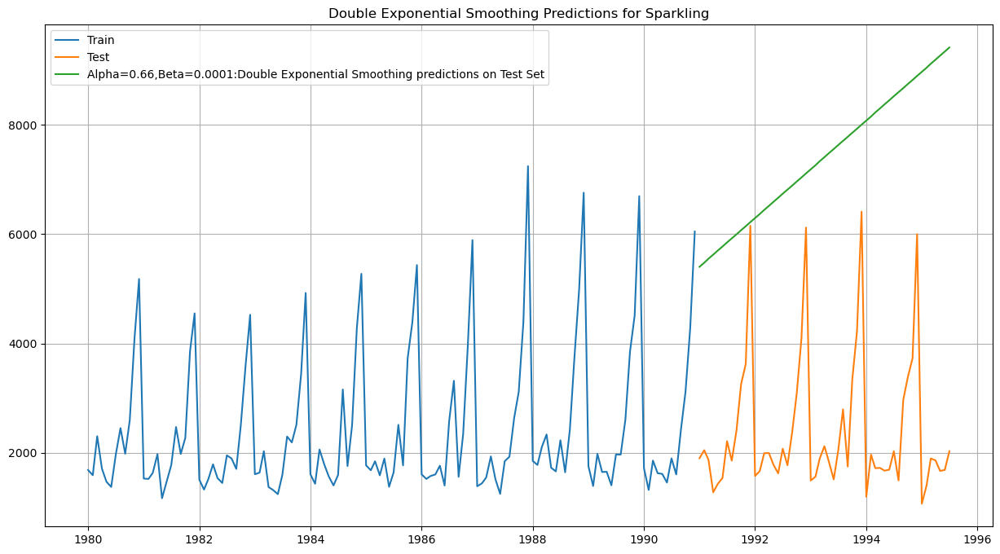

In [59]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(DES_train_sparkling, label='Train')
plt.plot(DES_test_sparkling, label='Test')

plt.plot(DES_predict_sparkling, label='Alpha=0.66,Beta=0.0001:Double Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Double Exponential Smoothing Predictions for Sparkling');

In [60]:
from sklearn.metrics import mean_squared_error
print('DES RMSE:',mean_squared_error(DES_test_sparkling.values,DES_predict_sparkling.values,squared=False))

DES RMSE: 5291.8798332269125


In [61]:
resultsDf_temp = pd.DataFrame({'Test RMSE Sparkling': [mean_squared_error(DES_test_sparkling.values,DES_predict_sparkling.values,squared=False)]}
                           ,index=['Alpha=0.66,Beta=0.0001:DoubleExponentialSmoothing'])

resultsDf_sparkling = pd.concat([resultsDf_sparkling, resultsDf_temp])
resultsDf_sparkling

,Test RMSE Sparkling
Linear Regression,1389.135175
Naive Model,3864.279352
Simple Average Model,1275.081804
2pointTrailingMovingAverage,813.400684
4pointTrailingMovingAverage,1156.589694
6pointTrailingMovingAverage,1283.927428
9pointTrailingMovingAverage,1346.278315
"Alpha=0.049,SimpleExponentialSmoothing",1316.135411
"Alpha=0.02,SimpleExponentialSmoothing",1279.495201
"Alpha=0.66,Beta=0.0001:DoubleExponentialSmoothing",5291.879833


In [62]:
resultsDf_blank = pd.DataFrame({'Alpha Values':[],'Beta Values':[],'Train RMSE':[],'Test RMSE': []})
resultsDf_blank

,Alpha Values,Beta Values,Train RMSE,Test RMSE


In [63]:
model_DES_sparkling = Holt(DES_train_sparkling['Sparkling'])
for i in np.arange(0.1,1.1,0.1):
    for j in np.arange(0.1,1.1,0.1):
        model_DES_alpha_i_j = model_DES_sparkling.fit(smoothing_level=i,smoothing_trend=j,optimized=False,use_brute=True)
        DES_train_sparkling['predict',i,j] = model_DES_alpha_i_j.fittedvalues
        DES_test_sparkling['predict',i,j] = model_DES_alpha_i_j.forecast(steps=1000)
        
        rmse_model6_train = metrics.mean_squared_error(DES_train_sparkling['Sparkling'],DES_train_sparkling['predict',i,j],squared=False)
        
        rmse_model6_test = metrics.mean_squared_error(DES_test_sparkling['Sparkling'],DES_test_sparkling['predict',i,j],squared=False)
        
        resultsDf_blank = resultsDf_blank.append({'Alpha Values':i,'Beta Values':j,'Train RMSE':rmse_model6_train
                                          ,'Test RMSE':rmse_model6_test}, ignore_index=True)

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3181532027.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_blank = resultsDf_blank.append({'Alpha Values':i,'Beta Values':j,'Train RMSE':rmse_model6_train
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3181532027.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_blank = resultsDf_blank.append({'Alpha Values':i,'Beta Values':j,'Train RMSE':rmse_model6_train
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3181532027.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Us

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3181532027.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_blank = resultsDf_blank.append({'Alpha Values':i,'Beta Values':j,'Train RMSE':rmse_model6_train
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3181532027.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_blank = resultsDf_blank.append({'Alpha Values':i,'Beta Values':j,'Train RMSE':rmse_model6_train
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3181532027.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_blank = resultsDf_blank.append({'Alpha Values':i,'Beta Values':j,'Train RMSE':rmse_model6_train
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3181532027.py:12: Futur

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3181532027.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_blank = resultsDf_blank.append({'Alpha Values':i,'Beta Values':j,'Train RMSE':rmse_model6_train
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3181532027.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_blank = resultsDf_blank.append({'Alpha Values':i,'Beta Values':j,'Train RMSE':rmse_model6_train
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3181532027.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_blank = resultsDf_blank.append({'Alpha Values':i,'Beta Values':j,'Train RMSE':rmse_model6_train
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3181532027.py:12: Futur

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3181532027.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_blank = resultsDf_blank.append({'Alpha Values':i,'Beta Values':j,'Train RMSE':rmse_model6_train
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3181532027.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_blank = resultsDf_blank.append({'Alpha Values':i,'Beta Values':j,'Train RMSE':rmse_model6_train
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3181532027.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_blank = resultsDf_blank.append({'Alpha Values':i,'Beta Values':j,'Train RMSE':rmse_model6_train
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3181532027.py:12: Futur

In [64]:
resultsDf_blank.sort_values(by=['Test RMSE']).head()

,Alpha Values,Beta Values,Train RMSE,Test RMSE
0,0.1,0.1,1382.520870,1778.564670
1,0.1,0.2,1413.598835,2599.439986
10,0.2,0.1,1418.041591,3611.763322
2,0.1,0.3,1445.762015,4293.084674
20,0.3,0.1,1431.169601,5908.185554


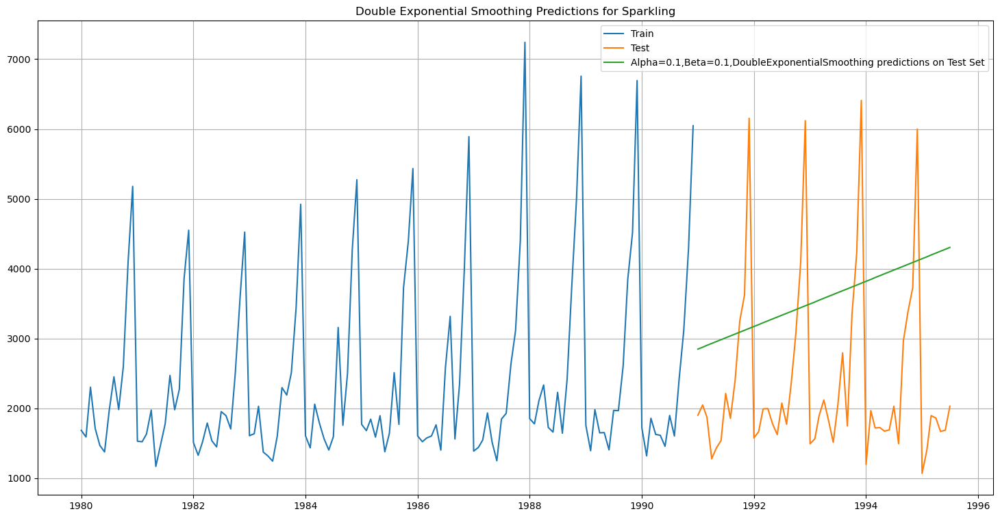

In [65]:
## Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(DES_train_sparkling['Sparkling'], label='Train')
plt.plot(DES_test_sparkling['Sparkling'], label='Test')

plt.plot(DES_test_sparkling['predict', 0.1, 0.1], label='Alpha=0.1,Beta=0.1,DoubleExponentialSmoothing predictions on Test Set')


plt.legend(loc='best')
plt.grid()
plt.title('Double Exponential Smoothing Predictions for Sparkling');

In [66]:
resultsDf_7_1 = pd.DataFrame({'Test RMSE Sparkling': [resultsDf_blank.sort_values(by=['Test RMSE']).values[0][3]]}
                           ,index=['Alpha=0.1,Beta=0.1,DoubleExponentialSmoothing'])

resultsDf_sparkling = pd.concat([resultsDf_sparkling, resultsDf_7_1])
resultsDf_sparkling

,Test RMSE Sparkling
Linear Regression,1389.135175
Naive Model,3864.279352
Simple Average Model,1275.081804
2pointTrailingMovingAverage,813.400684
4pointTrailingMovingAverage,1156.589694
6pointTrailingMovingAverage,1283.927428
9pointTrailingMovingAverage,1346.278315
"Alpha=0.049,SimpleExponentialSmoothing",1316.135411
"Alpha=0.02,SimpleExponentialSmoothing",1279.495201
"Alpha=0.66,Beta=0.0001:DoubleExponentialSmoothing",5291.879833


### Model 7: Triple Exponential Model (Holt - Winter's Model)

In [67]:
TES_train_sparkling = train_sparkling.copy()
TES_test_sparkling = test_sparkling.copy()

In [68]:
model_TES_sparkling = ExponentialSmoothing(TES_train_sparkling['Sparkling'],trend='multiplicative',seasonal='multiplicative',initialization_method='estimated')

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [69]:
model_TES_autofit_sparkling = model_TES_sparkling.fit()

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:83: RuntimeWarning: overflow encountered in matmul
  return err.T @ err


In [70]:
model_TES_autofit_sparkling.params

{'smoothing_level': 0.11107068619440803,
 'smoothing_trend': 0.049364277175342766,
 'smoothing_seasonal': 0.36216155292352714,
 'damping_trend': nan,
 'initial_level': 2356.529810158899,
 'initial_trend': 0.9986312323184912,
 'initial_seasons': array([0.71947969, 0.69883147, 0.90054243, 0.81033279, 0.66897802,
        0.66976274, 0.87942872, 1.11688229, 0.90007942, 1.17672321,
        1.83838251, 2.34601867]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [71]:
## Prediction on the test data

TES_test_sparkling['auto_predict'] = model_TES_autofit_sparkling.forecast(steps=len(TES_test_sparkling))
TES_test_sparkling.head()

,Sparkling,auto_predict
YearMonth,,
1991-01-01,1902,1591.323941
1991-02-01,2049,1360.442206
1991-03-01,1874,1767.962324
1991-04-01,1279,1661.642323
1991-05-01,1432,1547.433163


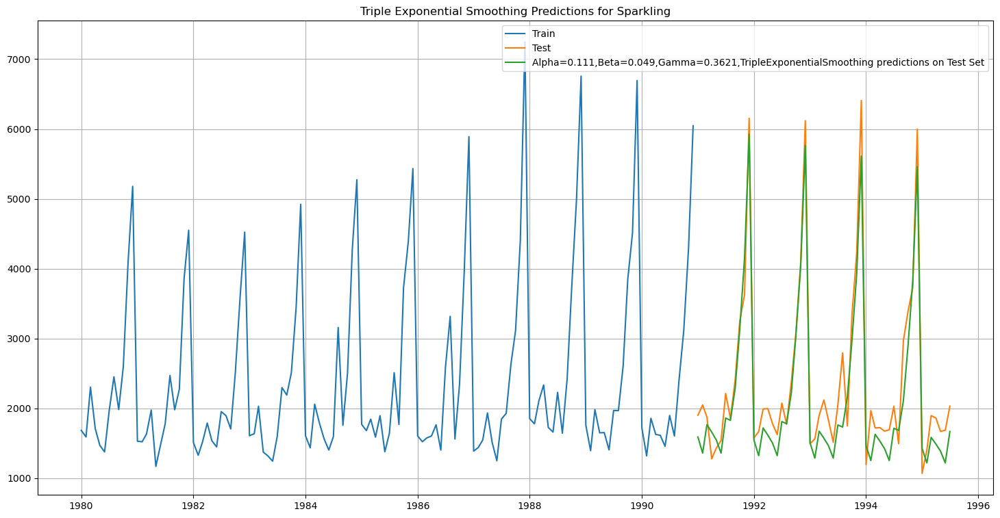

In [72]:
## Plotting on both the Training and Test using autofit

plt.figure(figsize=(18,9))
plt.plot(TES_train_sparkling['Sparkling'], label='Train')
plt.plot(TES_test_sparkling['Sparkling'], label='Test')

plt.plot(TES_test_sparkling['auto_predict'], label='Alpha=0.111,Beta=0.049,Gamma=0.3621,TripleExponentialSmoothing predictions on Test Set')


plt.legend(loc='best')
plt.grid()
plt.title('Triple Exponential Smoothing Predictions for Sparkling');

In [73]:
## Test Data

rmse_model6_test_1_sparkling = metrics.mean_squared_error(TES_test_sparkling['Sparkling'],TES_test_sparkling['auto_predict'],squared=False)
print("For Alpha=0.111,Beta=0.049,Gamma=0.3621, Triple Exponential Smoothing Model forecast on the Test Data,  RMSE is %3.3f" %(rmse_model6_test_1_sparkling))

For Alpha=0.111,Beta=0.049,Gamma=0.3621, Triple Exponential Smoothing Model forecast on the Test Data,  RMSE is 380.382


In [74]:
resultsDf_8_1 = pd.DataFrame({'Test RMSE Sparkling': [rmse_model6_test_1_sparkling]}
                           ,index=['Alpha=0.111,Beta=0.049,Gamma=0.3621,TripleExponentialSmoothing'])

resultsDf_sparkling = pd.concat([resultsDf_sparkling, resultsDf_8_1])
resultsDf_sparkling

,Test RMSE Sparkling
Linear Regression,1389.135175
Naive Model,3864.279352
Simple Average Model,1275.081804
2pointTrailingMovingAverage,813.400684
4pointTrailingMovingAverage,1156.589694
6pointTrailingMovingAverage,1283.927428
9pointTrailingMovingAverage,1346.278315
"Alpha=0.049,SimpleExponentialSmoothing",1316.135411
"Alpha=0.02,SimpleExponentialSmoothing",1279.495201
"Alpha=0.66,Beta=0.0001:DoubleExponentialSmoothing",5291.879833


In [75]:
## First we will define an empty dataframe to store our values from the loop

resultsDf_8_2 = pd.DataFrame({'Alpha Values':[],'Beta Values':[],'Gamma Values':[],'Train RMSE':[],'Test RMSE': []})
resultsDf_8_2

,Alpha Values,Beta Values,Gamma Values,Train RMSE,Test RMSE


In [76]:
try:
    for i in np.arange(0.1,1.1,0.1):
        for j in np.arange(0.1,1.1,0.1):
            for k in np.arange(0.1,1.1,0.1):
                model_TES_alpha_i_j_k = model_TES_sparkling.fit(smoothing_level=i,smoothing_trend=j,smoothing_seasonal=k,optimized=False,use_brute=True)
                TES_train_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.fittedvalues
                TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)

                rmse_model8_train = metrics.mean_squared_error(TES_train_sparkling['Sparkling'],TES_train_sparkling['predict',i,j,k],squared=False)

                rmse_model8_test = metrics.mean_squared_error(TES_test_sparkling['Sparkling'],TES_test_sparkling['predict',i,j,k],squared=False)

                resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
                                                      'Train RMSE':rmse_model8_train,'Test RMSE':rmse_model8_test}
                                                     , ignore_index=True)

except Exception as e:
    print("An error occurred:", e)

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_train_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.fittedvalues
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To g

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_train_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.fittedvalues
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_train_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.fittedvalues
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1352: RuntimeWarning: overflow encountered in power
  b[nobs:] = dampen(b[nobs], phi_h)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1353: RuntimeWarning: overflow encountered in multiply
  trend = trended(lvls, b)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'A

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1352: RuntimeWarning: overflow encountered in power
  b[nobs:] = dampen(b[nobs], phi_h)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1353: RuntimeWarning: overflow encountered in multiply
  trend = trended(lvls, b)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'A

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1352: RuntimeWarning: overflow encountered in power
  b[nobs:] = dampen(b[nobs], phi_h)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1353: RuntimeWarning: overflow encountered in multiply
  trend = trended(lvls, b)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'A

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1352: RuntimeWarning: overflow encountered in power
  b[nobs:] = dampen(b[nobs], phi_h)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1353: RuntimeWarning: overflow encountered in multiply
  trend = trended(lvls, b)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'A

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_train_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.fittedvalues
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1352: RuntimeWarning: overflow encountered in power
  b[nobs:] = dampen(b[nobs], phi_h)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1353: RuntimeWarning: overflow encountered in multiply
  trend = trended(lvls, b)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'A

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_train_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.fittedvalues
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1352: RuntimeWarning: overflow encountered in power
  b[nobs:] = dampen(b[nobs], phi_h)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1353: RuntimeWarning: overflow encountered in multiply
  trend = trended(lvls, b)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'A

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1352: RuntimeWarning: overflow encountered in power
  b[nobs:] = dampen(b[nobs], phi_h)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1353: RuntimeWarning: overflow encountered in multiply
  trend = trended(lvls, b)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:446: RuntimeWarning: overflow encountered in square
  output_errors = np.average((y_true - y_pred) ** 2, axis=0, weights=sample_weight)
C:\Users\cheru\AppData\Local\Temp

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1352: RuntimeWarning: overflow encountered in power
  b[nobs:] = dampen(b[nobs], phi_h)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1353: RuntimeWarning: overflow encountered in multiply
  trend = trended(lvls, b)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'A

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1352: RuntimeWarning: overflow encountered in power
  b[nobs:] = dampen(b[nobs], phi_h)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1353: RuntimeWarning: overflow encountered in multiply
  trend = trended(lvls, b)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1357: RuntimeWarning: overflow encountered in multiply
  fitted = trend * s[:-m]
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning:

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1352: RuntimeWarning: overflow encountered in power
  b[nobs:] = dampen(b[nobs], phi_h)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1353: RuntimeWarning: overflow encountered in multiply
  trend = trended(lvls, b)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'A

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1352: RuntimeWarning: overflow encountered in power
  b[nobs:] = dampen(b[nobs], phi_h)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1353: RuntimeWarning: overflow encountered in multiply
  trend = trended(lvls, b)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\anaconda3\lib\site-packages\sklearn\metrics\_regression.py:446: RuntimeWarning: overflow encountered in square
  output_errors = np.average((y_true - y_pred) ** 2, axis=0, weights=sample_weight)
C:\Users\cheru\AppData\Local\Temp

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1352: RuntimeWarning: overflow encountered in power
  b[nobs:] = dampen(b[nobs], phi_h)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1353: RuntimeWarning: overflow encountered in multiply
  trend = trended(lvls, b)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1357: RuntimeWarning: overflow encountered in multiply
  fitted = trend * s[:-m]
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning:

An error occurred: Input contains infinity or a value too large for dtype('float64').


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_sparkling['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3935205965.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instea

In [77]:
resultsDf_8_2.sort_values(by=['Test RMSE']).head()

,Alpha Values,Beta Values,Gamma Values,Train RMSE,Test RMSE
302,0.4,0.1,0.3,381.106645,326.579641
201,0.3,0.1,0.2,375.956510,342.464413
110,0.2,0.2,0.1,395.987244,345.931571
131,0.2,0.4,0.2,401.704682,349.425739
222,0.3,0.3,0.3,396.692796,353.602587


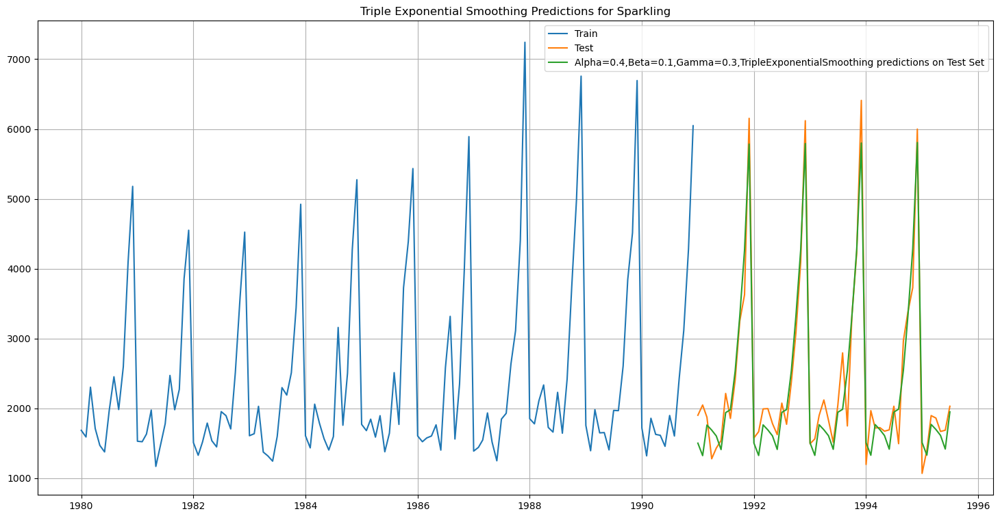

In [78]:
## Plotting on both the Training and Test data using brute force alpha, beta and gamma determination

plt.figure(figsize=(18,9))
plt.plot(TES_train_sparkling['Sparkling'], label='Train')
plt.plot(TES_test_sparkling['Sparkling'], label='Test')

#The value of alpha and beta is taken like that by python
plt.plot(TES_test_sparkling['predict', 0.40000000000000004,0.10000000000000001,0.30000000000000003], label='Alpha=0.4,Beta=0.1,Gamma=0.3,TripleExponentialSmoothing predictions on Test Set')


plt.legend(loc='best')
plt.grid()
plt.title('Triple Exponential Smoothing Predictions for Sparkling');

In [79]:
resultsDf_8_3 = pd.DataFrame({'Test RMSE Sparkling': [resultsDf_8_2.sort_values(by=['Test RMSE']).values[0][4]]}
                           ,index=['Alpha=0.4,Beta=0.1,Gamma=0.3,TripleExponentialSmoothing'])

resultsDf_sparkling = pd.concat([resultsDf_sparkling, resultsDf_8_3])
resultsDf_sparkling

,Test RMSE Sparkling
Linear Regression,1389.135175
Naive Model,3864.279352
Simple Average Model,1275.081804
2pointTrailingMovingAverage,813.400684
4pointTrailingMovingAverage,1156.589694
6pointTrailingMovingAverage,1283.927428
9pointTrailingMovingAverage,1346.278315
"Alpha=0.049,SimpleExponentialSmoothing",1316.135411
"Alpha=0.02,SimpleExponentialSmoothing",1279.495201
"Alpha=0.66,Beta=0.0001:DoubleExponentialSmoothing",5291.879833


### Checking for stationarity of the data on which the model is being built on using appropriate statistical tests along with the hypothesis for the statistical test. 

Ho: Time series is non-stationary

Ha: Time series is stationary

Also given that alpha = 0.05

In [80]:
## Test for stationarity of the series - Dicky Fuller test

from statsmodels.tsa.stattools import adfuller
def test_stationarity(timeseries):
    
    #Determing rolling statistics
    rolmean = timeseries.rolling(window=7).mean() #determining the rolling mean
    rolstd = timeseries.rolling(window=7).std()   #determining the rolling standard deviation

    #Plot rolling statistics:
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    #Perform Dickey-Fuller test:
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput,'\n')

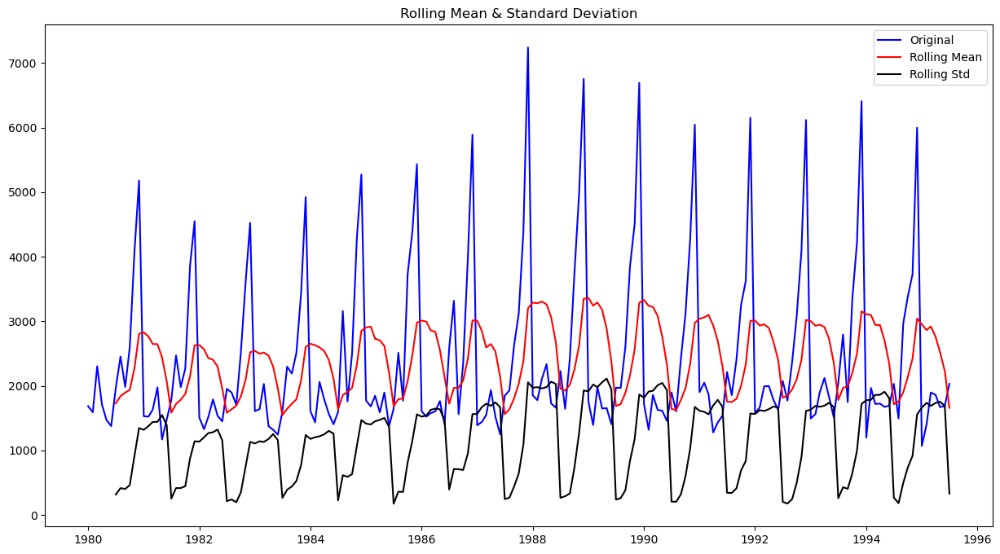

Results of Dickey-Fuller Test:
Test Statistic                  -1.360497
p-value                          0.601061
#Lags Used                      11.000000
Number of Observations Used    175.000000
Critical Value (1%)             -3.468280
Critical Value (5%)             -2.878202
Critical Value (10%)            -2.575653
dtype: float64 



In [81]:
test_stationarity(df_sparkling['Sparkling'])

Although from the graphs, it looks like the series is stationary but p-value (0.6) is greater than alpha (0.05) 

Therefore, we fail to reject Null hypothesis. The series is non-stationary

Let us take a difference of order 1 and check whether the Time Series is stationary or not.

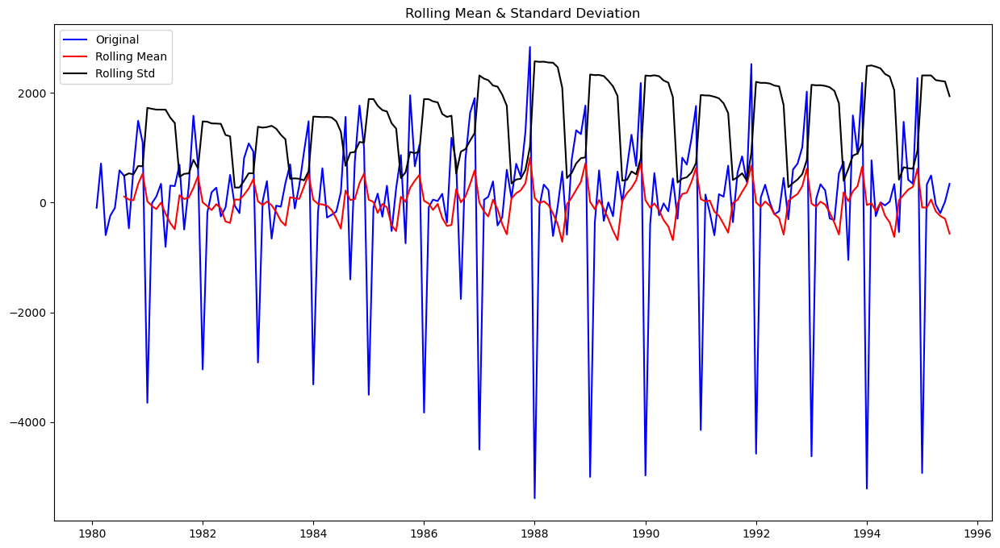

Results of Dickey-Fuller Test:
Test Statistic                 -45.050301
p-value                          0.000000
#Lags Used                      10.000000
Number of Observations Used    175.000000
Critical Value (1%)             -3.468280
Critical Value (5%)             -2.878202
Critical Value (10%)            -2.575653
dtype: float64 



In [82]:
test_stationarity(df_sparkling['Sparkling'].diff().dropna())

For this series, the p-value (0.0000) is less than alpha (0.05), therefore we can reject the null hypothesis.

Therefore the series at difference of order 1 is stationary

### Building an automated version of the ARIMA/SARIMA model in which the parameters are selected using the lowest Akaike Information Criteria (AIC) on the training data and evaluating this model on the test data using RMSE.

First we check if the data is stationary or not

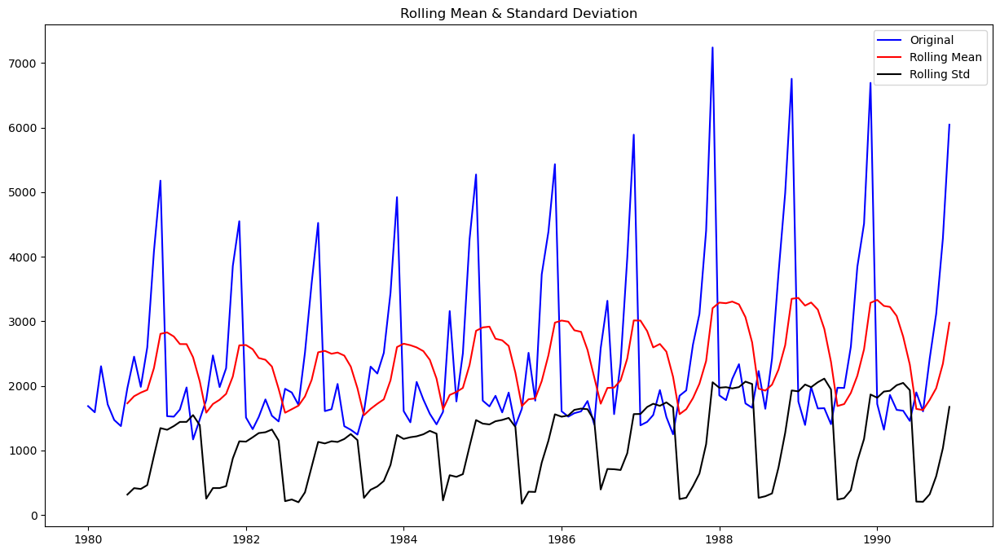

Results of Dickey-Fuller Test:
Test Statistic                  -1.208926
p-value                          0.669744
#Lags Used                      12.000000
Number of Observations Used    119.000000
Critical Value (1%)             -3.486535
Critical Value (5%)             -2.886151
Critical Value (10%)            -2.579896
dtype: float64 



In [83]:
test_stationarity(train_sparkling['Sparkling'])

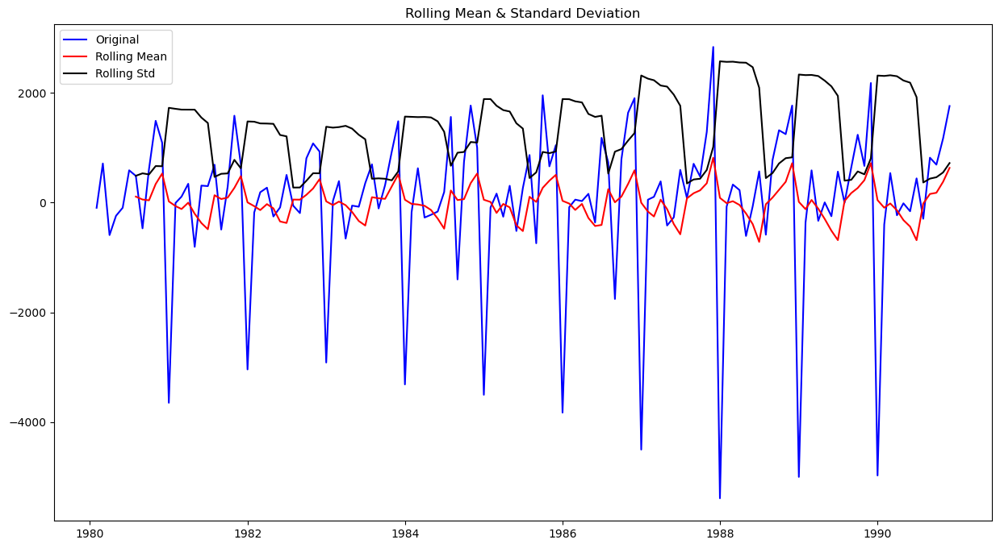

Results of Dickey-Fuller Test:
Test Statistic                -8.005007e+00
p-value                        2.280104e-12
#Lags Used                     1.100000e+01
Number of Observations Used    1.190000e+02
Critical Value (1%)           -3.486535e+00
Critical Value (5%)           -2.886151e+00
Critical Value (10%)          -2.579896e+00
dtype: float64 



In [84]:
test_stationarity(train_sparkling['Sparkling'].diff().dropna())

We check the ACF and PACF plots now

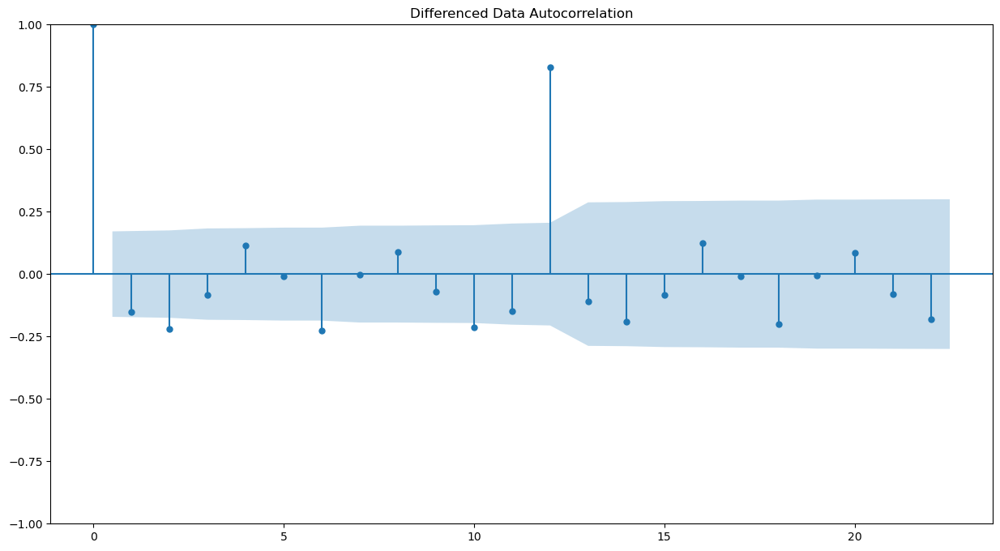

In [85]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plot_acf(train_sparkling['Sparkling'].diff().dropna(),title='Differenced Data Autocorrelation')
plt.show()

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


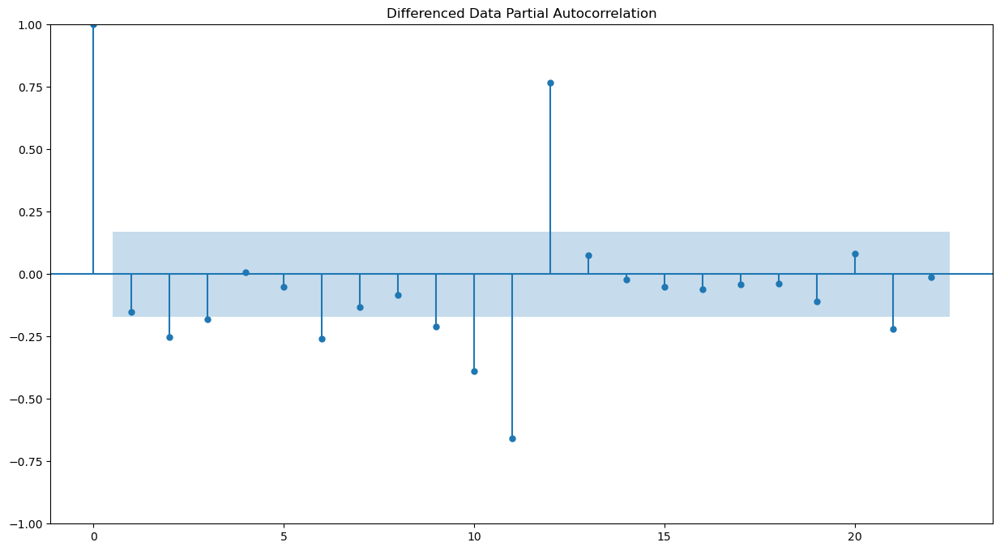

In [86]:
plot_pacf(train_sparkling['Sparkling'].diff().dropna(),title='Differenced Data Partial Autocorrelation')
plt.show()

In [87]:
## The following loop helps us in getting a combination of different parameters of p and q in the range of 0 and 2
## We have kept the value of d as 1 as we need to take a difference of the series to make it stationary.

import itertools
p = q = range(0, 2)
d= range(1,2)
pdq = list(itertools.product(p, d, q))
print('Some parameter combinations for the Model...')
for i in range(1,len(pdq)):
    print('Model: {}'.format(pdq[i]))

Some parameter combinations for the Model...
Model: (0, 1, 1)
Model: (1, 1, 0)
Model: (1, 1, 1)


In [88]:
# Creating an empty Dataframe with column names only
ARIMA_AIC = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AIC

,param,AIC


In [90]:
from statsmodels.tsa.arima.model import ARIMA

for param in pdq:
    ARIMA_model = ARIMA(train_sparkling['Sparkling'].values, order=param).fit()
    print('ARIMA{} - AIC:{}'.format(param, ARIMA_model.aic))
    ARIMA_AIC = ARIMA_AIC.append({'param':param, 'AIC': ARIMA_model.aic}, ignore_index=True)

ARIMA(0, 1, 0) - AIC:2267.6630357855465
ARIMA(0, 1, 1) - AIC:2263.0600155918555
ARIMA(1, 1, 0) - AIC:2266.6085393190097
ARIMA(1, 1, 1) - AIC:2235.7550946649694


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2606305739.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ARIMA_AIC = ARIMA_AIC.append({'param':param, 'AIC': ARIMA_model.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2606305739.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ARIMA_AIC = ARIMA_AIC.append({'param':param, 'AIC': ARIMA_model.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2606305739.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ARIMA_AIC = ARIMA_AIC.append({'param':param, 'AIC': ARIMA_model.aic}, ignore_index=True)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA p

In [92]:
## Sort the above AIC values in the ascending order to get the parameters for the minimum AIC value

ARIMA_AIC.sort_values(by='AIC',ascending=True).head()

,param,AIC
3,"(1, 1, 1)",2235.755095
7,"(1, 1, 1)",2235.755095
1,"(0, 1, 1)",2263.060016
5,"(0, 1, 1)",2263.060016
2,"(1, 1, 0)",2266.608539


In [93]:
auto_ARIMA = ARIMA(train_sparkling['Sparkling'], order=(1,1,1))

results_auto_ARIMA = auto_ARIMA.fit()

print(results_auto_ARIMA.summary())

                               SARIMAX Results                                
Dep. Variable:              Sparkling   No. Observations:                  132
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -1114.878
Date:                Sun, 02 Apr 2023   AIC                           2235.755
Time:                        22:38:33   BIC                           2244.381
Sample:                    01-01-1980   HQIC                          2239.260
                         - 12-01-1990                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4494      0.043     10.366      0.000       0.364       0.534
ma.L1         -0.9996      0.102     -9.811      0.000      -1.199      -0.800
sigma2      1.401e+06   7.57e-08   1.85e+13      0.0

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


In [97]:
predicted_auto_ARIMA = results_auto_ARIMA.forecast(steps=len(test_sparkling))

In [98]:
from sklearn.metrics import  mean_squared_error

test_array = test_sparkling['Sparkling'].values
rmse = mean_squared_error(test_array, predicted_auto_ARIMA, squared=False)
print(rmse)

1319.9367323749252


In [99]:
resultsDf_8_1 = pd.DataFrame({'Test RMSE Sparkling': [rmse]}
                           ,index=['ARIMA(1,1,1) AIC criteria'])

resultsDf_sparkling = pd.concat([resultsDf_sparkling, resultsDf_8_1])
resultsDf_sparkling

,Test RMSE Sparkling
Linear Regression,1389.135175
Naive Model,3864.279352
Simple Average Model,1275.081804
2pointTrailingMovingAverage,813.400684
4pointTrailingMovingAverage,1156.589694
6pointTrailingMovingAverage,1283.927428
9pointTrailingMovingAverage,1346.278315
"Alpha=0.049,SimpleExponentialSmoothing",1316.135411
"Alpha=0.02,SimpleExponentialSmoothing",1279.495201
"Alpha=0.66,Beta=0.0001:DoubleExponentialSmoothing",5291.879833


We would now create a SARIMA model for the same

Seasonality of 12, we will check

In [100]:
import itertools
p = q = range(0, 3)
d= range(1,2)
D = range(0,1)
pdq = list(itertools.product(p, d, q))
model_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, D, q))]
print('Examples of some parameter combinations for Model...')
for i in range(1,len(pdq)):
    print('Model: {}{}'.format(pdq[i], model_pdq[i]))

Examples of some parameter combinations for Model...
Model: (0, 1, 1)(0, 0, 1, 12)
Model: (0, 1, 2)(0, 0, 2, 12)
Model: (1, 1, 0)(1, 0, 0, 12)
Model: (1, 1, 1)(1, 0, 1, 12)
Model: (1, 1, 2)(1, 0, 2, 12)
Model: (2, 1, 0)(2, 0, 0, 12)
Model: (2, 1, 1)(2, 0, 1, 12)
Model: (2, 1, 2)(2, 0, 2, 12)


In [101]:
SARIMA_AIC = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AIC

,param,seasonal,AIC


In [105]:
import statsmodels.api as sm

for param in pdq:
    for param_seasonal in model_pdq:
        SARIMA_model = sm.tsa.statespace.SARIMAX(train_sparkling['Sparkling'].values,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            
        results_SARIMA = SARIMA_model.fit(maxiter=1000)
        print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_SARIMA.aic))
        SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)

SARIMA(0, 1, 0)x(0, 0, 0, 12) - AIC:2251.3597196862966
SARIMA(0, 1, 0)x(0, 0, 1, 12) - AIC:1956.2614616844364


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 0)x(0, 0, 2, 12) - AIC:1723.1533640239343
SARIMA(0, 1, 0)x(1, 0, 0, 12) - AIC:1837.436602245668


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 0)x(1, 0, 1, 12) - AIC:1806.9905301390017


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 0)x(1, 0, 2, 12) - AIC:1633.2108735791846
SARIMA(0, 1, 0)x(2, 0, 0, 12) - AIC:1648.3776153470858


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 0)x(2, 0, 1, 12) - AIC:1647.2054158607955


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 0)x(2, 0, 2, 12) - AIC:1630.9898053920788
SARIMA(0, 1, 1)x(0, 0, 0, 12) - AIC:2230.1629078505816


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(0, 0, 1, 12) - AIC:1923.768864956678


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(0, 0, 2, 12) - AIC:1692.7089573187582
SARIMA(0, 1, 1)x(1, 0, 0, 12) - AIC:1797.1795881838225


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(1, 0, 1, 12) - AIC:1738.090319374612


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(1, 0, 2, 12) - AIC:1570.1509144332283


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(2, 0, 0, 12) - AIC:1605.6751954175318


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(2, 0, 1, 12) - AIC:1599.2245085271425


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(2, 0, 2, 12) - AIC:1570.40188240635
SARIMA(0, 1, 2)x(0, 0, 0, 12) - AIC:2187.4410101686917


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(0, 0, 1, 12) - AIC:1887.9128007201844


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(0, 0, 2, 12) - AIC:1659.8789890448265


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(1, 0, 0, 12) - AIC:1790.0326332240747


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(1, 0, 1, 12) - AIC:1724.1675070839126


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(1, 0, 2, 12) - AIC:1557.1605068154508


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(2, 0, 0, 12) - AIC:1603.9654774517985


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(2, 0, 1, 12) - AIC:1600.543880114994


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(2, 0, 2, 12) - AIC:1557.1215664860379
SARIMA(1, 1, 0)x(0, 0, 0, 12) - AIC:2250.3181267386713
SARIMA(1, 1, 0)x(0, 0, 1, 12) - AIC:1954.3938339904305


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 0)x(0, 0, 2, 12) - AIC:1721.2688476354797
SARIMA(1, 1, 0)x(1, 0, 0, 12) - AIC:1811.2440279331317


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 0)x(1, 0, 1, 12) - AIC:1788.534359473294


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 0)x(1, 0, 2, 12) - AIC:1616.4894402572515


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 0)x(2, 0, 0, 12) - AIC:1621.6355080128692


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 0)x(2, 0, 1, 12) - AIC:1617.1356132521987


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 0)x(2, 0, 2, 12) - AIC:1616.5412067720881
SARIMA(1, 1, 1)x(0, 0, 0, 12) - AIC:2204.9340491545618


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(0, 0, 1, 12) - AIC:1907.3558974136592


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(0, 0, 2, 12) - AIC:1678.0981352609579


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(1, 0, 0, 12) - AIC:1775.1424469671565


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(1, 0, 1, 12) - AIC:1739.7167467728748


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(1, 0, 2, 12) - AIC:1571.324886486919


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(2, 0, 0, 12) - AIC:1590.616160687864


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(2, 0, 1, 12) - AIC:1586.31422342699


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(2, 0, 2, 12) - AIC:1571.8069975164917
SARIMA(1, 1, 2)x(0, 0, 0, 12) - AIC:2188.4633450504634


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(0, 0, 1, 12) - AIC:1889.770830749626


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(0, 0, 2, 12) - AIC:1659.6291421738238


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(1, 0, 0, 12) - AIC:1771.8259799388086


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(1, 0, 1, 12) - AIC:1723.9871792017714


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(1, 0, 2, 12) - AIC:1555.5842476161229


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(2, 0, 0, 12) - AIC:1588.421693190764


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(2, 0, 1, 12) - AIC:1585.525082419311


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(2, 0, 2, 12) - AIC:1555.9345664130378
SARIMA(2, 1, 0)x(0, 0, 0, 12) - AIC:2227.302761872421


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(0, 0, 1, 12) - AIC:1946.4383435405377


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(0, 0, 2, 12) - AIC:1711.4123039820713


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(1, 0, 0, 12) - AIC:1780.7646066056463


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(1, 0, 1, 12) - AIC:1756.9357349798884


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(1, 0, 2, 12) - AIC:1600.9702205607582


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(2, 0, 0, 12) - AIC:1592.2403464879037


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(2, 0, 1, 12) - AIC:1587.6344987022117


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(2, 0, 2, 12) - AIC:1585.9191732167878
SARIMA(2, 1, 1)x(0, 0, 0, 12) - AIC:2199.8586131455663


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(0, 0, 1, 12) - AIC:1905.0169972786364


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(0, 0, 2, 12) - AIC:1675.423408032706


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(1, 0, 0, 12) - AIC:1792.8234290307853


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(1, 0, 1, 12) - AIC:1740.0911259846407


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(1, 0, 2, 12) - AIC:1571.9888284588778


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(2, 0, 0, 12) - AIC:1577.1235060896697


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(2, 0, 1, 12) - AIC:1573.1595851418137


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(2, 0, 2, 12) - AIC:1572.3428651085483


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(0, 0, 0, 12) - AIC:2176.8681145839205


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(0, 0, 1, 12) - AIC:1892.2372627552447


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(0, 0, 2, 12) - AIC:1661.5523433077933


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(1, 0, 0, 12) - AIC:1757.2140931230665


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(1, 0, 1, 12) - AIC:1725.608607454602


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(1, 0, 2, 12) - AIC:1557.3404017425073


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(2, 0, 0, 12) - AIC:1576.044566051418


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(2, 0, 1, 12) - AIC:1573.5475996061646


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(2, 0, 2, 12) - AIC:1560.4637131267305


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2650352169.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


In [106]:
SARIMA_AIC.sort_values(by=['AIC']).head()

,param,seasonal,AIC
51,"(1, 1, 2)","(1, 0, 2, 12)",1555.584248
54,"(1, 1, 2)","(2, 0, 2, 12)",1555.934566
27,"(0, 1, 2)","(2, 0, 2, 12)",1557.121566
24,"(0, 1, 2)","(1, 0, 2, 12)",1557.160507
78,"(2, 1, 2)","(1, 0, 2, 12)",1557.340402


In [107]:
import statsmodels.api as sm

auto_SARIMA_6 = sm.tsa.statespace.SARIMAX(train_sparkling['Sparkling'].values,
                                order=(1, 1, 2),
                                seasonal_order=(1, 0, 2, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA_6 = auto_SARIMA_6.fit(maxiter=1000)
print(results_auto_SARIMA_6.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                  132
Model:             SARIMAX(1, 1, 2)x(1, 0, 2, 12)   Log Likelihood                -770.792
Date:                            Sun, 02 Apr 2023   AIC                           1555.584
Time:                                    22:43:21   BIC                           1574.095
Sample:                                         0   HQIC                          1563.083
                                            - 132                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6281      0.255     -2.463      0.014      -1.128      -0.128
ma.L1         -0.1041      0.225   

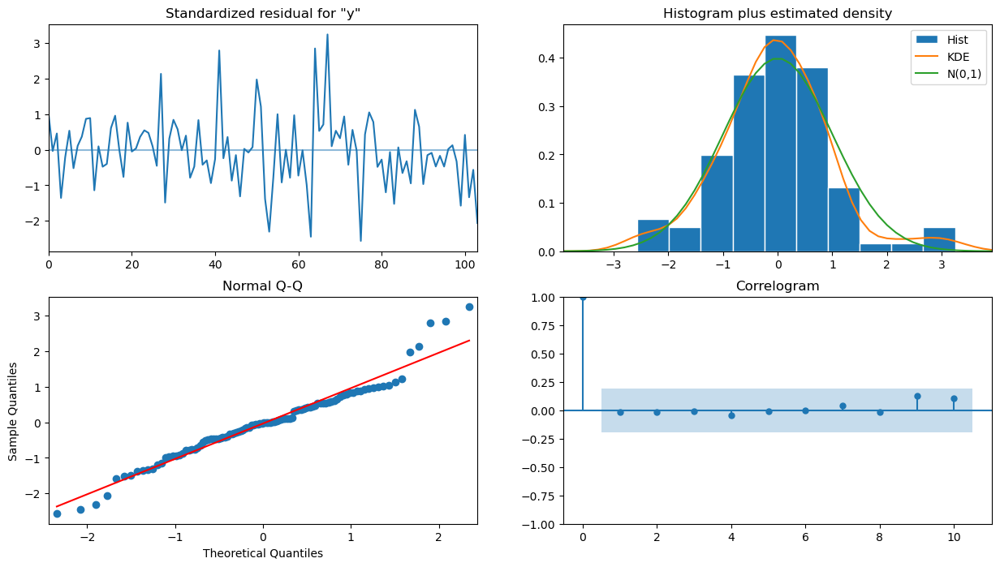

In [108]:
results_auto_SARIMA_6.plot_diagnostics()
plt.show()

In [109]:
predicted_auto_SARIMA_6 = results_auto_SARIMA_6.get_forecast(steps=len(test_sparkling))

In [110]:
predicted_auto_SARIMA_6.summary_frame(alpha=0.05).head()

y,mean,mean_se,mean_ci_lower,mean_ci_upper
0,1327.356659,388.344266,566.215885,2088.497434
1,1315.107488,402.012206,527.178043,2103.036932
2,1621.581335,402.005805,833.664436,2409.498235
3,1598.852293,407.244663,800.667421,2397.037166
4,1392.680164,407.975254,593.063361,2192.296968


In [111]:
rmse = mean_squared_error(test_sparkling['Sparkling'],predicted_auto_SARIMA_6.predicted_mean,squared=False)
print(rmse)

528.6063797137599


In [112]:
resultsDf_8_1 = pd.DataFrame({'Test RMSE Sparkling': [rmse]}
                           ,index=['SARIMA(1,1,2)(1,0,2,12) AIC criteria'])

resultsDf_sparkling = pd.concat([resultsDf_sparkling, resultsDf_8_1])
resultsDf_sparkling

,Test RMSE Sparkling
Linear Regression,1389.135175
Naive Model,3864.279352
Simple Average Model,1275.081804
2pointTrailingMovingAverage,813.400684
4pointTrailingMovingAverage,1156.589694
6pointTrailingMovingAverage,1283.927428
9pointTrailingMovingAverage,1346.278315
"Alpha=0.049,SimpleExponentialSmoothing",1316.135411
"Alpha=0.02,SimpleExponentialSmoothing",1279.495201
"Alpha=0.66,Beta=0.0001:DoubleExponentialSmoothing",5291.879833


### Building ARIMA/SARIMA models based on the cut-off points of ACF and PACF on the training data and evaluating this model on the test data using RMSE.

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


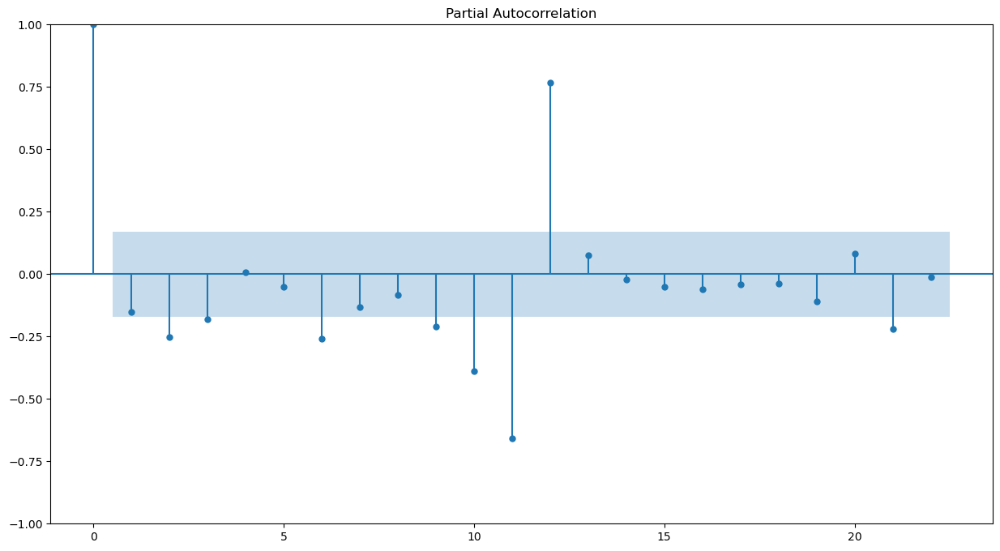

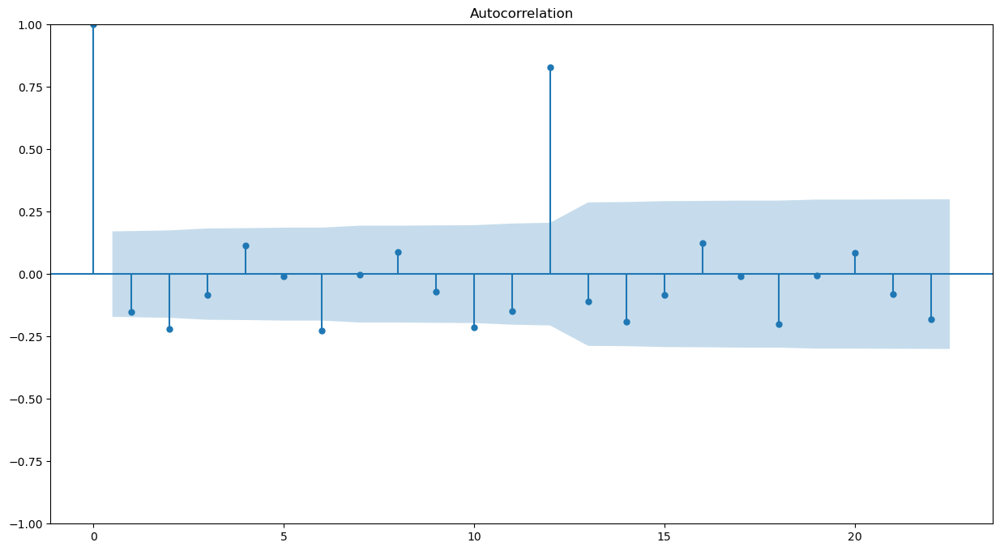

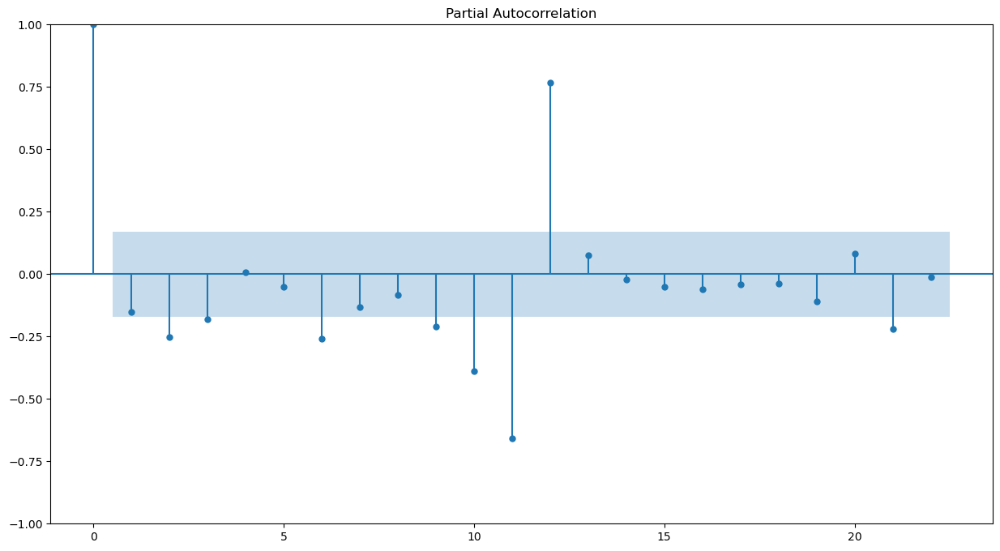

In [118]:
plot_acf(train_sparkling['Sparkling'].diff().dropna())
plot_pacf(train_sparkling['Sparkling'].diff().dropna())

#### Determine the values of p, d, and q based on the cut-off points
p = 0

d = 1

q = 0

In [114]:
manual_ARIMA = ARIMA(train_sparkling['Sparkling'].astype('float64'), order=(0,1,0))

results_manual_ARIMA = manual_ARIMA.fit()

print(results_manual_ARIMA.summary())

                               SARIMAX Results                                
Dep. Variable:              Sparkling   No. Observations:                  132
Model:                 ARIMA(0, 1, 0)   Log Likelihood               -1132.832
Date:                Sun, 02 Apr 2023   AIC                           2267.663
Time:                        22:45:10   BIC                           2270.538
Sample:                    01-01-1980   HQIC                          2268.831
                         - 12-01-1990                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      1.885e+06   1.29e+05     14.658      0.000    1.63e+06    2.14e+06
Ljung-Box (L1) (Q):                   3.07   Jarque-Bera (JB):               198.83
Prob(Q):                              0.08   Pr

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [115]:
predicted_manual_ARIMA = results_manual_ARIMA.forecast(steps=len(test_sparkling))

In [124]:
rmse = mean_squared_error(test_sparkling['Sparkling'].values, predicted_manual_ARIMA, squared=False)
print(rmse)

3864.2793518443914


In [125]:
resultsDf_8_1 = pd.DataFrame({'Test RMSE Sparkling': [rmse]}
                           ,index=['ARIMA(0,1,0) Manual plot'])

resultsDf_sparkling = pd.concat([resultsDf_sparkling, resultsDf_8_1])
resultsDf_sparkling

,Test RMSE Sparkling
Linear Regression,1389.135175
Naive Model,3864.279352
Simple Average Model,1275.081804
2pointTrailingMovingAverage,813.400684
4pointTrailingMovingAverage,1156.589694
6pointTrailingMovingAverage,1283.927428
9pointTrailingMovingAverage,1346.278315
"Alpha=0.049,SimpleExponentialSmoothing",1316.135411
"Alpha=0.02,SimpleExponentialSmoothing",1279.495201
"Alpha=0.66,Beta=0.0001:DoubleExponentialSmoothing",5291.879833


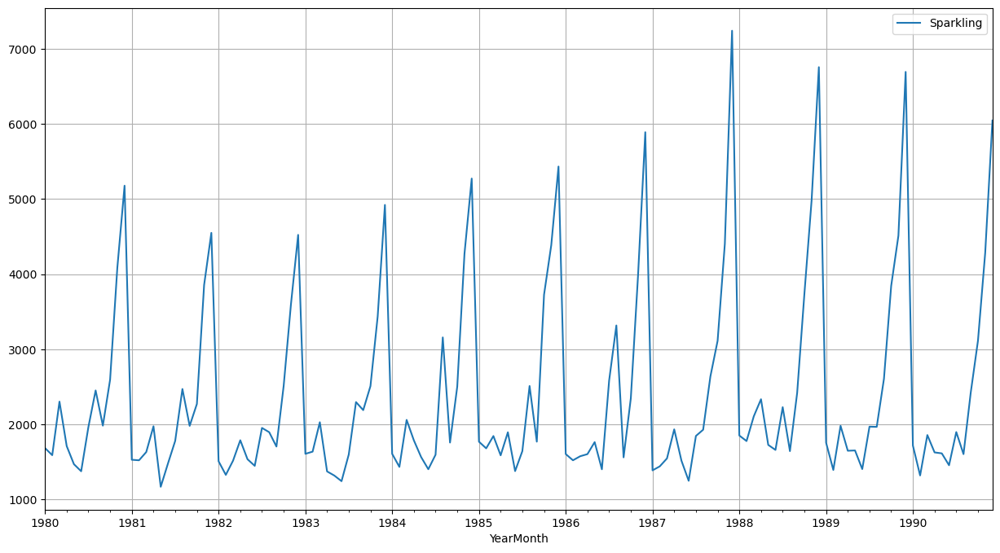

In [126]:
train_sparkling.plot()
plt.grid();

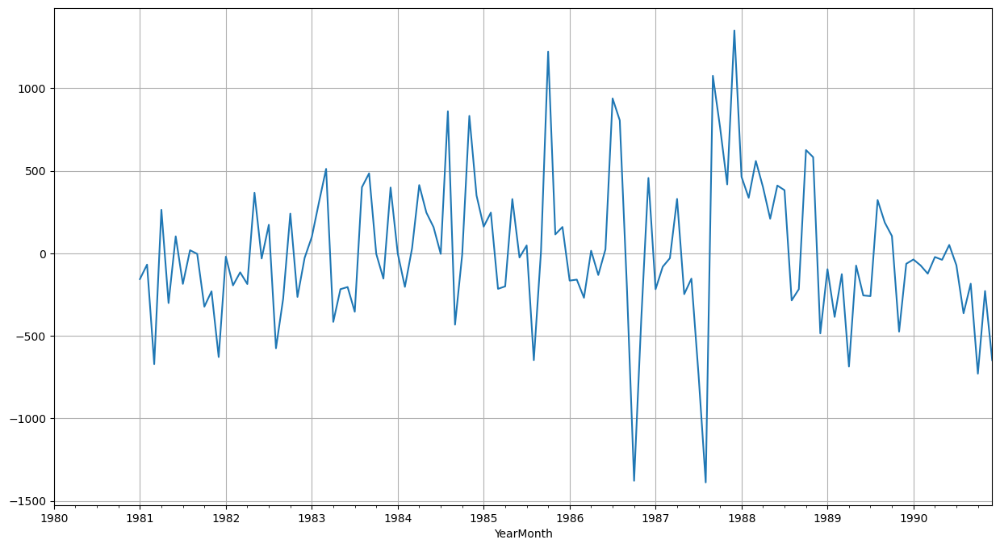

In [127]:
(train_sparkling['Sparkling'].diff(12)).plot()
plt.grid();

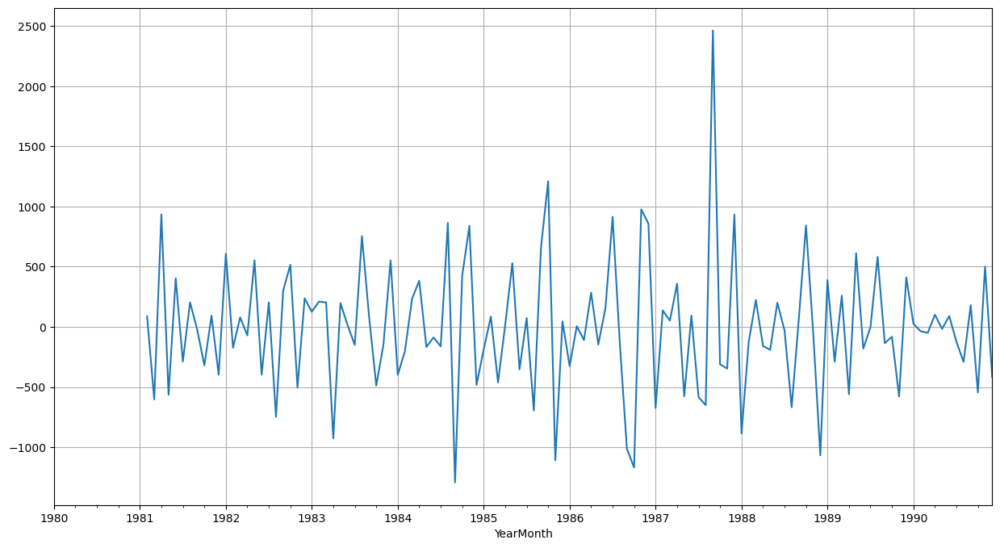

In [128]:
(train_sparkling['Sparkling'].diff(12)).diff().plot()
plt.grid();

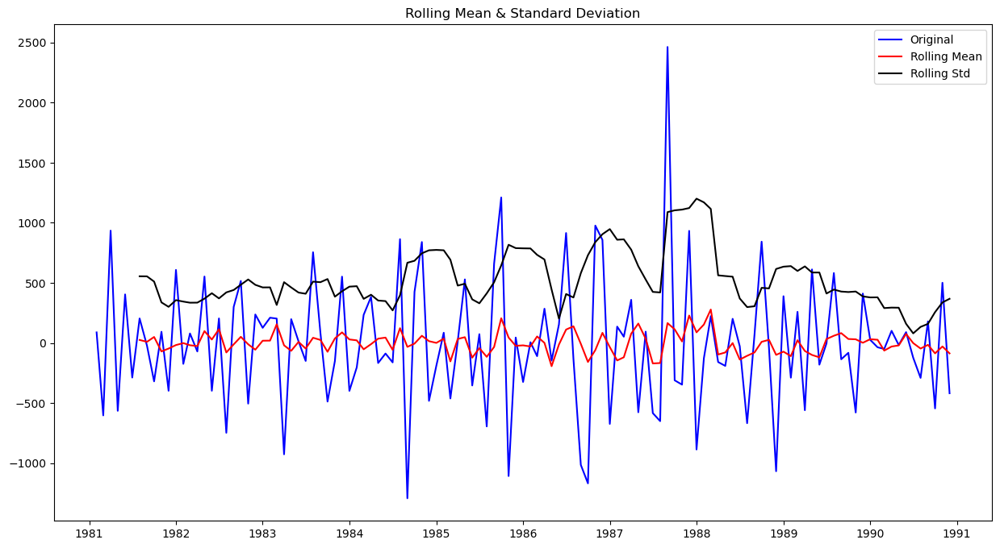

Results of Dickey-Fuller Test:
Test Statistic                  -3.342905
p-value                          0.013066
#Lags Used                      10.000000
Number of Observations Used    108.000000
Critical Value (1%)             -3.492401
Critical Value (5%)             -2.888697
Critical Value (10%)            -2.581255
dtype: float64 



In [129]:
test_stationarity((train_sparkling['Sparkling'].diff(12).dropna()).diff().dropna())

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


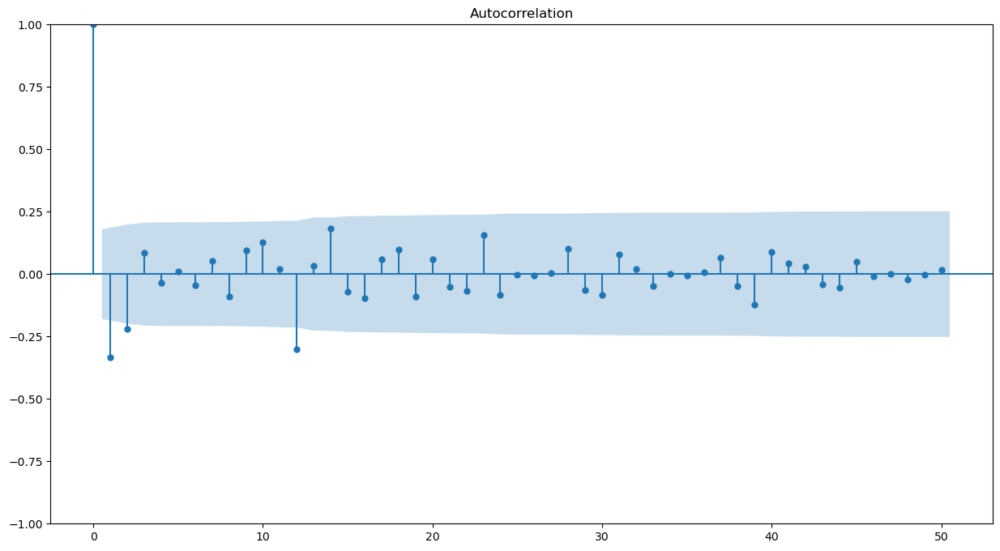

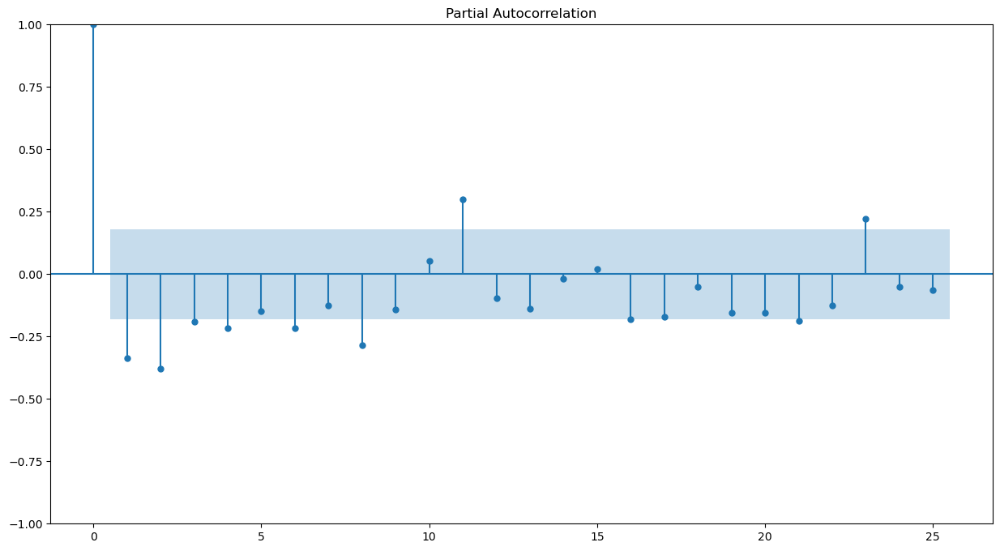

In [130]:
plot_acf((train_sparkling['Sparkling'].diff(12).dropna()).diff().dropna(),lags=50)
plot_pacf((train_sparkling['Sparkling'].diff(12).dropna()).diff().dropna(),lags=25);

In [131]:
import statsmodels.api as sm

manual_SARIMA_6 = sm.tsa.statespace.SARIMAX(train_sparkling['Sparkling'].values,
                                order=(0, 1, 0),
                                seasonal_order=(2, 1, 4, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_manual_SARIMA_6 = manual_SARIMA_6.fit(maxiter=1000)
print(results_manual_SARIMA_6.summary())

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


                                           SARIMAX Results                                           
Dep. Variable:                                             y   No. Observations:                  132
Model:             SARIMAX(0, 1, 0)x(2, 1, [1, 2, 3, 4], 12)   Log Likelihood                -538.663
Date:                                       Sun, 02 Apr 2023   AIC                           1091.326
Time:                                               22:56:39   BIC                           1107.066
Sample:                                                    0   HQIC                          1097.578
                                                       - 132                                         
Covariance Type:                                         opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L12      -0.5734     

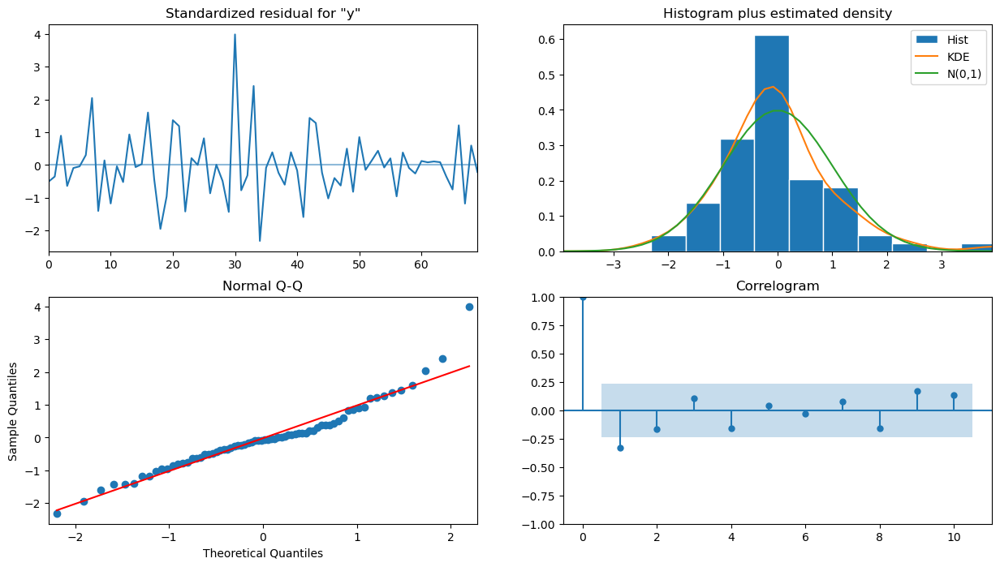

In [132]:
results_manual_SARIMA_6.plot_diagnostics()
plt.show()

In [133]:
predicted_manual_SARIMA_6 = results_manual_SARIMA_6.get_forecast(steps=len(test_sparkling))

In [134]:
predicted_manual_SARIMA_6.summary_frame(alpha=0.05).head()

y,mean,mean_se,mean_ci_lower,mean_ci_upper
0,1258.370235,501.585863,275.280009,2241.460461
1,889.983907,709.180677,-499.984679,2279.952494
2,1352.523546,868.496453,-349.698222,3054.745314
3,1241.541220,1002.813514,-723.937151,3207.019590
4,1232.862402,1121.152889,-964.556881,3430.281685


In [135]:
rmse = mean_squared_error(test_sparkling['Sparkling'],predicted_manual_SARIMA_6.predicted_mean,squared=False)
print(rmse)

937.7471939042355


In [136]:
resultsDf_8_1 = pd.DataFrame({'Test RMSE Sparkling': [rmse]}
                           ,index=['SARIMA(0,1,0)(2,1,4,12) Manual plot'])

resultsDf_sparkling = pd.concat([resultsDf_sparkling, resultsDf_8_1])
resultsDf_sparkling

,Test RMSE Sparkling
Linear Regression,1389.135175
Naive Model,3864.279352
Simple Average Model,1275.081804
2pointTrailingMovingAverage,813.400684
4pointTrailingMovingAverage,1156.589694
6pointTrailingMovingAverage,1283.927428
9pointTrailingMovingAverage,1346.278315
"Alpha=0.049,SimpleExponentialSmoothing",1316.135411
"Alpha=0.02,SimpleExponentialSmoothing",1279.495201
"Alpha=0.66,Beta=0.0001:DoubleExponentialSmoothing",5291.879833


### A table with all the models built along with their corresponding parameters and the respective RMSE values on the test data.

In [139]:
resultsDf_sparkling

,Test RMSE Sparkling
Linear Regression,1389.135175
Naive Model,3864.279352
Simple Average Model,1275.081804
2pointTrailingMovingAverage,813.400684
4pointTrailingMovingAverage,1156.589694
6pointTrailingMovingAverage,1283.927428
9pointTrailingMovingAverage,1346.278315
"Alpha=0.049,SimpleExponentialSmoothing",1316.135411
"Alpha=0.02,SimpleExponentialSmoothing",1279.495201
"Alpha=0.66,Beta=0.0001:DoubleExponentialSmoothing",5291.879833


### Building the most optimum model on the complete data and predicting 12 months into the future with appropriate confidence intervals/bands.

Best time series model for Rose dataset is Triple Exponential Smoothing with parameters Alpha = 0.4, Beta = 0.1 and Gamma = 0.3

Let us build a model on the complete dataset using this model.

In [140]:
fullmodel1 = ExponentialSmoothing(df_sparkling,
                                  trend='multiplicative',
                                  seasonal='multiplicative').fit(smoothing_level=0.4,
                                                                 smoothing_trend=0.1,
                                                                 smoothing_seasonal=0.3)

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:83: RuntimeWarning: overflow encountered in matmul
  return err.T @ err


In [141]:
RMSE_fullmodel1 = metrics.mean_squared_error(df_sparkling['Sparkling'],fullmodel1.fittedvalues,squared=False)

print('RMSE:',RMSE_fullmodel1)

RMSE: 390.53228558944534


In [142]:
# Getting the predictions for 12 months into the future
prediction_1 = fullmodel1.forecast(steps=12)

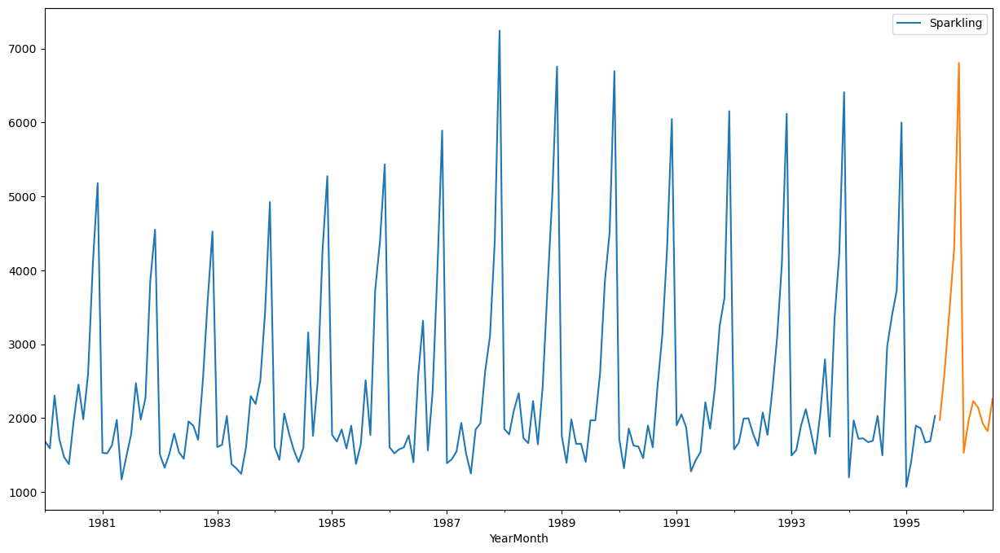

In [143]:
df_sparkling.plot()
prediction_1.plot();

In [144]:
#In the below code, we have calculated the upper and lower confidence bands at 95% confidence level
#Here we are taking the multiplier to be 1.96 as we want to plot with respect to a 95% confidence intervals.
pred_1_df = pd.DataFrame({'lower_CI':prediction_1 - 1.96*np.std(fullmodel1.resid,ddof=1),
                          'prediction':prediction_1,
                          'upper_ci': prediction_1 + 1.96*np.std(fullmodel1.resid,ddof=1)})
pred_1_df

,lower_CI,prediction,upper_ci
1995-08-01,1210.115229,1975.966606,2741.817982
1995-09-01,1862.004338,2627.855715,3393.707091
1995-10-01,2672.632877,3438.484253,4204.335629
1995-11-01,3527.982600,4293.833976,5059.685352
1995-12-01,6041.708407,6807.559783,7573.411160
1996-01-01,764.556329,1530.407705,2296.259081
1996-02-01,1196.947481,1962.798857,2728.650233
1996-03-01,1464.650598,2230.501974,2996.353351
1996-04-01,1375.539901,2141.391277,2907.242653
1996-05-01,1156.406704,1922.258080,2688.109457


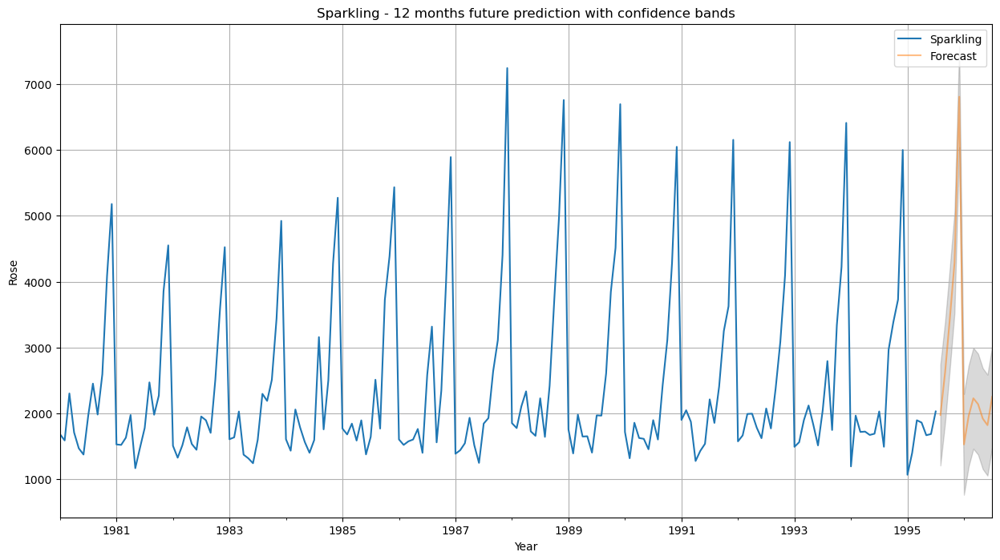

In [145]:
# plot the forecast along with the confidence band

axis = df_sparkling.plot(label='Actual', figsize=(15,8))
pred_1_df['prediction'].plot(ax=axis, label='Forecast', alpha=0.5)
axis.fill_between(pred_1_df.index, pred_1_df['lower_CI'], pred_1_df['upper_ci'], color='k', alpha=.15)
axis.set_xlabel('Year')
axis.set_ylabel('Sparkling')
plt.legend(loc='best')
plt.grid()
plt.title('Sparkling - 12 months future prediction with confidence bands')
plt.show()

### Comment on the model the measures suggested for the company's future sales.

Recommendations to the Sparkling wine manufacturers:

1. For predicting future sales, use a time series model like triple exponential smoothing with Alpha = 0.4, Beta = 0.1, Gamma = 0.3. This will help you to make better inventory and production decisions.


2. Prepare for high demand during the holiday season by working on your inventory in the first two quarters of the year.


3. Organize wine tasting events to promote your sparkling wine as a brunch wine and not just for special occasions.


4. Offer new discounts and promotions on different occasions throughout the year to keep sales steady.


5. Utilize social media platforms to reach a wider audience and increase brand awareness.


6. Increase your marketing efforts in the first two quarters to attract consumers and increase sales during the peak season.


7. Gather and analyze data to understand which areas and sections of people are consuming more sparkling wine, so you can tailor your marketing efforts more effectively.


8. Experiment with new marketing tactics and offers to attract customers in areas with low sales and expand your customer base.

## Rose wine Sales

### Reading the data as an appropriate Time Series data and ploting the data.

In [146]:
df_rose = pd.read_csv('Rose.csv', parse_dates = True, index_col = 'YearMonth')

In [298]:
df_rose.head()

,Rose
YearMonth,
1980-01-01,112.0
1980-02-01,118.0
1980-03-01,129.0
1980-04-01,99.0
1980-05-01,116.0


In [147]:
df_rose.dtypes

Rose    float64
dtype: object

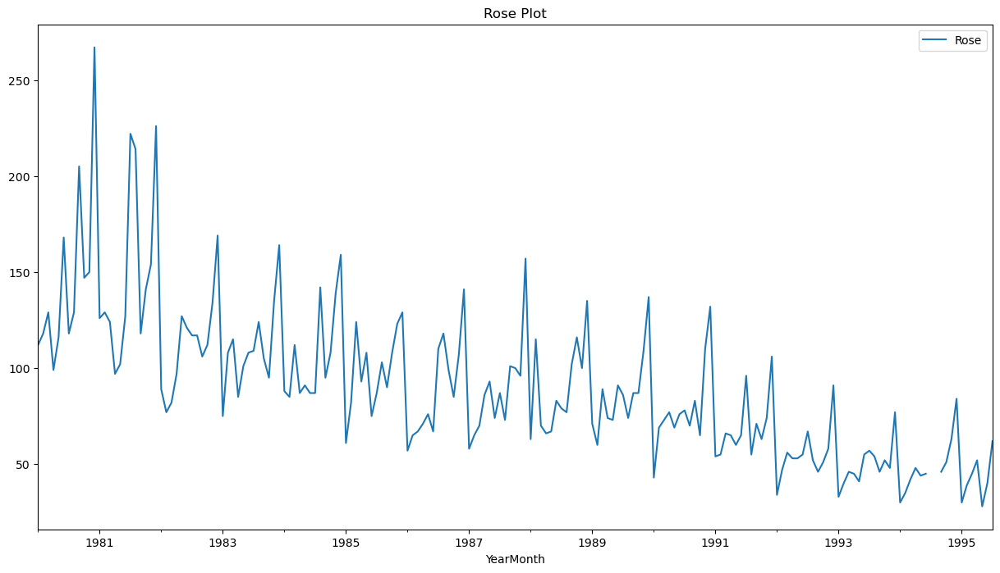

In [148]:
from pylab import rcParams
rcParams['figure.figsize'] = 15,8
df_rose.plot()
plt.title('Rose Plot')
plt.show()

### Performing appropriate Exploratory Data Analysis to understand the data and also performing decomposition.

In [149]:
df_rose.head()

,Rose
YearMonth,
1980-01-01,112.0
1980-02-01,118.0
1980-03-01,129.0
1980-04-01,99.0
1980-05-01,116.0


In [150]:
df_rose.shape

(187, 1)

In [151]:
df_rose.isnull().sum()

Rose    2
dtype: int64

In [152]:
df_rose['1994']

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\373968186.py:1: FutureWarning: Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.
  df_rose['1994']


,Rose
YearMonth,
1994-01-01,30.0
1994-02-01,35.0
1994-03-01,42.0
1994-04-01,48.0
1994-05-01,44.0
1994-06-01,45.0
1994-07-01,NaN
1994-08-01,NaN
1994-09-01,46.0


In [153]:
df_rose['1994'] = df_rose.interpolate()['1994']

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\3930166547.py:1: FutureWarning: Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.
  df_rose['1994'] = df_rose.interpolate()['1994']


In [154]:
df_rose.isnull().sum()

Rose    0
dtype: int64

In [155]:
df_rose.shape

(187, 1)

In [156]:
df_rose['1994']

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\373968186.py:1: FutureWarning: Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.
  df_rose['1994']


,Rose
YearMonth,
1994-01-01,30.000000
1994-02-01,35.000000
1994-03-01,42.000000
1994-04-01,48.000000
1994-05-01,44.000000
1994-06-01,45.000000
1994-07-01,45.333333
1994-08-01,45.666667
1994-09-01,46.000000


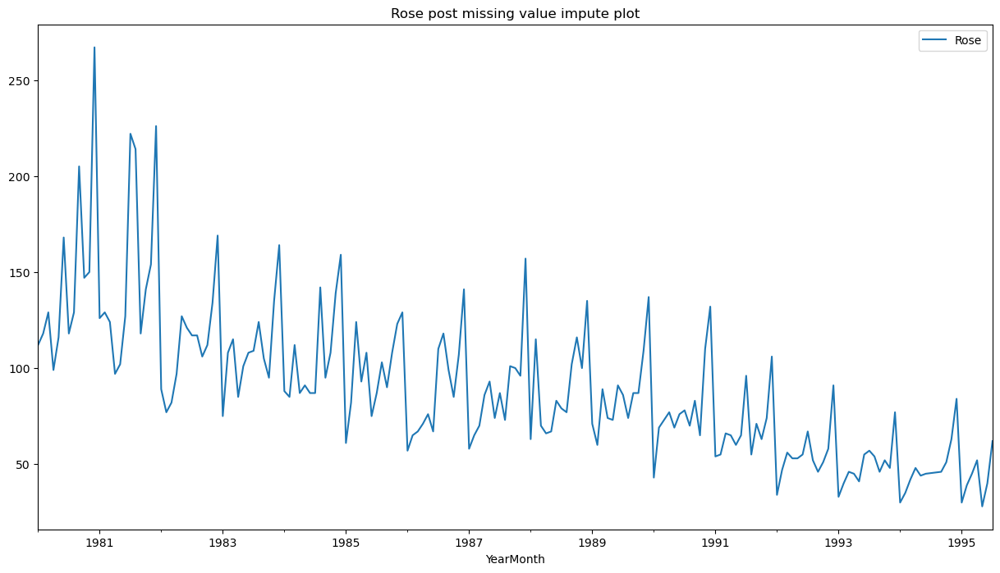

In [157]:
from pylab import rcParams
rcParams['figure.figsize'] = 15,8
df_rose.plot()
plt.title('Rose post missing value impute plot')
plt.show()

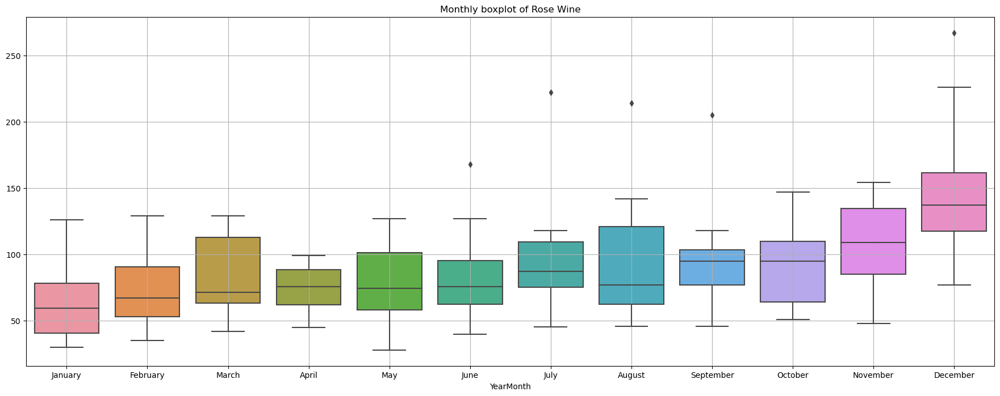

In [158]:
_, ax = plt.subplots(figsize=(22,8))
sns.boxplot(x = df_rose.index.month_name(),y = df_rose.values[:,0],ax=ax)
plt.grid()
plt.title('Monthly boxplot of Rose Wine')
plt.show()

In [159]:
monthly_sales_across_years = pd.pivot_table(df_rose, values = 'Rose', columns = df_rose.index.month_name(), 
                                            index = df_rose.index.year)
monthly_sales_across_years

YearMonth,April,August,December,February,January,July,June,March,May,November,October,September
YearMonth,,,,,,,,,,,,
1980,99.0,129.000000,267.0,118.0,112.0,118.000000,168.0,129.0,116.0,150.0,147.0,205.0
1981,97.0,214.000000,226.0,129.0,126.0,222.000000,127.0,124.0,102.0,154.0,141.0,118.0
1982,97.0,117.000000,169.0,77.0,89.0,117.000000,121.0,82.0,127.0,134.0,112.0,106.0
1983,85.0,124.000000,164.0,108.0,75.0,109.000000,108.0,115.0,101.0,135.0,95.0,105.0
1984,87.0,142.000000,159.0,85.0,88.0,87.000000,87.0,112.0,91.0,139.0,108.0,95.0
1985,93.0,103.000000,129.0,82.0,61.0,87.000000,75.0,124.0,108.0,123.0,108.0,90.0
1986,71.0,118.000000,141.0,65.0,57.0,110.000000,67.0,67.0,76.0,107.0,85.0,99.0
1987,86.0,73.000000,157.0,65.0,58.0,87.000000,74.0,70.0,93.0,96.0,100.0,101.0
1988,66.0,77.000000,135.0,115.0,63.0,79.000000,83.0,70.0,67.0,100.0,116.0,102.0


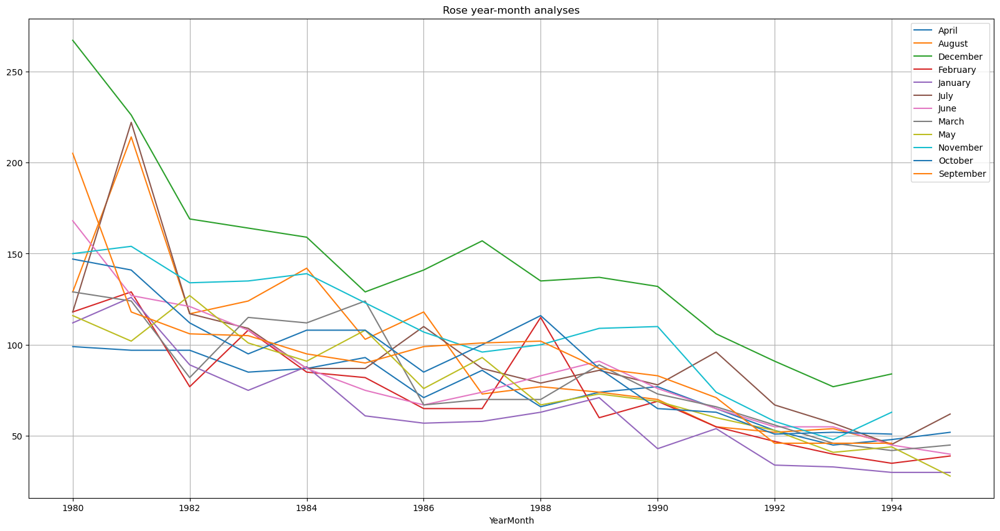

In [160]:
monthly_sales_across_years.plot(figsize=(20,10))
plt.grid()
plt.legend(loc='best')
plt.title('Rose year-month analyses')
plt.show()

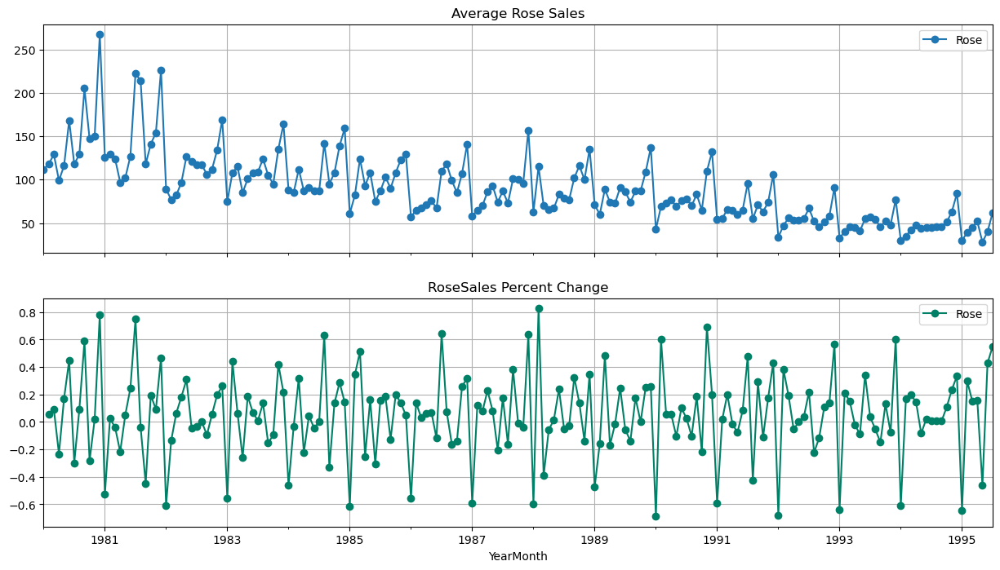

In [161]:
# group by date and get average RetailSales, and precent change
average    = df_rose.groupby(df_rose.index)["Rose"].mean()
pct_change = df_rose.groupby(df_rose.index)["Rose"].sum().pct_change()

fig, (axis1,axis2) = plt.subplots(2,1,sharex=True,figsize=(15,8))

# plot average RetailSales over time(year-month)
ax1 = average.plot(legend=True,ax=axis1,marker='o',title="Average Rose Sales",grid=True)
ax1.set_xticks(range(len(average)))
ax1.set_xticklabels(average.index.tolist())
# plot precent change for RetailSales over time(year-month)
ax2 = pct_change.plot(legend=True,ax=axis2,marker='o',colormap="summer",title="RoseSales Percent Change",grid=True)

In [162]:
df_rose.describe()

,Rose
count,187.000000
mean,89.914439
std,39.238325
min,28.000000
25%,62.500000
50%,85.000000
75%,111.000000
max,267.000000


In [163]:
from statsmodels.tsa.seasonal import seasonal_decompose

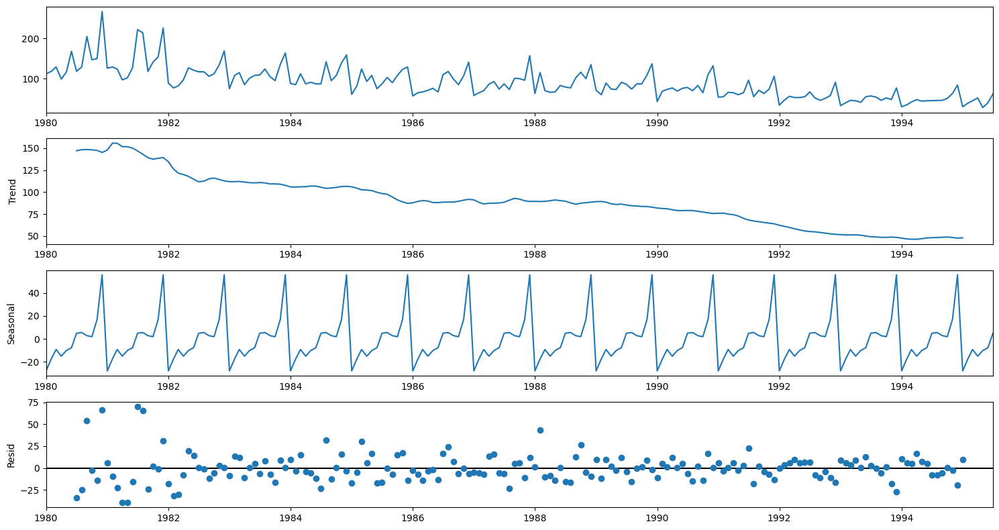

In [164]:
decomposition = seasonal_decompose(df_rose,model='additive')
decomposition.plot();

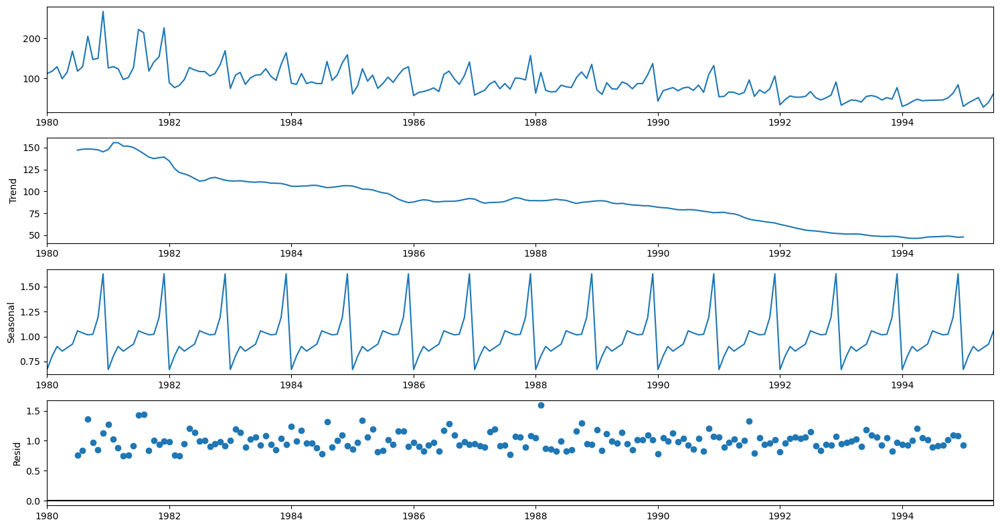

In [165]:
decomposition = seasonal_decompose(df_rose,model='multiplicative')
decomposition.plot();

In [166]:
trend = decomposition.trend
seasonality = decomposition.seasonal
residual = decomposition.resid

print('Trend','\n',trend.head(12),'\n')
print('Seasonality','\n',seasonality.head(12),'\n')
print('Residual','\n',residual.head(12),'\n')

Trend 
 YearMonth
1980-01-01           NaN
1980-02-01           NaN
1980-03-01           NaN
1980-04-01           NaN
1980-05-01           NaN
1980-06-01           NaN
1980-07-01    147.083333
1980-08-01    148.125000
1980-09-01    148.375000
1980-10-01    148.083333
1980-11-01    147.416667
1980-12-01    145.125000
Name: trend, dtype: float64 

Seasonality 
 YearMonth
1980-01-01    0.670111
1980-02-01    0.806163
1980-03-01    0.901164
1980-04-01    0.854024
1980-05-01    0.889415
1980-06-01    0.923985
1980-07-01    1.058038
1980-08-01    1.035881
1980-09-01    1.017648
1980-10-01    1.022573
1980-11-01    1.192349
1980-12-01    1.628646
Name: seasonal, dtype: float64 

Residual 
 YearMonth
1980-01-01         NaN
1980-02-01         NaN
1980-03-01         NaN
1980-04-01         NaN
1980-05-01         NaN
1980-06-01         NaN
1980-07-01    0.758258
1980-08-01    0.840720
1980-09-01    1.357674
1980-10-01    0.970771
1980-11-01    0.853378
1980-12-01    1.129646
Name: resid, dtype: fl

### Splitting the data into training and test. The test data starts in 1991.

In [167]:
train_rose=df_rose[df_rose.index.year < 1991]
test_rose=df_rose[df_rose.index.year >= 1991]

In [168]:
print(train_rose.shape)
print(test_rose.shape)

(132, 1)
(55, 1)


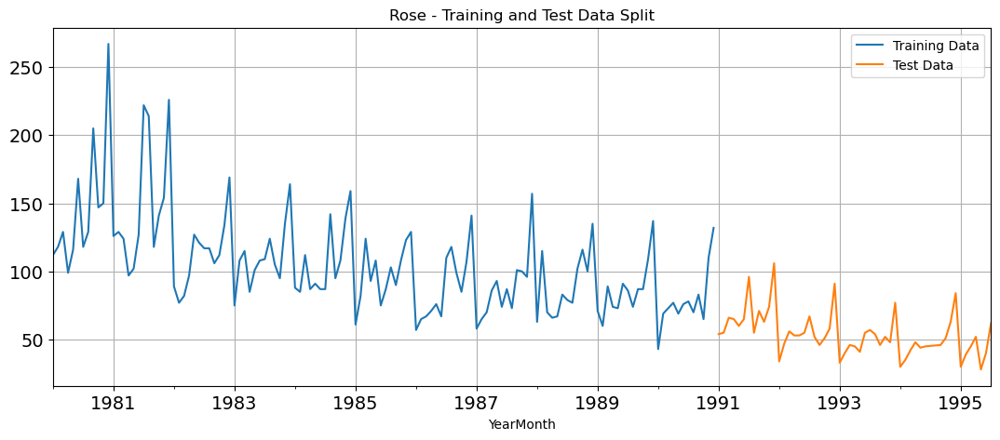

In [169]:
train_rose['Rose'].plot(figsize=(13,5), fontsize=14)
test_rose['Rose'].plot(figsize=(13,5), fontsize=14)
plt.grid()
plt.legend(['Training Data','Test Data'])
plt.title('Rose - Training and Test Data Split')
plt.show()

#### Q4) Build all the exponential smoothing models on the training data and evaluate the model using RMSE on the test data. Other additional models such as regression, naïve forecast models, simple average models, moving average models should also be built on the training data and check the performance on the test data using RMSE.

### Model 1 - Linear Regression

In [170]:
train_time_rose = [i+1 for i in range(len(train_rose))]
test_time_rose = [i+133 for i in range(len(test_rose))]
print('Training Time instance for Rose','\n\n',train_time_rose)
print('')
print('Test Time instance for Rose','\n\n',test_time_rose)

Training Time instance for Rose 

 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132]

Test Time instance for Rose 

 [133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187]


In [171]:
LinearRegression_train_rose = train_rose.copy()
LinearRegression_test_rose = test_rose.copy()

In [172]:
LinearRegression_train_rose['time'] = train_time_rose
LinearRegression_test_rose['time'] = test_time_rose

print('First few rows of Training Data for Rose','\n',LinearRegression_train_rose.head(),'\n')
print('Last few rows of Training Data for Rose','\n',LinearRegression_train_rose.tail(),'\n')
print('First few rows of Test Data for Rose','\n',LinearRegression_test_rose.head(),'\n')
print('Last few rows of Test Data for Rose','\n',LinearRegression_test_rose.tail(),'\n')

First few rows of Training Data for Rose 
              Rose  time
YearMonth              
1980-01-01  112.0     1
1980-02-01  118.0     2
1980-03-01  129.0     3
1980-04-01   99.0     4
1980-05-01  116.0     5 

Last few rows of Training Data for Rose 
              Rose  time
YearMonth              
1990-08-01   70.0   128
1990-09-01   83.0   129
1990-10-01   65.0   130
1990-11-01  110.0   131
1990-12-01  132.0   132 

First few rows of Test Data for Rose 
             Rose  time
YearMonth             
1991-01-01  54.0   133
1991-02-01  55.0   134
1991-03-01  66.0   135
1991-04-01  65.0   136
1991-05-01  60.0   137 

Last few rows of Test Data for Rose 
             Rose  time
YearMonth             
1995-03-01  45.0   183
1995-04-01  52.0   184
1995-05-01  28.0   185
1995-06-01  40.0   186
1995-07-01  62.0   187 



In [173]:
from sklearn.linear_model import LinearRegression

In [174]:
lr_rose = LinearRegression()

In [175]:
lr_rose.fit(LinearRegression_train_rose[['time']],LinearRegression_train_rose['Rose'].values)

LinearRegression()

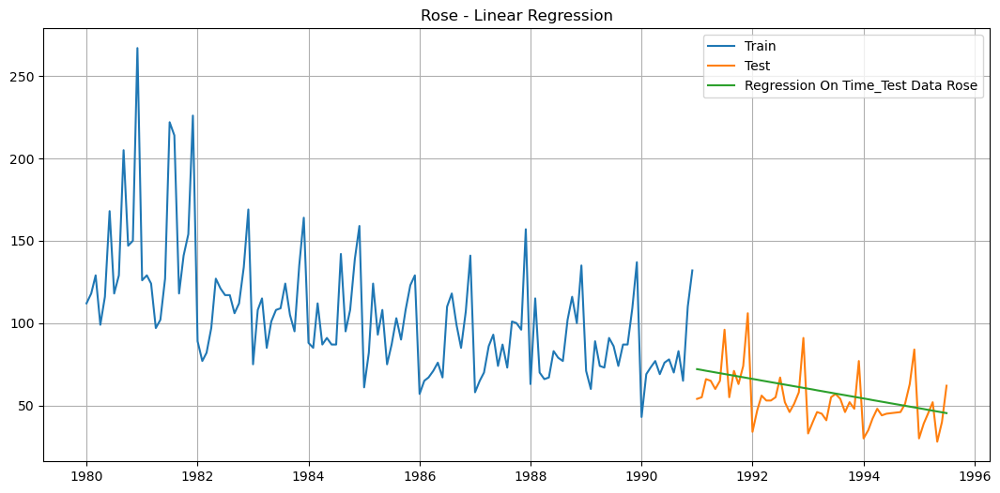

In [176]:
test_predictions_lr_rose         = lr_rose.predict(LinearRegression_test_rose[['time']])
LinearRegression_test_rose['RegOnTime'] = test_predictions_lr_rose

plt.figure(figsize=(13,6))
plt.plot(train_rose['Rose'], label='Train')
plt.plot(test_rose['Rose'], label='Test')
plt.plot(LinearRegression_test_rose['RegOnTime'], label='Regression On Time_Test Data Rose')
plt.legend(loc='best')
plt.title('Rose - Linear Regression')
plt.grid();

In [177]:
from sklearn import metrics

In [178]:
## Test Data - RMSE

rmse_lr_test_rose = metrics.mean_squared_error(test_rose['Rose'],test_predictions_lr_rose,squared=False)
print("For RegressionOnTime forecast on the Test Data for Rose,  RMSE is %3.3f" %(rmse_lr_test_rose))

For RegressionOnTime forecast on the Test Data for Rose,  RMSE is 15.269


In [179]:
resultsDf_rose = pd.DataFrame({'Test RMSE Rose': [rmse_lr_test_rose]},index=['Linear Regression'])
resultsDf_rose

,Test RMSE Rose
Linear Regression,15.268955


### Model 2 - Naive Approach

In [180]:
NaiveModel_train_rose = train_rose.copy()
NaiveModel_test_rose = test_rose.copy()

In [181]:
NaiveModel_test_rose['naive'] = np.asarray(train_rose['Rose'])[len(np.asarray(train_rose['Rose']))-1]
NaiveModel_test_rose['naive'].head()

YearMonth
1991-01-01    132.0
1991-02-01    132.0
1991-03-01    132.0
1991-04-01    132.0
1991-05-01    132.0
Name: naive, dtype: float64

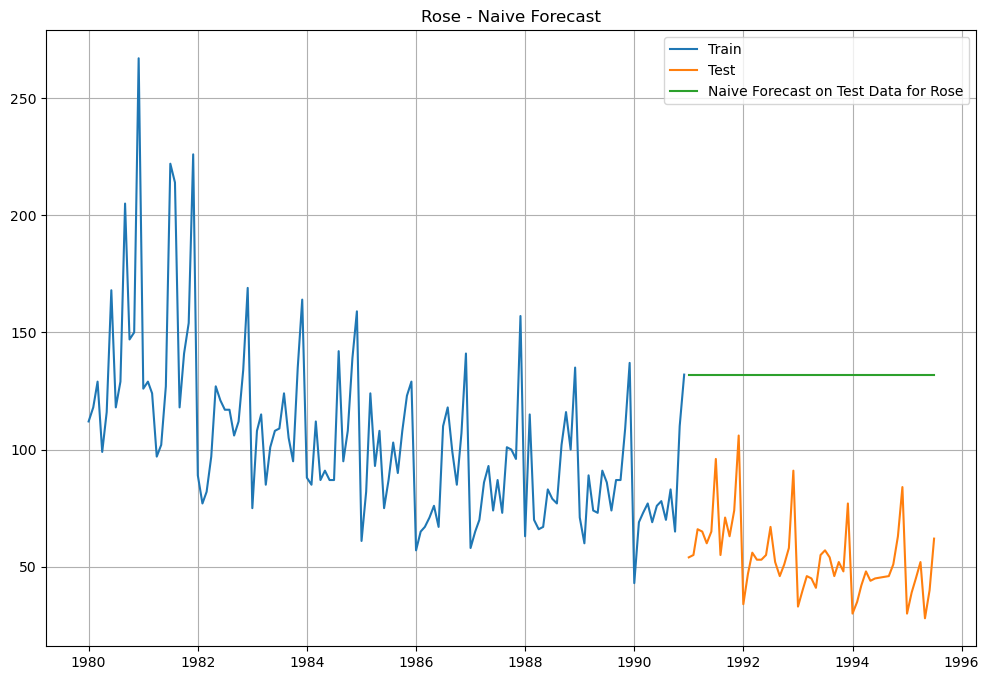

In [182]:
plt.figure(figsize=(12,8))
plt.plot(NaiveModel_train_rose['Rose'], label='Train')
plt.plot(test_rose['Rose'], label='Test')
plt.plot(NaiveModel_test_rose['naive'], label='Naive Forecast on Test Data for Rose')
plt.legend(loc='best')
plt.title("Rose - Naive Forecast")
plt.grid();

In [183]:
## Test Data - RMSE

rmse_naive_test_rose = metrics.mean_squared_error(test_rose['Rose'],NaiveModel_test_rose['naive'],squared=False)
print("For RegressionOnTime forecast on the Test Data for Rose,  RMSE is %3.3f" %(rmse_naive_test_rose))

For RegressionOnTime forecast on the Test Data for Rose,  RMSE is 79.719


In [184]:
resultsDf_2 = pd.DataFrame({'Test RMSE Rose': [rmse_naive_test_rose]},index=['Naive Model'])

resultsDf_rose = pd.concat([resultsDf_rose, resultsDf_2])
resultsDf_rose

,Test RMSE Rose
Linear Regression,15.268955
Naive Model,79.718773


### Model 3 - Simple Average

In [185]:
SimpleAverage_train_rose = train_rose.copy()
SimpleAverage_test_rose = test_rose.copy()

In [186]:
SimpleAverage_test_rose['mean_forecast'] = train_rose['Rose'].mean()
SimpleAverage_test_rose.head()

,Rose,mean_forecast
YearMonth,,
1991-01-01,54.0,104.939394
1991-02-01,55.0,104.939394
1991-03-01,66.0,104.939394
1991-04-01,65.0,104.939394
1991-05-01,60.0,104.939394


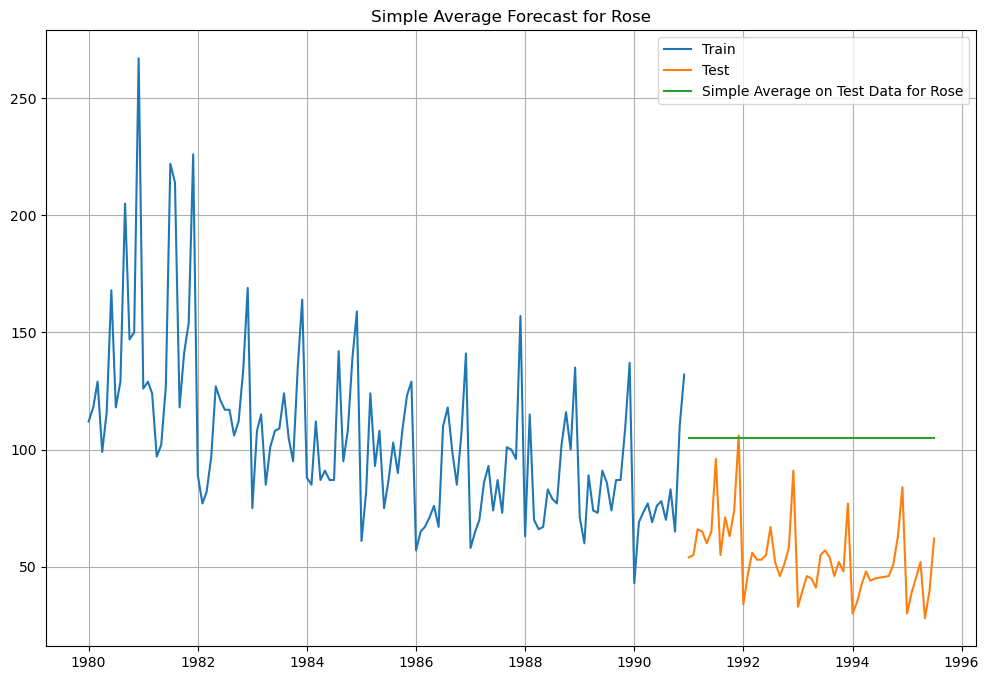

In [187]:
plt.figure(figsize=(12,8))
plt.plot(SimpleAverage_train_rose['Rose'], label='Train')
plt.plot(SimpleAverage_test_rose['Rose'], label='Test')
plt.plot(SimpleAverage_test_rose['mean_forecast'], label='Simple Average on Test Data for Rose')
plt.legend(loc='best')
plt.title("Simple Average Forecast for Rose")
plt.grid();

In [188]:
## Test Data - RMSE 

rmse_sa_test_rose = metrics.mean_squared_error(test_rose['Rose'],SimpleAverage_test_rose['mean_forecast'],squared=False)
print("For Simple Average forecast on the Test Data for Rose,  RMSE is %3.3f" %(rmse_sa_test_rose))

For Simple Average forecast on the Test Data for Rose,  RMSE is 53.461


In [189]:
resultsDf_4 = pd.DataFrame({'Test RMSE Rose': [rmse_sa_test_rose]},index=['Simple Average Model'])

resultsDf_rose = pd.concat([resultsDf_rose, resultsDf_4])
resultsDf_rose

,Test RMSE Rose
Linear Regression,15.268955
Naive Model,79.718773
Simple Average Model,53.460570


### Model 4 - Moving Avergae 

In [190]:
MovingAverage_rose = df_rose.copy()
MovingAverage_rose.head()

,Rose
YearMonth,
1980-01-01,112.0
1980-02-01,118.0
1980-03-01,129.0
1980-04-01,99.0
1980-05-01,116.0


In [191]:
MovingAverage_rose['Trailing_2'] = MovingAverage_rose['Rose'].rolling(2).mean()
MovingAverage_rose['Trailing_4'] = MovingAverage_rose['Rose'].rolling(4).mean()
MovingAverage_rose['Trailing_6'] = MovingAverage_rose['Rose'].rolling(6).mean()
MovingAverage_rose['Trailing_9'] = MovingAverage_rose['Rose'].rolling(9).mean()

MovingAverage_rose.head(10)

,Rose,Trailing_2,Trailing_4,Trailing_6,Trailing_9
YearMonth,,,,,
1980-01-01,112.0,NaN,NaN,NaN,NaN
1980-02-01,118.0,115.0,NaN,NaN,NaN
1980-03-01,129.0,123.5,NaN,NaN,NaN
1980-04-01,99.0,114.0,114.50,NaN,NaN
1980-05-01,116.0,107.5,115.50,NaN,NaN
1980-06-01,168.0,142.0,128.00,123.666667,NaN
1980-07-01,118.0,143.0,125.25,124.666667,NaN
1980-08-01,129.0,123.5,132.75,126.500000,NaN
1980-09-01,205.0,167.0,155.00,139.166667,132.666667


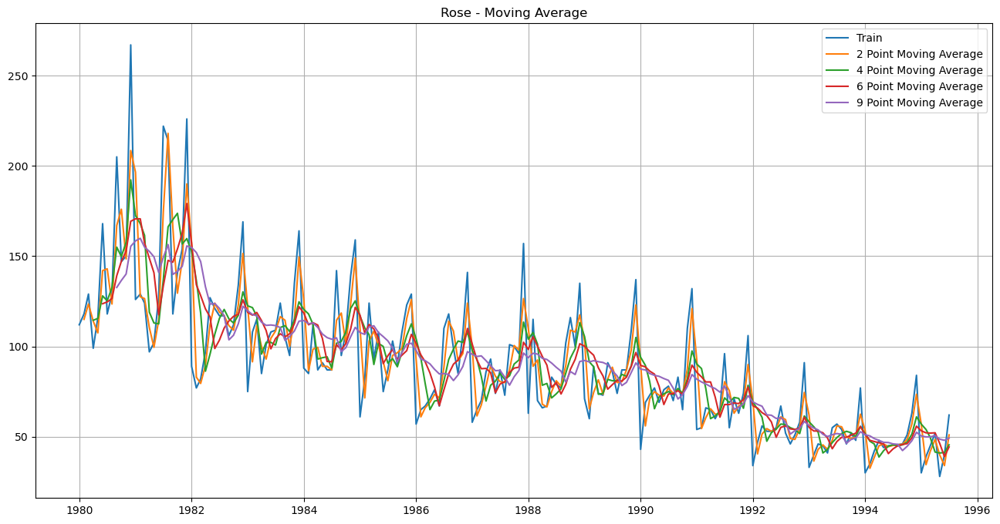

In [192]:
## Plotting on the whole data

plt.figure(figsize=(16,8))
plt.plot(MovingAverage_rose['Rose'], label='Train')
plt.plot(MovingAverage_rose['Trailing_2'], label='2 Point Moving Average')
plt.plot(MovingAverage_rose['Trailing_4'], label='4 Point Moving Average')
plt.plot(MovingAverage_rose['Trailing_6'],label = '6 Point Moving Average')
plt.plot(MovingAverage_rose['Trailing_9'],label = '9 Point Moving Average')

plt.legend(loc = 'best')
plt.title('Rose - Moving Average')
plt.grid();

In [193]:
#Creating train and test set 
trailing_MovingAverage_train_rose=MovingAverage_rose[MovingAverage_rose.index.year < 1991] 
trailing_MovingAverage_test_rose=MovingAverage_rose[MovingAverage_rose.index.year >= 1991]

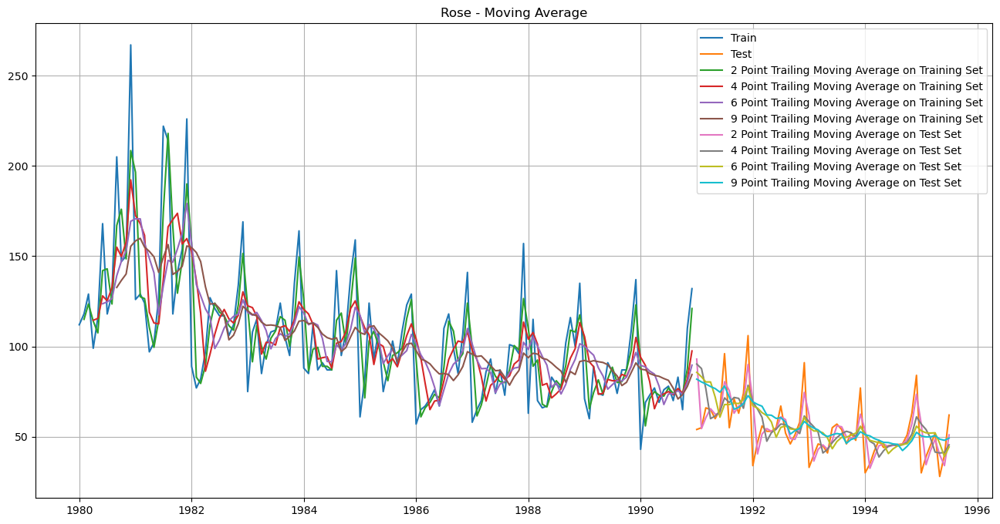

In [194]:
## Plotting on both the Training and Test data

plt.figure(figsize=(16,8))
plt.plot(trailing_MovingAverage_train_rose['Rose'], label='Train')
plt.plot(trailing_MovingAverage_test_rose['Rose'], label='Test')

plt.plot(trailing_MovingAverage_train_rose['Trailing_2'], label='2 Point Trailing Moving Average on Training Set')
plt.plot(trailing_MovingAverage_train_rose['Trailing_4'], label='4 Point Trailing Moving Average on Training Set')
plt.plot(trailing_MovingAverage_train_rose['Trailing_6'],label = '6 Point Trailing Moving Average on Training Set')
plt.plot(trailing_MovingAverage_train_rose['Trailing_9'],label = '9 Point Trailing Moving Average on Training Set')

plt.plot(trailing_MovingAverage_test_rose['Trailing_2'], label='2 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test_rose['Trailing_4'], label='4 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test_rose['Trailing_6'],label = '6 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test_rose['Trailing_9'],label = '9 Point Trailing Moving Average on Test Set')
plt.title('Rose - Moving Average')
plt.legend(loc = 'best')
plt.grid();

In [195]:
## Test Data - RMSE --> 2 point Trailing MA

rmse_ma_test_2_rose = metrics.mean_squared_error(test_rose['Rose'],trailing_MovingAverage_test_rose['Trailing_2'],squared=False)
print("For 2 point Moving Average Model forecast on the Testing Data for Rose,  RMSE is %3.3f" %(rmse_ma_test_2_rose))

## Test Data - RMSE  --> 4 point Trailing MA

rmse_ma_test_4_rose = metrics.mean_squared_error(test_rose['Rose'],trailing_MovingAverage_test_rose['Trailing_4'],squared=False)
print("For 4 point Moving Average Model forecast on the Testing Data for Rose,  RMSE is %3.3f" %(rmse_ma_test_4_rose))

## Test Data - RMSE --> 6 point Trailing MA

rmse_ma_test_6_rose = metrics.mean_squared_error(test_rose['Rose'],trailing_MovingAverage_test_rose['Trailing_6'],squared=False)
print("For 6 point Moving Average Model forecast on the Testing Data for Rose,  RMSE is %3.3f" %(rmse_ma_test_6_rose))

## Test Data - RMSE  --> 9 point Trailing MA

rmse_ma_test_9_rose = metrics.mean_squared_error(test_rose['Rose'],trailing_MovingAverage_test_rose['Trailing_9'],squared=False)
print("For 9 point Moving Average Model forecast on the Testing Data for Rose,  RMSE is %3.3f " %(rmse_ma_test_9_rose))

For 2 point Moving Average Model forecast on the Testing Data for Rose,  RMSE is 11.529
For 4 point Moving Average Model forecast on the Testing Data for Rose,  RMSE is 14.451
For 6 point Moving Average Model forecast on the Testing Data for Rose,  RMSE is 14.566
For 9 point Moving Average Model forecast on the Testing Data for Rose,  RMSE is 14.728 


In [196]:
resultsDf_6 = pd.DataFrame({'Test RMSE Rose': [rmse_ma_test_2_rose,rmse_ma_test_4_rose
                                          ,rmse_ma_test_6_rose,rmse_ma_test_9_rose]}
                           ,index=['2pointTrailingMovingAverage','4pointTrailingMovingAverage'
                                   ,'6pointTrailingMovingAverage','9pointTrailingMovingAverage'])

resultsDf_rose = pd.concat([resultsDf_rose, resultsDf_6])
resultsDf_rose

,Test RMSE Rose
Linear Regression,15.268955
Naive Model,79.718773
Simple Average Model,53.460570
2pointTrailingMovingAverage,11.529278
4pointTrailingMovingAverage,14.451403
6pointTrailingMovingAverage,14.566327
9pointTrailingMovingAverage,14.727630


### Model 5: Simple Exponential Smoothing

In [197]:
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt

In [198]:
SES_train_rose = train_rose.copy()
SES_test_rose = test_rose.copy()

In [199]:
model_SES_rose = SimpleExpSmoothing(SES_train_rose['Rose'])

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [200]:
model_SES_autofit_rose = model_SES_rose.fit(optimized=True)

In [201]:
model_SES_autofit_rose.params

{'smoothing_level': 0.09874989825614361,
 'smoothing_trend': nan,
 'smoothing_seasonal': nan,
 'damping_trend': nan,
 'initial_level': 134.38702255613862,
 'initial_trend': nan,
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [202]:
SES_test_rose['predict'] = model_SES_autofit_rose.forecast(steps=len(test_rose))
SES_test_rose.head()

,Rose,predict
YearMonth,,
1991-01-01,54.0,87.104999
1991-02-01,55.0,87.104999
1991-03-01,66.0,87.104999
1991-04-01,65.0,87.104999
1991-05-01,60.0,87.104999


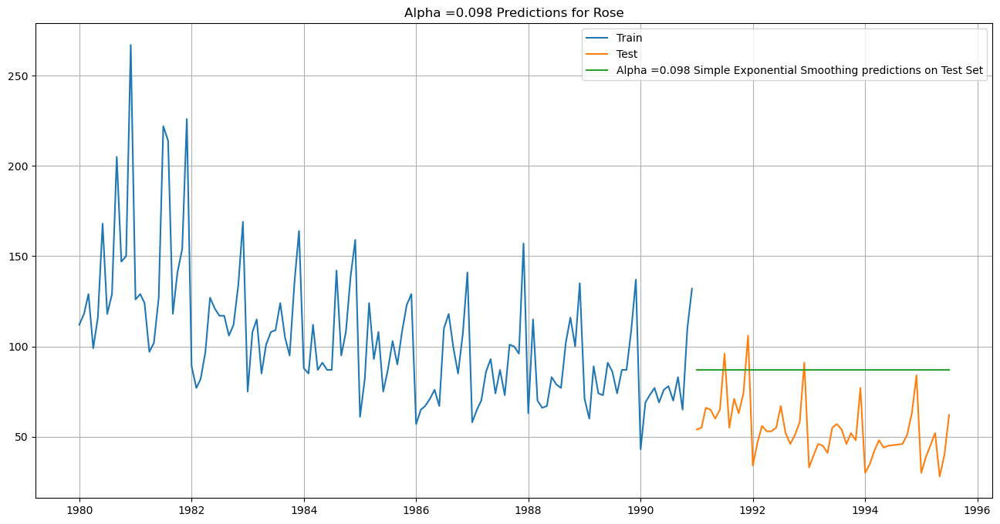

In [203]:
## Plotting on both the Training and Test data

plt.figure(figsize=(16,8))
plt.plot(SES_train_rose['Rose'], label='Train')
plt.plot(SES_test_rose['Rose'], label='Test')

plt.plot(SES_test_rose['predict'], label='Alpha =0.098 Simple Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Alpha =0.098 Predictions for Rose');

In [204]:
## Test Data

rmse_ses_test_rose = metrics.mean_squared_error(SES_test_rose['Rose'],SES_test_rose['predict'],squared=False)
print("For Alpha =0.098 Simple Exponential Smoothing Model forecast on the Test Data for Rose, RMSE is %3.3f" %(rmse_ses_test_rose))


For Alpha =0.098 Simple Exponential Smoothing Model forecast on the Test Data for Rose, RMSE is 36.796


In [205]:
resultsDf_8 = pd.DataFrame({'Test RMSE Rose': [rmse_ses_test_rose]},index=['Alpha=0.098,SimpleExponentialSmoothing'])

resultsDf_rose = pd.concat([resultsDf_rose, resultsDf_8])
resultsDf_rose

,Test RMSE Rose
Linear Regression,15.268955
Naive Model,79.718773
Simple Average Model,53.460570
2pointTrailingMovingAverage,11.529278
4pointTrailingMovingAverage,14.451403
6pointTrailingMovingAverage,14.566327
9pointTrailingMovingAverage,14.727630
"Alpha=0.098,SimpleExponentialSmoothing",36.796242


In [206]:
## First we will define an empty dataframe to store our values from the loop

resultsDf_rose_10 = pd.DataFrame({'Alpha Values':[],'Train RMSE':[],'Test RMSE': []})
resultsDf_rose_10

,Alpha Values,Train RMSE,Test RMSE


In [212]:
for i in np.arange(0.01,0.1,0.01):
    model_SES_alpha_i_rose = model_SES_rose.fit(smoothing_level=i,optimized=False,use_brute=True)
    SES_train_rose['predict',i] = model_SES_alpha_i_rose.fittedvalues
    SES_test_rose['predict',i] = model_SES_alpha_i_rose.forecast(steps=1000)
    
    rmse_model5_train_i_rose = metrics.mean_squared_error(SES_train_rose['Rose'],SES_train_rose['predict',i],squared=False)
    
    rmse_model5_test_i_rose = metrics.mean_squared_error(SES_test_rose['Rose'],SES_test_rose['predict',i],squared=False)
    
    resultsDf_rose_10 = resultsDf_rose_10.append({'Alpha Values':i,'Train RMSE':rmse_model5_train_i_rose 
                                      ,'Test RMSE':rmse_model5_test_i_rose}, ignore_index=True)

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\1386625837.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_rose_10 = resultsDf_rose_10.append({'Alpha Values':i,'Train RMSE':rmse_model5_train_i_rose
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\1386625837.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_rose_10 = resultsDf_rose_10.append({'Alpha Values':i,'Train RMSE':rmse_model5_train_i_rose
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\1386625837.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_rose_10 = resultsDf_rose_10.append({'Alpha Values':i,'Train RMSE':rmse_model5_train_i_rose
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\1386625837.py:10: FutureWarning: The f

In [213]:
resultsDf_rose_10.sort_values(by=['Test RMSE'],ascending=True)

,Alpha Values,Train RMSE,Test RMSE
6,0.07,32.046904,36.435772
7,0.08,31.936243,36.462965
5,0.06,32.209657,36.580469
8,0.09,31.862435,36.604118
4,0.05,32.449102,37.011448
3,0.04,32.806672,37.961660
2,0.03,33.353562,39.901221
1,0.02,34.203362,43.706885
0,0.01,35.456769,50.606561


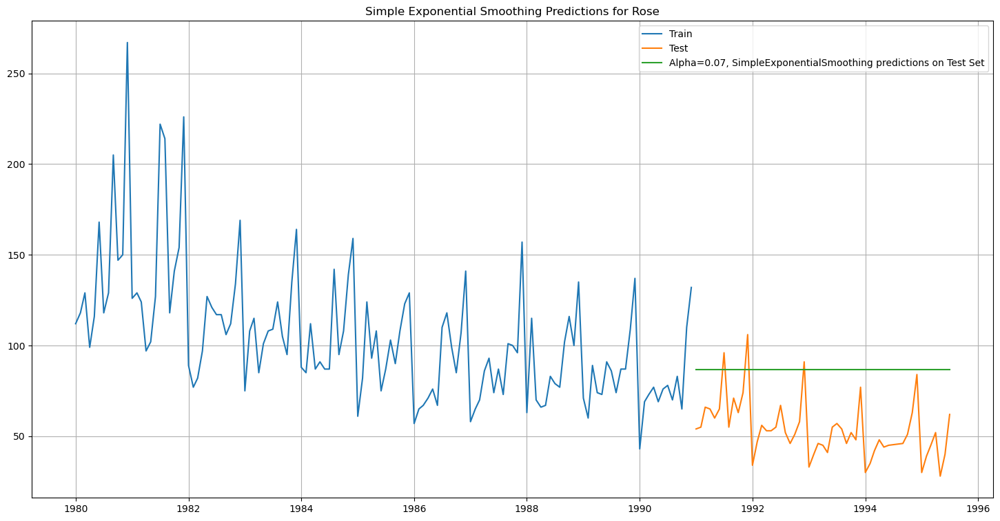

In [214]:
## Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(SES_train_rose['Rose'], label='Train')
plt.plot(SES_test_rose['Rose'], label='Test')

plt.plot(SES_test_rose['predict', 0.08], label='Alpha=0.07, SimpleExponentialSmoothing predictions on Test Set')


plt.legend(loc='best')
plt.grid()
plt.title('Simple Exponential Smoothing Predictions for Rose');

In [215]:
resultsDf_11 = pd.DataFrame({'Test RMSE Rose': [resultsDf_rose_10.sort_values(by=['Test RMSE'],ascending=True).values[0][2]]}
                           ,index=['Alpha=0.07,SimpleExponentialSmoothing'])

resultsDf_rose = pd.concat([resultsDf_rose, resultsDf_11])
resultsDf_rose

,Test RMSE Rose
Linear Regression,15.268955
Naive Model,79.718773
Simple Average Model,53.460570
2pointTrailingMovingAverage,11.529278
4pointTrailingMovingAverage,14.451403
6pointTrailingMovingAverage,14.566327
9pointTrailingMovingAverage,14.727630
"Alpha=0.098,SimpleExponentialSmoothing",36.796242
"Alpha=0.07,SimpleExponentialSmoothing",36.435772


### Model 6: Double Explonential Smoothing (Holt's Model)

In [216]:
DES_train_rose = train_rose.copy()
DES_test_rose = test_rose.copy()

In [217]:
# Initializing the Double Exponential Smoothing Model
model_DES_rose = Holt(DES_train_rose,initialization_method='estimated')
# Fitting the model
model_DES_rose = model_DES_rose.fit()

print('')
print('==Holt model Exponential Smoothing Estimated Parameters ==')
print('')
print(model_DES_rose.params)


==Holt model Exponential Smoothing Estimated Parameters ==

{'smoothing_level': 1.4901247095597348e-08, 'smoothing_trend': 7.3896641488640725e-09, 'smoothing_seasonal': nan, 'damping_trend': nan, 'initial_level': 137.81551313502814, 'initial_trend': -0.4943777717865305, 'initial_seasons': array([], dtype=float64), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [218]:
# Forecasting using this model for the duration of the test set
DES_predict_rose =  model_DES_rose.forecast(len(DES_test_rose))
DES_predict_rose

1991-01-01    72.063269
1991-02-01    71.568892
1991-03-01    71.074514
1991-04-01    70.580136
1991-05-01    70.085758
1991-06-01    69.591381
1991-07-01    69.097003
1991-08-01    68.602625
1991-09-01    68.108247
1991-10-01    67.613870
1991-11-01    67.119492
1991-12-01    66.625114
1992-01-01    66.130736
1992-02-01    65.636358
1992-03-01    65.141981
1992-04-01    64.647603
1992-05-01    64.153225
1992-06-01    63.658847
1992-07-01    63.164470
1992-08-01    62.670092
1992-09-01    62.175714
1992-10-01    61.681336
1992-11-01    61.186959
1992-12-01    60.692581
1993-01-01    60.198203
1993-02-01    59.703825
1993-03-01    59.209447
1993-04-01    58.715070
1993-05-01    58.220692
1993-06-01    57.726314
1993-07-01    57.231936
1993-08-01    56.737559
1993-09-01    56.243181
1993-10-01    55.748803
1993-11-01    55.254425
1993-12-01    54.760047
1994-01-01    54.265670
1994-02-01    53.771292
1994-03-01    53.276914
1994-04-01    52.782536
1994-05-01    52.288159
1994-06-01    51

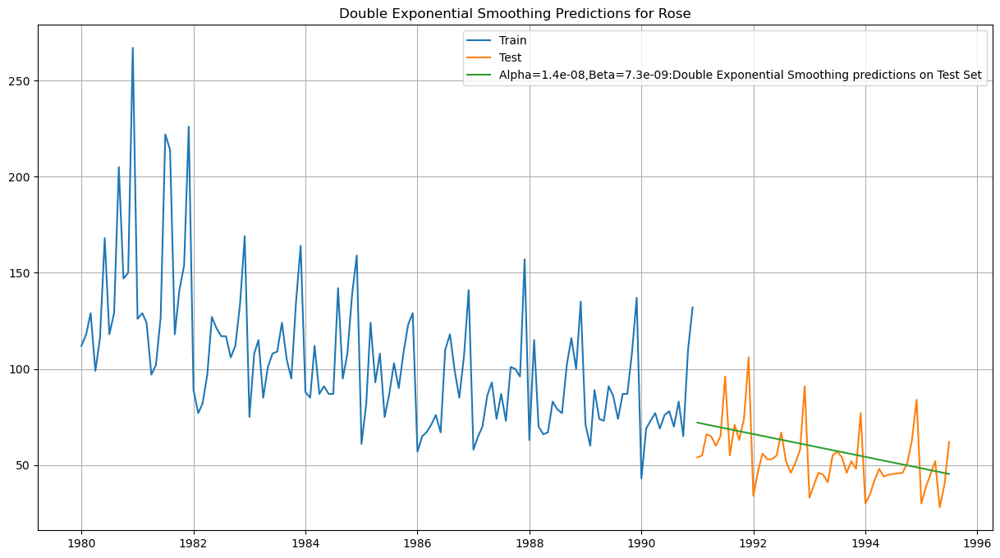

In [219]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(DES_train_rose, label='Train')
plt.plot(DES_test_rose, label='Test')

plt.plot(DES_predict_rose, label='Alpha=1.4e-08,Beta=7.3e-09:Double Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Double Exponential Smoothing Predictions for Rose');

In [220]:
from   sklearn.metrics                 import  mean_squared_error
print('DES RMSE:',mean_squared_error(DES_test_rose.values,DES_predict_rose.values,squared=False))

DES RMSE: 15.268956852847325


In [221]:
resultsDf_temp = pd.DataFrame({'Test RMSE Rose': [mean_squared_error(DES_test_rose.values,DES_predict_rose.values,squared=False)]}
                           ,index=['Alpha=1.4e-08,Beta=7.3e-09:DoubleExponentialSmoothing'])

resultsDf_rose = pd.concat([resultsDf_rose, resultsDf_temp])
resultsDf_rose

,Test RMSE Rose
Linear Regression,15.268955
Naive Model,79.718773
Simple Average Model,53.460570
2pointTrailingMovingAverage,11.529278
4pointTrailingMovingAverage,14.451403
6pointTrailingMovingAverage,14.566327
9pointTrailingMovingAverage,14.727630
"Alpha=0.098,SimpleExponentialSmoothing",36.796242
"Alpha=0.07,SimpleExponentialSmoothing",36.435772
"Alpha=1.4e-08,Beta=7.3e-09:DoubleExponentialSmoothing",15.268957


In [222]:
resultsDf_blank = pd.DataFrame({'Alpha Values':[],'Beta Values':[],'Train RMSE':[],'Test RMSE': []})
resultsDf_blank

,Alpha Values,Beta Values,Train RMSE,Test RMSE


In [223]:
model_DES_rose = Holt(DES_train_rose['Rose'])
for i in np.arange(0.1,1.1,0.1):
    for j in np.arange(0.1,1.1,0.1):
        model_DES_alpha_i_j = model_DES_rose.fit(smoothing_level=i,smoothing_trend=j,optimized=False,use_brute=True)
        DES_train_rose['predict',i,j] = model_DES_alpha_i_j.fittedvalues
        DES_test_rose['predict',i,j] = model_DES_alpha_i_j.forecast(steps=1000)
        
        rmse_model6_train = metrics.mean_squared_error(DES_train_rose['Rose'],DES_train_rose['predict',i,j],squared=False)
        
        rmse_model6_test = metrics.mean_squared_error(DES_test_rose['Rose'],DES_test_rose['predict',i,j],squared=False)
        
        resultsDf_blank = resultsDf_blank.append({'Alpha Values':i,'Beta Values':j,'Train RMSE':rmse_model6_train
                                          ,'Test RMSE':rmse_model6_test}, ignore_index=True)

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\665888735.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_blank = resultsDf_blank.append({'Alpha Values':i,'Beta Values':j,'Train RMSE':rmse_model6_train
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\665888735.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_blank = resultsDf_blank.append({'Alpha Values':i,'Beta Values':j,'Train RMSE':rmse_model6_train
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\665888735.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use p

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\665888735.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_blank = resultsDf_blank.append({'Alpha Values':i,'Beta Values':j,'Train RMSE':rmse_model6_train
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\665888735.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_blank = resultsDf_blank.append({'Alpha Values':i,'Beta Values':j,'Train RMSE':rmse_model6_train
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\665888735.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_blank = resultsDf_blank.append({'Alpha Values':i,'Beta Values':j,'Train RMSE':rmse_model6_train
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\665888735.py:12: FutureWar

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\665888735.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_blank = resultsDf_blank.append({'Alpha Values':i,'Beta Values':j,'Train RMSE':rmse_model6_train
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\665888735.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_blank = resultsDf_blank.append({'Alpha Values':i,'Beta Values':j,'Train RMSE':rmse_model6_train
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\665888735.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_blank = resultsDf_blank.append({'Alpha Values':i,'Beta Values':j,'Train RMSE':rmse_model6_train
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\665888735.py:12: FutureWar

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\665888735.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_blank = resultsDf_blank.append({'Alpha Values':i,'Beta Values':j,'Train RMSE':rmse_model6_train
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\665888735.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_blank = resultsDf_blank.append({'Alpha Values':i,'Beta Values':j,'Train RMSE':rmse_model6_train
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\665888735.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_blank = resultsDf_blank.append({'Alpha Values':i,'Beta Values':j,'Train RMSE':rmse_model6_train
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\665888735.py:12: FutureWar

In [224]:
resultsDf_blank.sort_values(by=['Test RMSE']).head()

,Alpha Values,Beta Values,Train RMSE,Test RMSE
0,0.1,0.1,34.439111,36.923416
1,0.1,0.2,33.450729,48.688648
10,0.2,0.1,33.097427,65.731702
2,0.1,0.3,33.145789,78.156641
20,0.3,0.1,33.611269,98.653317


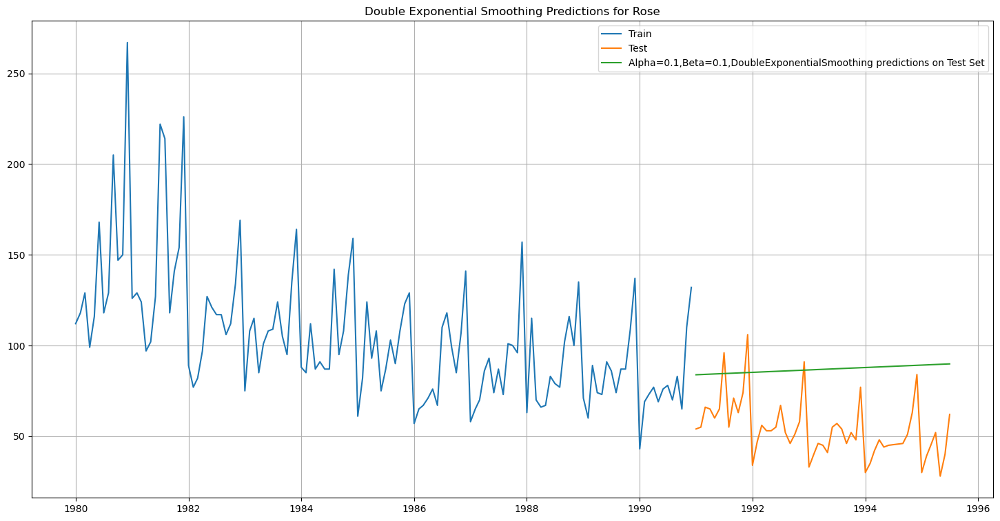

In [225]:
## Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(DES_train_rose['Rose'], label='Train')
plt.plot(DES_test_rose['Rose'], label='Test')

plt.plot(DES_test_rose['predict', 0.1, 0.1], label='Alpha=0.1,Beta=0.1,DoubleExponentialSmoothing predictions on Test Set')


plt.legend(loc='best')
plt.grid()
plt.title('Double Exponential Smoothing Predictions for Rose');

In [226]:
resultsDf_7_1 = pd.DataFrame({'Test RMSE Rose': [resultsDf_blank.sort_values(by=['Test RMSE']).values[0][3]]}
                           ,index=['Alpha=0.1,Beta=0.1,DoubleExponentialSmoothing'])

resultsDf_rose = pd.concat([resultsDf_rose, resultsDf_7_1])
resultsDf_rose

,Test RMSE Rose
Linear Regression,15.268955
Naive Model,79.718773
Simple Average Model,53.460570
2pointTrailingMovingAverage,11.529278
4pointTrailingMovingAverage,14.451403
6pointTrailingMovingAverage,14.566327
9pointTrailingMovingAverage,14.727630
"Alpha=0.098,SimpleExponentialSmoothing",36.796242
"Alpha=0.07,SimpleExponentialSmoothing",36.435772
"Alpha=1.4e-08,Beta=7.3e-09:DoubleExponentialSmoothing",15.268957


### Model 7 - Triple Exponential Model (Holt - winter's Model)

In [227]:
TES_train_rose = train_rose.copy()
TES_test_rose = test_rose.copy()

In [230]:
model_TES_rose = ExponentialSmoothing(TES_train_rose['Rose'],trend='multiplicative',seasonal='multiplicative',initialization_method='estimated')

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [231]:
model_TES_autofit_rose = model_TES_rose.fit()

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:83: RuntimeWarning: overflow encountered in matmul
  return err.T @ err


In [232]:
model_TES_autofit_rose.params

{'smoothing_level': 0.04987589102863182,
 'smoothing_trend': 0.04062836597595887,
 'smoothing_seasonal': 0.0007872538153684354,
 'damping_trend': nan,
 'initial_level': 111.17280748014831,
 'initial_trend': 0.9922029403878698,
 'initial_seasons': array([1.02459074, 1.16254604, 1.27236105, 1.11087077, 1.24979439,
        1.36076526, 1.49445559, 1.59212574, 1.51181689, 1.47785382,
        1.72383765, 2.37351566]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [233]:
## Prediction on the test data

TES_test_rose['auto_predict'] = model_TES_autofit_rose.forecast(steps=len(TES_test_rose))
TES_test_rose.head()

,Rose,auto_predict
YearMonth,,
1991-01-01,54.0,56.228831
1991-02-01,55.0,63.659988
1991-03-01,66.0,69.486365
1991-04-01,65.0,60.525715
1991-05-01,60.0,67.894957


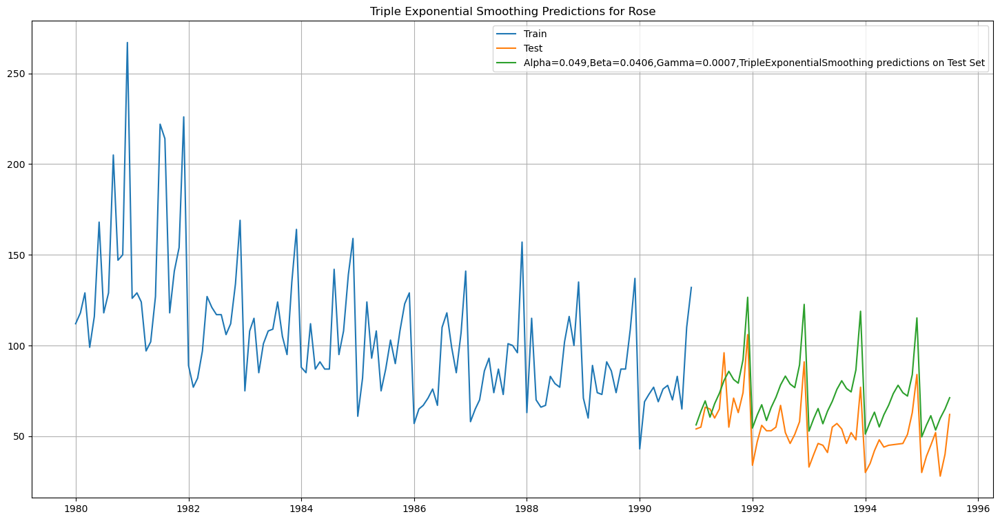

In [234]:
## Plotting on both the Training and Test using autofit

plt.figure(figsize=(18,9))
plt.plot(TES_train_rose['Rose'], label='Train')
plt.plot(TES_test_rose['Rose'], label='Test')

plt.plot(TES_test_rose['auto_predict'], label='Alpha=0.049,Beta=0.0406,Gamma=0.0007,TripleExponentialSmoothing predictions on Test Set')


plt.legend(loc='best')
plt.grid()
plt.title('Triple Exponential Smoothing Predictions for Rose');

In [235]:
## Test Data

rmse_model6_test_1_rose = metrics.mean_squared_error(TES_test_rose['Rose'],TES_test_rose['auto_predict'],squared=False)
print("For Alpha=0.049,Beta=0.0406,Gamma=0.0007, Triple Exponential Smoothing Model forecast on the Test Data,  RMSE is %3.3f" %(rmse_model6_test_1_rose))

For Alpha=0.049,Beta=0.0406,Gamma=0.0007, Triple Exponential Smoothing Model forecast on the Test Data,  RMSE is 21.649


In [236]:
resultsDf_8_1 = pd.DataFrame({'Test RMSE Rose': [rmse_model6_test_1_rose]}
                           ,index=['Alpha=0.049,Beta=0.0406,Gamma=0.0007,TripleExponentialSmoothing'])

resultsDf_rose = pd.concat([resultsDf_rose, resultsDf_8_1])
resultsDf_rose

,Test RMSE Rose
Linear Regression,15.268955
Naive Model,79.718773
Simple Average Model,53.460570
2pointTrailingMovingAverage,11.529278
4pointTrailingMovingAverage,14.451403
6pointTrailingMovingAverage,14.566327
9pointTrailingMovingAverage,14.727630
"Alpha=0.098,SimpleExponentialSmoothing",36.796242
"Alpha=0.07,SimpleExponentialSmoothing",36.435772
"Alpha=1.4e-08,Beta=7.3e-09:DoubleExponentialSmoothing",15.268957


In [237]:
## First we will define an empty dataframe to store our values from the loop

resultsDf_8_2 = pd.DataFrame({'Alpha Values':[],'Beta Values':[],'Gamma Values':[],'Train RMSE':[],'Test RMSE': []})
resultsDf_8_2

,Alpha Values,Beta Values,Gamma Values,Train RMSE,Test RMSE


In [238]:
for i in np.arange(0.1,1.1,0.1):
    for j in np.arange(0.1,1.1,0.1):
        for k in np.arange(0.1,1.1,0.1):
            model_TES_alpha_i_j_k = model_TES_rose.fit(smoothing_level=i,smoothing_trend=j,smoothing_seasonal=k,optimized=False,use_brute=True)
            TES_train_rose['predict',i,j,k] = model_TES_alpha_i_j_k.fittedvalues
            TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
        
            rmse_model8_train = metrics.mean_squared_error(TES_train_rose['Rose'],TES_train_rose['predict',i,j,k],squared=False)
            
            rmse_model8_test = metrics.mean_squared_error(TES_test_rose['Rose'],TES_test_rose['predict',i,j,k],squared=False)
            
            resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
                                                  'Train RMSE':rmse_model8_train,'Test RMSE':rmse_model8_test}
                                                 , ignore_index=True)

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1353: RuntimeWarning: overflow encountered in multiply
  trend = trended(lvls, b)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1357: RuntimeWarning: overflow encountered in multiply
  fitted = trend * s[:-m]
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values'

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_train_rose['predict',i,j,k] = model_TES_alpha_i_j_k.fittedvalues
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a 

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_train_rose['predict',i,j,k] = model_TES_alpha_i_j_k.fittedvalues
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a 

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1352: RuntimeWarning: overflow encountered in power
  b[nobs:] = dampen(b[nobs], phi_h)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1353: RuntimeWarning: overflow encountered in multiply
  trend = trended(lvls, b)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha 

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_train_rose['predict',i,j,k] = model_TES_alpha_i_j_k.fittedvalues
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a 

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1352: RuntimeWarning: overflow encountered in power
  b[nobs:] = dampen(b[nobs], phi_h)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1353: RuntimeWarning: overflow encountered in multiply
  trend = trended(lvls, b)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha 

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1352: RuntimeWarning: overflow encountered in power
  b[nobs:] = dampen(b[nobs], phi_h)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1353: RuntimeWarning: overflow encountered in multiply
  trend = trended(lvls, b)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha 

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_train_rose['predict',i,j,k] = model_TES_alpha_i_j_k.fittedvalues
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1352: RuntimeWarning: overflow encountered in power
  b[nobs:] = dampen(b[nobs], phi_h)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1353: RuntimeWarning: overflow encountered in multiply
  trend = trended(lvls, b)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once usin

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_train_rose['predict',i,j,k] = model_TES_alpha_i_j_k.fittedvalues
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a futur

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1352: RuntimeWarning: overflow encountered in power
  b[nobs:] = dampen(b[nobs], phi_h)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1353: RuntimeWarning: overflow encountered in multiply
  trend = trended(lvls, b)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha 

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_train_rose['predict',i,j,k] = model_TES_alpha_i_j_k.fittedvalues
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a futur

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1352: RuntimeWarning: overflow encountered in power
  b[nobs:] = dampen(b[nobs], phi_h)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1353: RuntimeWarning: overflow encountered in multiply
  trend = trended(lvls, b)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha 

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1352: RuntimeWarning: overflow encountered in power
  b[nobs:] = dampen(b[nobs], phi_h)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1353: RuntimeWarning: overflow encountered in multiply
  trend = trended(lvls, b)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha 

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1352: RuntimeWarning: overflow encountered in power
  b[nobs:] = dampen(b[nobs], phi_h)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1353: RuntimeWarning: overflow encountered in multiply
  trend = trended(lvls, b)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha 

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1352: RuntimeWarning: overflow encountered in power
  b[nobs:] = dampen(b[nobs], phi_h)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1353: RuntimeWarning: overflow encountered in multiply
  trend = trended(lvls, b)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha 

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1352: RuntimeWarning: overflow encountered in power
  b[nobs:] = dampen(b[nobs], phi_h)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1353: RuntimeWarning: overflow encountered in multiply
  trend = trended(lvls, b)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha 

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1352: RuntimeWarning: overflow encountered in power
  b[nobs:] = dampen(b[nobs], phi_h)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1353: RuntimeWarning: overflow encountered in multiply
  trend = trended(lvls, b)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1357: RuntimeWarning: overflow encountered in multiply
  fitted = trend * s[:-m]
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The 

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1352: RuntimeWarning: overflow encountered in power
  b[nobs:] = dampen(b[nobs], phi_h)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:1353: RuntimeWarning: overflow encountered in multiply
  trend = trended(lvls, b)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha 

C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  TES_test_rose['predict',i,j,k] = model_TES_alpha_i_j_k.forecast(steps=1000)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resultsDf_8_2 = resultsDf_8_2.append({'Alpha Values':i,'Beta Values':j,'Gamma Values':k,
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2759139432.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To

ValueError: Input contains infinity or a value too large for dtype('float64').

In [239]:
resultsDf_8_2.sort_values(by=['Test RMSE']).head()

,Alpha Values,Beta Values,Gamma Values,Train RMSE,Test RMSE
161,0.2,0.7,0.2,24.042290,8.702460
215,0.3,0.2,0.6,26.940472,10.206702
10,0.1,0.2,0.1,19.647823,11.133402
11,0.1,0.2,0.2,20.172839,11.403697
12,0.1,0.2,0.3,20.828952,11.826158


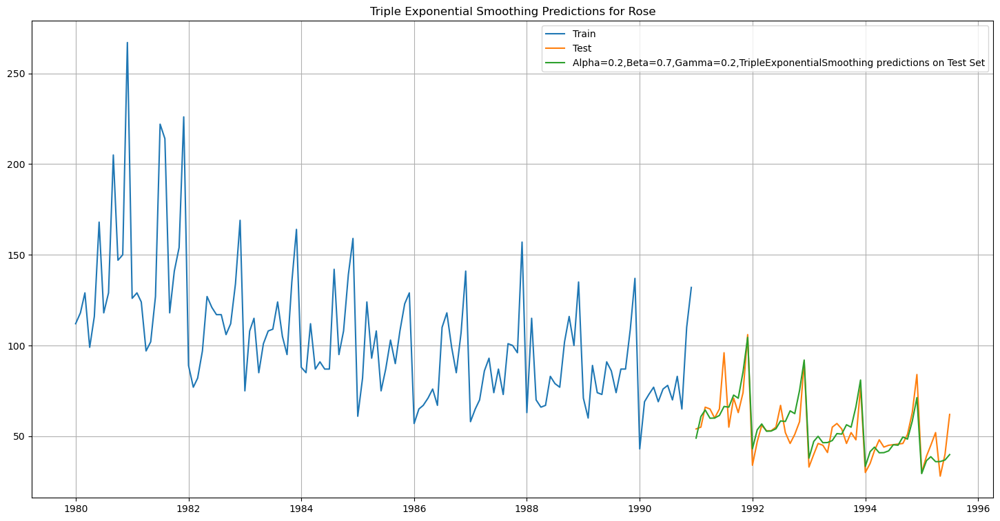

In [240]:
## Plotting on both the Training and Test data using brute force alpha, beta and gamma determination

plt.figure(figsize=(18,9))
plt.plot(TES_train_rose['Rose'], label='Train')
plt.plot(TES_test_rose['Rose'], label='Test')

#The value of alpha and beta is taken like that by python
plt.plot(TES_test_rose['predict', 0.20000000000000002,0.70000000000000007,0.2], label='Alpha=0.2,Beta=0.7,Gamma=0.2,TripleExponentialSmoothing predictions on Test Set')


plt.legend(loc='best')
plt.grid()
plt.title('Triple Exponential Smoothing Predictions for Rose');

In [241]:
resultsDf_8_3 = pd.DataFrame({'Test RMSE Rose': [resultsDf_8_2.sort_values(by=['Test RMSE']).values[0][4]]}
                           ,index=['Alpha=0.2,Beta=0.7,Gamma=0.2,TripleExponentialSmoothing'])

resultsDf_rose = pd.concat([resultsDf_rose, resultsDf_8_3])
resultsDf_rose

,Test RMSE Rose
Linear Regression,15.268955
Naive Model,79.718773
Simple Average Model,53.460570
2pointTrailingMovingAverage,11.529278
4pointTrailingMovingAverage,14.451403
6pointTrailingMovingAverage,14.566327
9pointTrailingMovingAverage,14.727630
"Alpha=0.098,SimpleExponentialSmoothing",36.796242
"Alpha=0.07,SimpleExponentialSmoothing",36.435772
"Alpha=1.4e-08,Beta=7.3e-09:DoubleExponentialSmoothing",15.268957


### Checking for stationarity of the data on which the model is being built on using appropriate statistical tests along with the hypothesis for the statistical test. 

Ho: Time series is non-stationary

Ha: Time series is stationary

Also given that alpha = 0.05

In [242]:
## Test for stationarity of the series - Dicky Fuller test

from statsmodels.tsa.stattools import adfuller
def test_stationarity(timeseries):
    
    #Determing rolling statistics
    rolmean = timeseries.rolling(window=7).mean() #determining the rolling mean
    rolstd = timeseries.rolling(window=7).std()   #determining the rolling standard deviation

    #Plot rolling statistics:
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    #Perform Dickey-Fuller test:
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput,'\n')

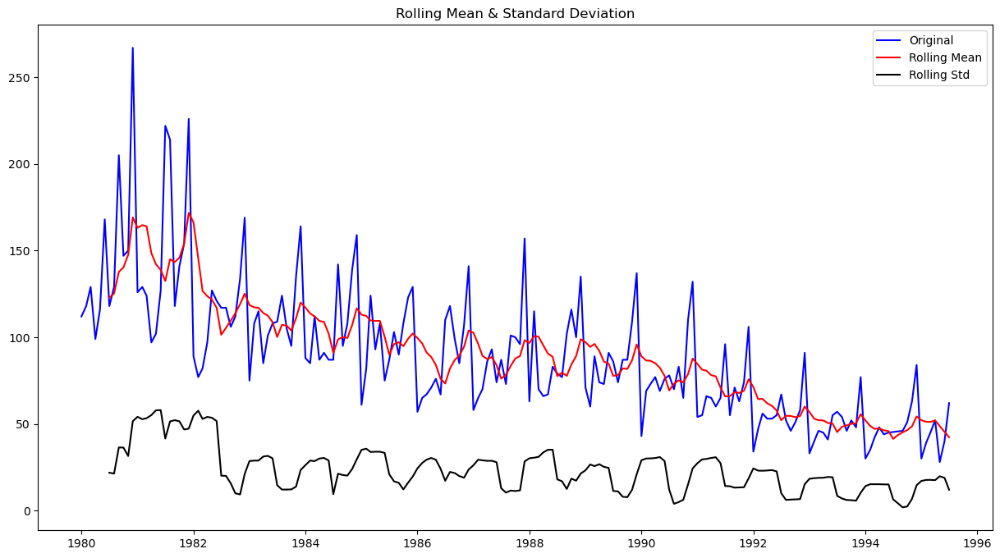

Results of Dickey-Fuller Test:
Test Statistic                  -1.876699
p-value                          0.343101
#Lags Used                      13.000000
Number of Observations Used    173.000000
Critical Value (1%)             -3.468726
Critical Value (5%)             -2.878396
Critical Value (10%)            -2.575756
dtype: float64 



In [243]:
test_stationarity(df_rose['Rose'])

Since p-value (0.34) is greater than alpha (0.05), we fail to reject the Null Hypothesis.

Therefore Rose time series is Non-stationary

Let us take a difference of order 1 and check whether the Time Series is stationary or not.

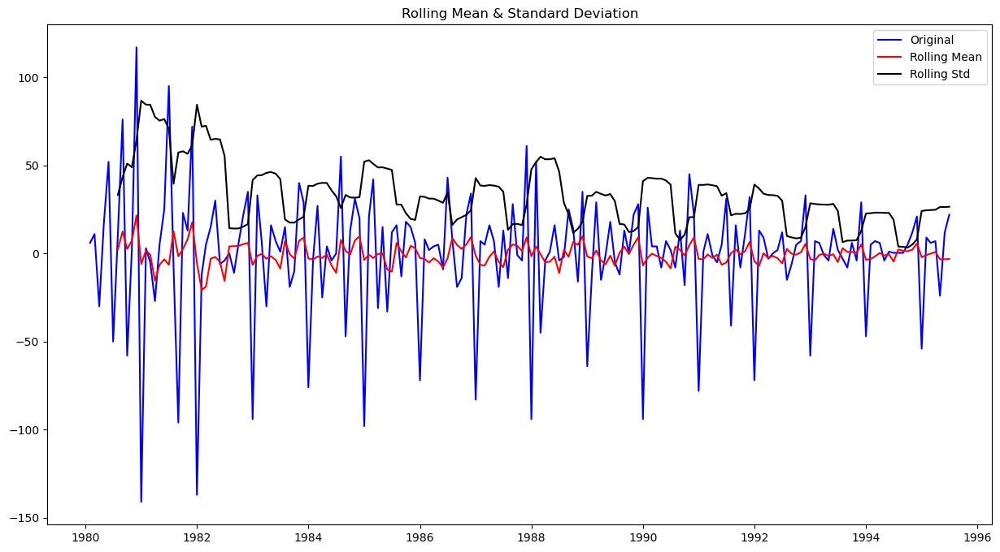

Results of Dickey-Fuller Test:
Test Statistic                -8.044392e+00
p-value                        1.810895e-12
#Lags Used                     1.200000e+01
Number of Observations Used    1.730000e+02
Critical Value (1%)           -3.468726e+00
Critical Value (5%)           -2.878396e+00
Critical Value (10%)          -2.575756e+00
dtype: float64 



In [244]:
test_stationarity(df_rose['Rose'].diff().dropna())

For this series, the p-value (1.8e-12) is less than alpha (0.05), therefore we can reject the null hypothesis.

Therefore the series at difference of order 1 is stationary

### Building an automated version of the ARIMA/SARIMA model in which the parameters are selected using the lowest Akaike Information Criteria (AIC) on the training data and evaluating this model on the test data using RMSE.

First we check if train data is stationary

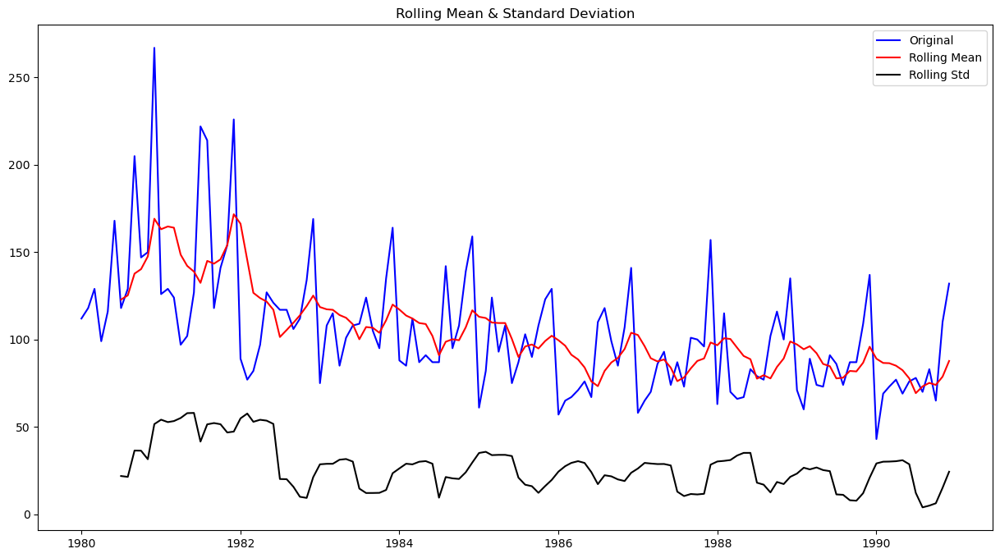

Results of Dickey-Fuller Test:
Test Statistic                  -2.164250
p-value                          0.219476
#Lags Used                      13.000000
Number of Observations Used    118.000000
Critical Value (1%)             -3.487022
Critical Value (5%)             -2.886363
Critical Value (10%)            -2.580009
dtype: float64 



In [245]:
test_stationarity(train_rose['Rose'])

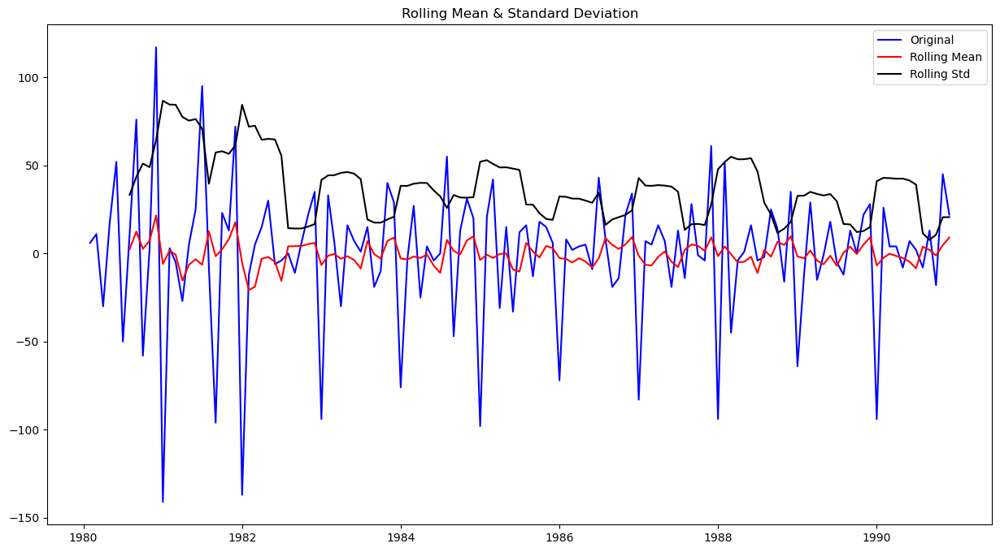

Results of Dickey-Fuller Test:
Test Statistic                -6.592372e+00
p-value                        7.061944e-09
#Lags Used                     1.200000e+01
Number of Observations Used    1.180000e+02
Critical Value (1%)           -3.487022e+00
Critical Value (5%)           -2.886363e+00
Critical Value (10%)          -2.580009e+00
dtype: float64 



In [246]:
test_stationarity(train_rose['Rose'].diff().dropna())

We check the ACF and PACF plots now

In [247]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

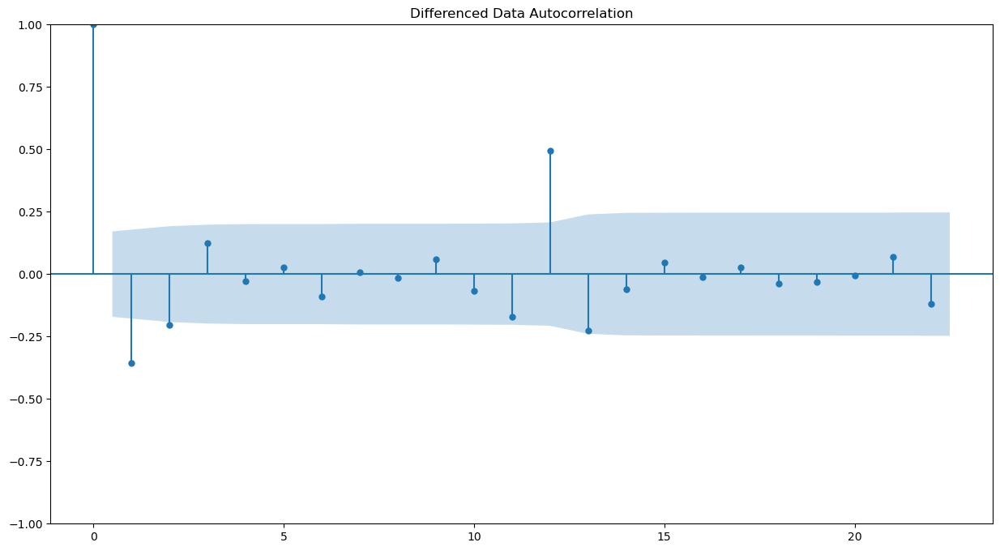

In [248]:
plot_acf(train_rose['Rose'].diff().dropna(),title='Differenced Data Autocorrelation')
plt.show()

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


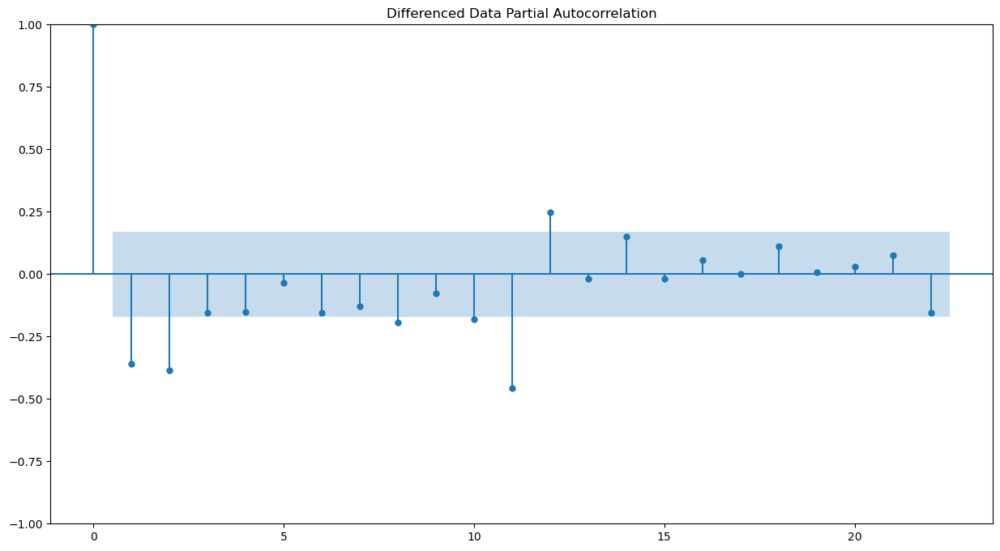

In [249]:
plot_pacf(train_rose['Rose'].diff().dropna(),title='Differenced Data Partial Autocorrelation')
plt.show()

From the plot, 
p=2 

q=2

In [250]:
## The following loop helps us in getting a combination of different parameters of p and q in the range of 0 and 2
## We have kept the value of d as 1 as we need to take a difference of the series to make it stationary.

import itertools
p = q = range(0, 3)
d= range(1,2)
pdq = list(itertools.product(p, d, q))
print('Some parameter combinations for the Model...')
for i in range(1,len(pdq)):
    print('Model: {}'.format(pdq[i]))

Some parameter combinations for the Model...
Model: (0, 1, 1)
Model: (0, 1, 2)
Model: (1, 1, 0)
Model: (1, 1, 1)
Model: (1, 1, 2)
Model: (2, 1, 0)
Model: (2, 1, 1)
Model: (2, 1, 2)


In [251]:
# Creating an empty Dataframe with column names only
ARIMA_AIC = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AIC

,param,AIC


In [255]:
from statsmodels.tsa.arima.model import ARIMA

for param in pdq:
    ARIMA_model = ARIMA(train_rose['Rose'].values,order=param).fit()
    print('ARIMA{} - AIC:{}'.format(param,ARIMA_model.aic))
    ARIMA_AIC = ARIMA_AIC.append({'param':param, 'AIC': ARIMA_model.aic}, ignore_index=True)

ARIMA(0, 1, 0) - AIC:1333.1546729124348
ARIMA(0, 1, 1) - AIC:1282.3098319748333
ARIMA(0, 1, 2) - AIC:1279.671528853574
ARIMA(1, 1, 0) - AIC:1317.3503105381546


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2972871522.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ARIMA_AIC = ARIMA_AIC.append({'param':param, 'AIC': ARIMA_model.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2972871522.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ARIMA_AIC = ARIMA_AIC.append({'param':param, 'AIC': ARIMA_model.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2972871522.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ARIMA_AIC = ARIMA_AIC.append({'param':param, 'AIC': ARIMA_model.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2972871522.py:6: FutureWarning: The frame.append method is deprecated and wil

ARIMA(1, 1, 1) - AIC:1280.5742295380066
ARIMA(1, 1, 2) - AIC:1279.870723423191
ARIMA(2, 1, 0) - AIC:1298.6110341604885


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2972871522.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ARIMA_AIC = ARIMA_AIC.append({'param':param, 'AIC': ARIMA_model.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2972871522.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ARIMA_AIC = ARIMA_AIC.append({'param':param, 'AIC': ARIMA_model.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2972871522.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ARIMA_AIC = ARIMA_AIC.append({'param':param, 'AIC': ARIMA_model.aic}, ignore_index=True)


ARIMA(2, 1, 1) - AIC:1281.5078621868474
ARIMA(2, 1, 2) - AIC:1281.870722226405


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2972871522.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ARIMA_AIC = ARIMA_AIC.append({'param':param, 'AIC': ARIMA_model.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\2972871522.py:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ARIMA_AIC = ARIMA_AIC.append({'param':param, 'AIC': ARIMA_model.aic}, ignore_index=True)


In [256]:
## Sort the above AIC values in the ascending order to get the parameters for the minimum AIC value

ARIMA_AIC.sort_values(by='AIC',ascending=True)

,param,AIC
2,"(0, 1, 2)",1279.671529
5,"(1, 1, 2)",1279.870723
4,"(1, 1, 1)",1280.574230
7,"(2, 1, 1)",1281.507862
8,"(2, 1, 2)",1281.870722
1,"(0, 1, 1)",1282.309832
6,"(2, 1, 0)",1298.611034
3,"(1, 1, 0)",1317.350311
0,"(0, 1, 0)",1333.154673


In [257]:
auto_ARIMA = ARIMA(train_rose['Rose'], order=(0,1,2))

results_auto_ARIMA = auto_ARIMA.fit()

print(results_auto_ARIMA.summary())

                               SARIMAX Results                                
Dep. Variable:                   Rose   No. Observations:                  132
Model:                 ARIMA(0, 1, 2)   Log Likelihood                -636.836
Date:                Sun, 02 Apr 2023   AIC                           1279.672
Time:                        23:15:36   BIC                           1288.297
Sample:                    01-01-1980   HQIC                          1283.176
                         - 12-01-1990                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6970      0.072     -9.689      0.000      -0.838      -0.556
ma.L2         -0.2042      0.073     -2.794      0.005      -0.347      -0.061
sigma2       965.8407     88.305     10.938      0.0

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [258]:
predicted_auto_ARIMA = results_auto_ARIMA.forecast(steps=len(test_rose))

In [260]:
from sklearn.metrics import  mean_squared_error
rmse = mean_squared_error(test_rose['Rose'],predicted_auto_ARIMA,squared=False)
print(rmse)

37.30647972368469


In [261]:
resultsDf_8_1 = pd.DataFrame({'Test RMSE Rose': [rmse]}
                           ,index=['ARIMA(0,1,2) AIC criteria'])

resultsDf_rose = pd.concat([resultsDf_rose, resultsDf_8_1])
resultsDf_rose

,Test RMSE Rose
Linear Regression,15.268955
Naive Model,79.718773
Simple Average Model,53.460570
2pointTrailingMovingAverage,11.529278
4pointTrailingMovingAverage,14.451403
6pointTrailingMovingAverage,14.566327
9pointTrailingMovingAverage,14.727630
"Alpha=0.098,SimpleExponentialSmoothing",36.796242
"Alpha=0.07,SimpleExponentialSmoothing",36.435772
"Alpha=1.4e-08,Beta=7.3e-09:DoubleExponentialSmoothing",15.268957


We would now create a SARIMA model for the same

Now we check for seasonality 12

In [262]:
import itertools
p = q = range(0, 3)
d= range(1,2)
D = range(0,1)
pdq = list(itertools.product(p, d, q))
model_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, D, q))]
print('Examples of some parameter combinations for Model...')
for i in range(1,len(pdq)):
    print('Model: {}{}'.format(pdq[i], model_pdq[i]))

Examples of some parameter combinations for Model...
Model: (0, 1, 1)(0, 0, 1, 12)
Model: (0, 1, 2)(0, 0, 2, 12)
Model: (1, 1, 0)(1, 0, 0, 12)
Model: (1, 1, 1)(1, 0, 1, 12)
Model: (1, 1, 2)(1, 0, 2, 12)
Model: (2, 1, 0)(2, 0, 0, 12)
Model: (2, 1, 1)(2, 0, 1, 12)
Model: (2, 1, 2)(2, 0, 2, 12)


In [263]:
SARIMA_AIC = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AIC

,param,seasonal,AIC


In [264]:
import statsmodels.api as sm

for param in pdq:
    for param_seasonal in model_pdq:
        SARIMA_model = sm.tsa.statespace.SARIMAX(train_rose['Rose'].values,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            
        results_SARIMA = SARIMA_model.fit(maxiter=1000)
        print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_SARIMA.aic))
        SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)

SARIMA(0, 1, 0)x(0, 0, 0, 12) - AIC:1323.9657875279158
SARIMA(0, 1, 0)x(0, 0, 1, 12) - AIC:1145.4230827207425


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 0)x(0, 0, 2, 12) - AIC:976.4375296380884
SARIMA(0, 1, 0)x(1, 0, 0, 12) - AIC:1139.921738995602


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 0)x(1, 0, 1, 12) - AIC:1116.0207869385463


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 0)x(1, 0, 2, 12) - AIC:969.6913635754156
SARIMA(0, 1, 0)x(2, 0, 0, 12) - AIC:960.8812220353041


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 0)x(2, 0, 1, 12) - AIC:962.879454069754


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 0)x(2, 0, 2, 12) - AIC:955.5735408945737
SARIMA(0, 1, 1)x(0, 0, 0, 12) - AIC:1263.5369097383968


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(0, 0, 1, 12) - AIC:1098.5554825918337


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(0, 0, 2, 12) - AIC:923.6314049383991
SARIMA(0, 1, 1)x(1, 0, 0, 12) - AIC:1095.79363249174


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(1, 0, 1, 12) - AIC:1054.743433094739


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(1, 0, 2, 12) - AIC:918.8573483311246


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(2, 0, 0, 12) - AIC:914.5982866535912


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(2, 0, 1, 12) - AIC:915.3332430461671


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 1)x(2, 0, 2, 12) - AIC:901.1988393573358
SARIMA(0, 1, 2)x(0, 0, 0, 12) - AIC:1251.6675430541047


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(0, 0, 1, 12) - AIC:1083.4866975264927


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(0, 0, 2, 12) - AIC:913.49384866177
SARIMA(0, 1, 2)x(1, 0, 0, 12) - AIC:1088.833284341292


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(1, 0, 1, 12) - AIC:1045.5400933529252


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(1, 0, 2, 12) - AIC:904.8310913530245


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(2, 0, 0, 12) - AIC:913.0105912257978


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(2, 0, 1, 12) - AIC:914.1707545022907


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(0, 1, 2)x(2, 0, 2, 12) - AIC:887.9375085679283
SARIMA(1, 1, 0)x(0, 0, 0, 12) - AIC:1308.161871082466
SARIMA(1, 1, 0)x(0, 0, 1, 12) - AIC:1135.2955447585719


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 0)x(0, 0, 2, 12) - AIC:963.9405391257694
SARIMA(1, 1, 0)x(1, 0, 0, 12) - AIC:1124.8860786804594


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 0)x(1, 0, 1, 12) - AIC:1105.4080055025202


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 0)x(1, 0, 2, 12) - AIC:958.5001972948634
SARIMA(1, 1, 0)x(2, 0, 0, 12) - AIC:939.0984778664086


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 0)x(2, 0, 1, 12) - AIC:940.9087133661072


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 0)x(2, 0, 2, 12) - AIC:942.2973103070816
SARIMA(1, 1, 1)x(0, 0, 0, 12) - AIC:1262.1840064255505


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(0, 0, 1, 12) - AIC:1094.317270864075


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(0, 0, 2, 12) - AIC:923.0862224063864


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(1, 0, 0, 12) - AIC:1083.3937965031587


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(1, 0, 1, 12) - AIC:1054.7180547136054


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(1, 0, 2, 12) - AIC:916.3549428510464


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(2, 0, 0, 12) - AIC:905.9249060842681


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(2, 0, 1, 12) - AIC:907.2972867470706


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 1)x(2, 0, 2, 12) - AIC:900.6725795936893
SARIMA(1, 1, 2)x(0, 0, 0, 12) - AIC:1251.9495040706117


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(0, 0, 1, 12) - AIC:1085.4861928101097


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(0, 0, 2, 12) - AIC:915.4938402590946


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(1, 0, 0, 12) - AIC:1090.7760924546074


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(1, 0, 1, 12) - AIC:1042.6183211435978


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(1, 0, 2, 12) - AIC:906.7318500331239


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(2, 0, 0, 12) - AIC:906.1690196639732


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(2, 0, 1, 12) - AIC:907.4597831589625


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(1, 1, 2)x(2, 0, 2, 12) - AIC:889.9020618719065
SARIMA(2, 1, 0)x(0, 0, 0, 12) - AIC:1280.253756153577
SARIMA(2, 1, 0)x(0, 0, 1, 12) - AIC:1128.7773704710778


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(0, 0, 2, 12) - AIC:958.0793208829945
SARIMA(2, 1, 0)x(1, 0, 0, 12) - AIC:1099.5086021575923


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(1, 0, 1, 12) - AIC:1076.7863198641166


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(1, 0, 2, 12) - AIC:951.1988165559324


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(2, 0, 0, 12) - AIC:924.6004792645455


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(2, 0, 1, 12) - AIC:925.9757801384499


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 0)x(2, 0, 2, 12) - AIC:927.8380693280801
SARIMA(2, 1, 1)x(0, 0, 0, 12) - AIC:1263.231523179479


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(0, 0, 1, 12) - AIC:1094.2093491949477


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(0, 0, 2, 12) - AIC:922.9408472094739


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(1, 0, 0, 12) - AIC:1071.4249601101285


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(1, 0, 1, 12) - AIC:1052.9244471204274


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(1, 0, 2, 12) - AIC:916.2424912822424


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(2, 0, 0, 12) - AIC:896.5181608175465


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(2, 0, 1, 12) - AIC:897.6399565369534


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 1)x(2, 0, 2, 12) - AIC:899.483586628093
SARIMA(2, 1, 2)x(0, 0, 0, 12) - AIC:1253.910211614667


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)
C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(0, 0, 1, 12) - AIC:1085.964355259819


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(0, 0, 2, 12) - AIC:916.3258311123247


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(1, 0, 0, 12) - AIC:1073.2912713705325


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(1, 0, 1, 12) - AIC:1044.190935382574


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(1, 0, 2, 12) - AIC:907.6661488803527


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(2, 0, 0, 12) - AIC:897.346444185432


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(2, 0, 1, 12) - AIC:898.3781889009925


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


SARIMA(2, 1, 2)x(2, 0, 2, 12) - AIC:890.6687980835222


C:\Users\cheru\AppData\Local\Temp\ipykernel_18188\4024192068.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  SARIMA_AIC = SARIMA_AIC.append({'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}, ignore_index=True)


In [265]:
SARIMA_AIC.sort_values(by=['AIC']).head()

,param,seasonal,AIC
26,"(0, 1, 2)","(2, 0, 2, 12)",887.937509
53,"(1, 1, 2)","(2, 0, 2, 12)",889.902062
80,"(2, 1, 2)","(2, 0, 2, 12)",890.668798
69,"(2, 1, 1)","(2, 0, 0, 12)",896.518161
78,"(2, 1, 2)","(2, 0, 0, 12)",897.346444


In [266]:
import statsmodels.api as sm

auto_SARIMA_12 = sm.tsa.statespace.SARIMAX(train_rose['Rose'].values,
                                order=(0, 1, 2),
                                seasonal_order=(2, 0, 2, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA_12 = auto_SARIMA_12.fit(maxiter=1000)
print(results_auto_SARIMA_12.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                  132
Model:             SARIMAX(0, 1, 2)x(2, 0, 2, 12)   Log Likelihood                -436.969
Date:                            Sun, 02 Apr 2023   AIC                            887.938
Time:                                    23:18:20   BIC                            906.448
Sample:                                         0   HQIC                           895.437
                                            - 132                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8427    189.720     -0.004      0.996    -372.688     371.003
ma.L2         -0.1573     29.806   

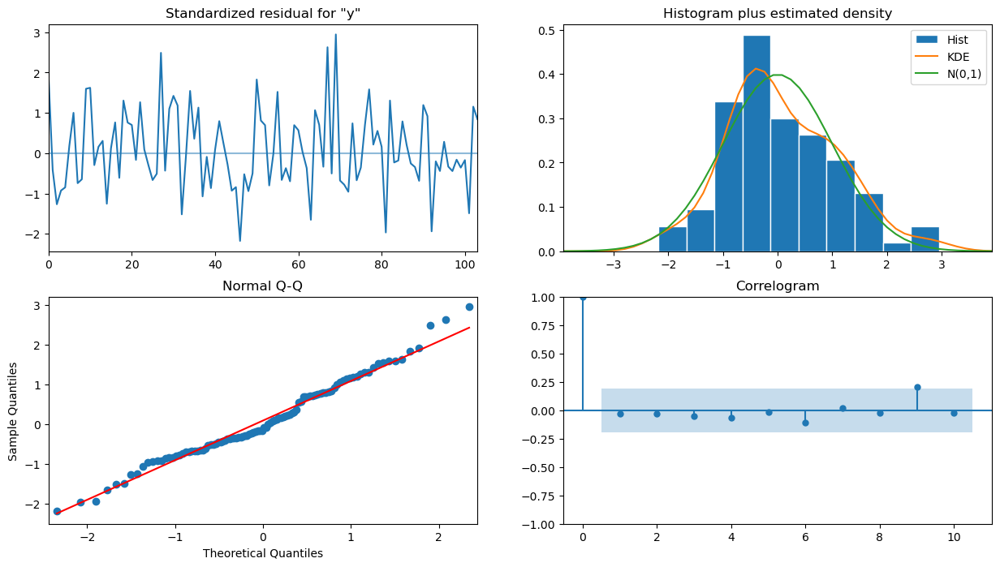

In [267]:
results_auto_SARIMA_12.plot_diagnostics()
plt.show()

In [268]:
predicted_auto_SARIMA_12 = results_auto_SARIMA_12.get_forecast(steps=len(test_rose))

In [269]:
predicted_auto_SARIMA_12.summary_frame(alpha=0.05).head()

y,mean,mean_se,mean_ci_lower,mean_ci_upper
0,62.867263,15.928500,31.647976,94.086550
1,70.541190,16.147658,38.892361,102.190019
2,77.356410,16.147656,45.707586,109.005235
3,76.208814,16.147656,44.559989,107.857638
4,72.747398,16.147656,41.098573,104.396222


In [270]:
rmse = mean_squared_error(test_rose['Rose'],predicted_auto_SARIMA_12.predicted_mean,squared=False)
print(rmse)

26.928361469014003


In [271]:
resultsDf_8_1 = pd.DataFrame({'Test RMSE Rose': [rmse]}
                           ,index=['SARIMA(0,1,2)(2,0,2,12) AIC criteria'])

resultsDf_rose = pd.concat([resultsDf_rose, resultsDf_8_1])
resultsDf_rose

,Test RMSE Rose
Linear Regression,15.268955
Naive Model,79.718773
Simple Average Model,53.460570
2pointTrailingMovingAverage,11.529278
4pointTrailingMovingAverage,14.451403
6pointTrailingMovingAverage,14.566327
9pointTrailingMovingAverage,14.727630
"Alpha=0.098,SimpleExponentialSmoothing",36.796242
"Alpha=0.07,SimpleExponentialSmoothing",36.435772
"Alpha=1.4e-08,Beta=7.3e-09:DoubleExponentialSmoothing",15.268957


### Building ARIMA/SARIMA models based on the cut-off points of ACF and PACF on the training data and evaluating this model on the test data using RMSE.

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


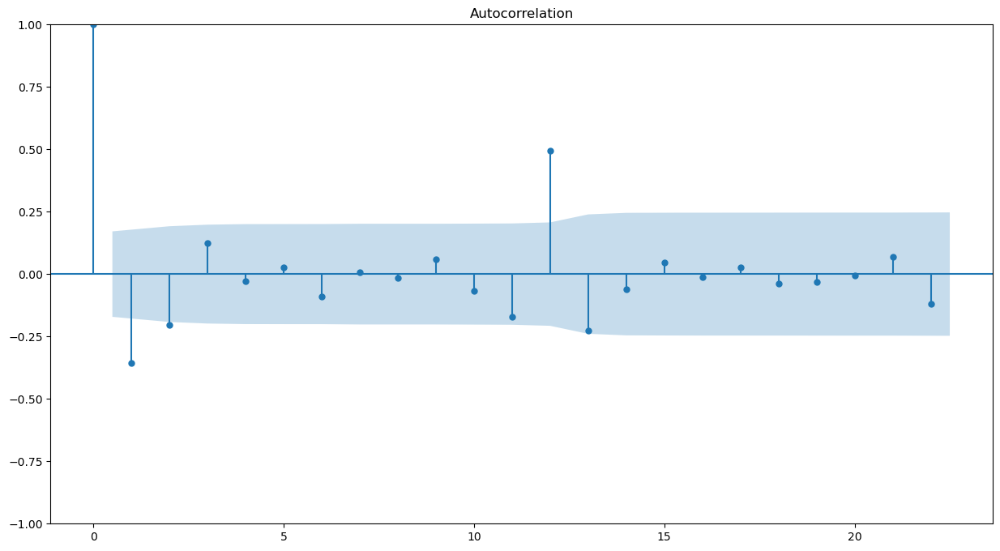

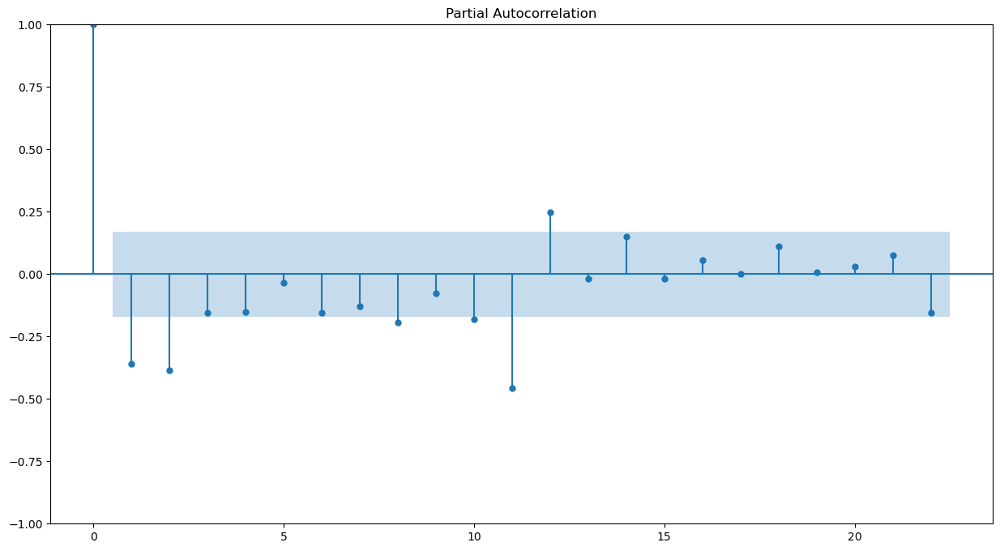

In [272]:
plot_acf((train_rose['Rose'].diff().dropna()))
plot_pacf((train_rose['Rose'].diff().dropna()));

p = q = 2

d = 1

In [273]:
manual_ARIMA = ARIMA(train_rose['Rose'].astype('float64'), order=(2,1,2))

results_manual_ARIMA = manual_ARIMA.fit()

print(results_manual_ARIMA.summary())

                               SARIMAX Results                                
Dep. Variable:                   Rose   No. Observations:                  132
Model:                 ARIMA(2, 1, 2)   Log Likelihood                -635.935
Date:                Sun, 02 Apr 2023   AIC                           1281.871
Time:                        23:19:10   BIC                           1296.247
Sample:                    01-01-1980   HQIC                          1287.712
                         - 12-01-1990                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4540      0.469     -0.969      0.333      -1.372       0.464
ar.L2          0.0001      0.170      0.001      0.999      -0.334       0.334
ma.L1         -0.2541      0.459     -0.554      0.5

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [274]:
predicted_manual_ARIMA = results_manual_ARIMA.forecast(steps=len(test_rose))

In [278]:
rmse = mean_squared_error(test_rose['Rose'],predicted_manual_ARIMA,squared=False)
print(rmse)

36.871196625493255


In [279]:
resultsDf_8_1 = pd.DataFrame({'Test RMSE Rose': [rmse]}
                           ,index=['ARIMA(2,1,2) Manual plot'])

resultsDf_rose = pd.concat([resultsDf_rose, resultsDf_8_1])
resultsDf_rose

,Test RMSE Rose
Linear Regression,15.268955
Naive Model,79.718773
Simple Average Model,53.460570
2pointTrailingMovingAverage,11.529278
4pointTrailingMovingAverage,14.451403
6pointTrailingMovingAverage,14.566327
9pointTrailingMovingAverage,14.727630
"Alpha=0.098,SimpleExponentialSmoothing",36.796242
"Alpha=0.07,SimpleExponentialSmoothing",36.435772
"Alpha=1.4e-08,Beta=7.3e-09:DoubleExponentialSmoothing",15.268957


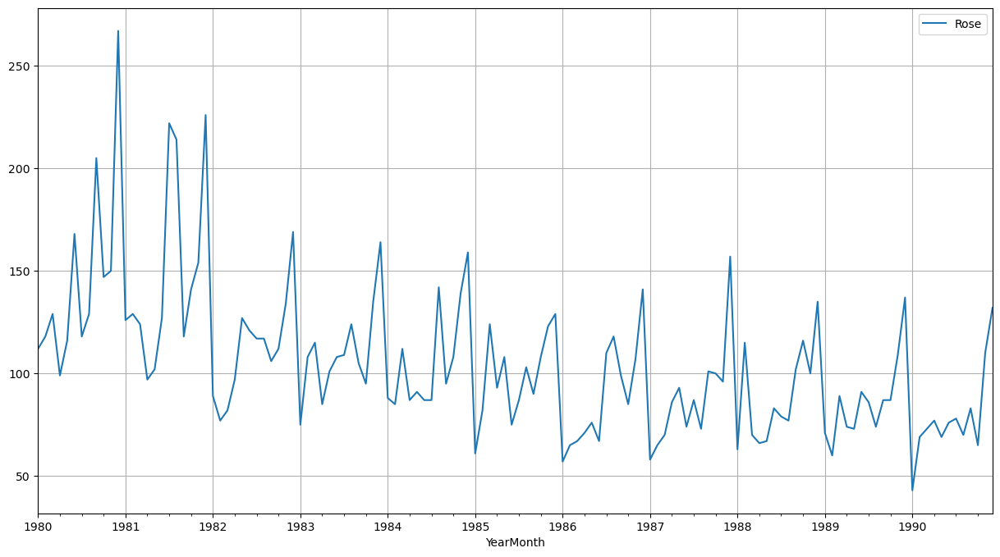

In [280]:
train_rose.plot()
plt.grid();

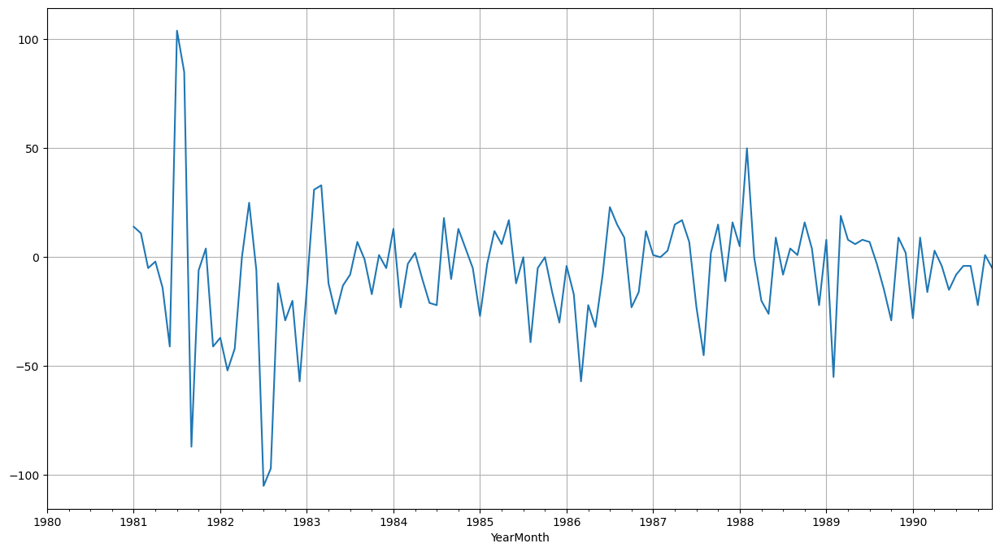

In [281]:
# We see that there is a trend and a seasonality. So, now we take a seasonal differencing and check the series.

(train_rose['Rose'].diff(12)).plot()
plt.grid();

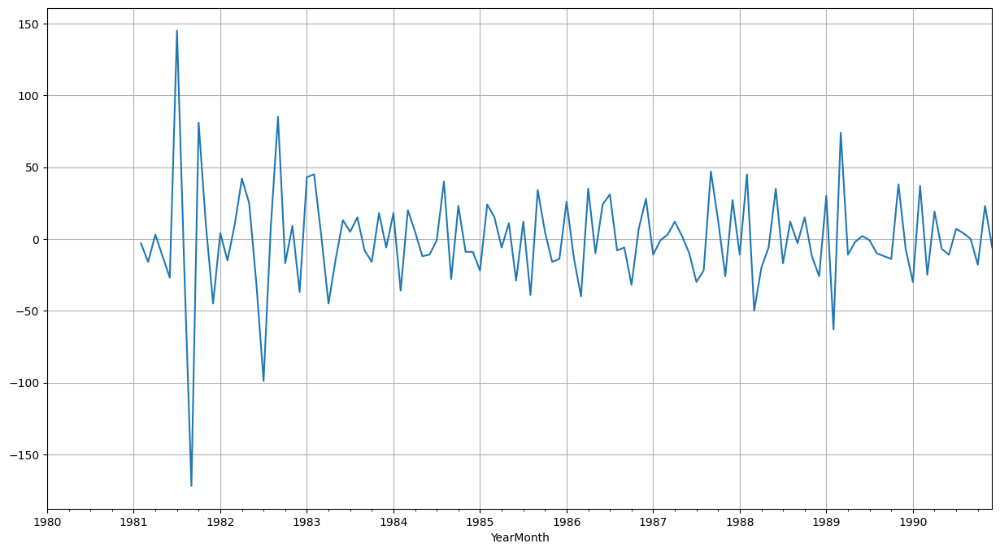

In [282]:
(train_rose['Rose'].diff(12)).diff().plot()
plt.grid();

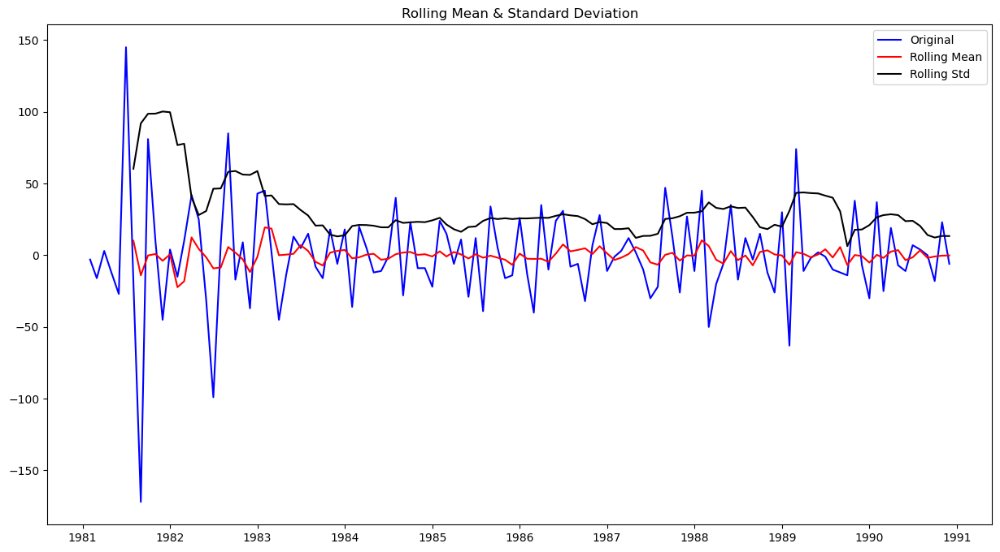

Results of Dickey-Fuller Test:
Test Statistic                  -3.692348
p-value                          0.004222
#Lags Used                      11.000000
Number of Observations Used    107.000000
Critical Value (1%)             -3.492996
Critical Value (5%)             -2.888955
Critical Value (10%)            -2.581393
dtype: float64 



In [283]:
# Now we see that there is almost no trend present in the data. Seasonality is only present in the data.
# Let us go ahead and check the stationarity of the above series before fitting the SARIMA model.

test_stationarity((train_rose['Rose'].diff(12).dropna()).diff().dropna())

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


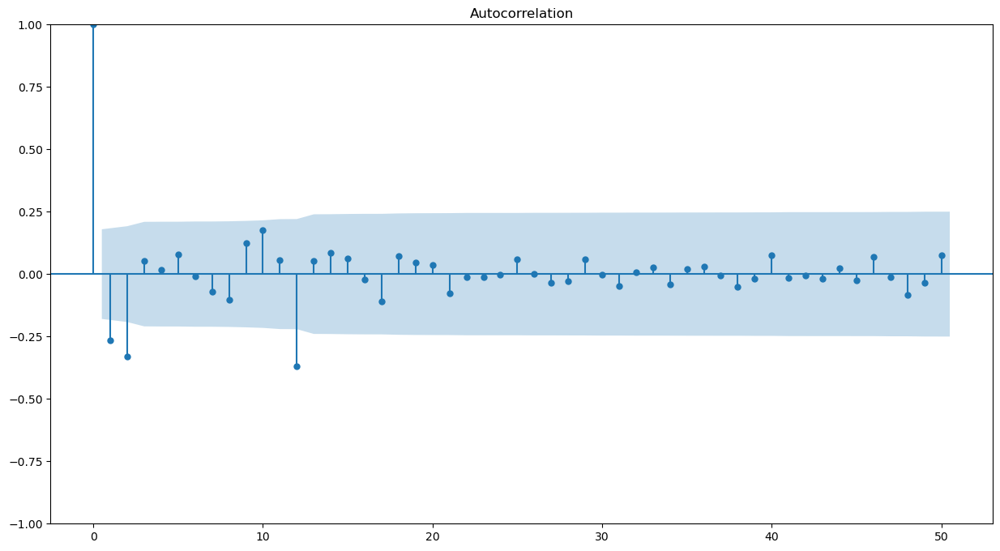

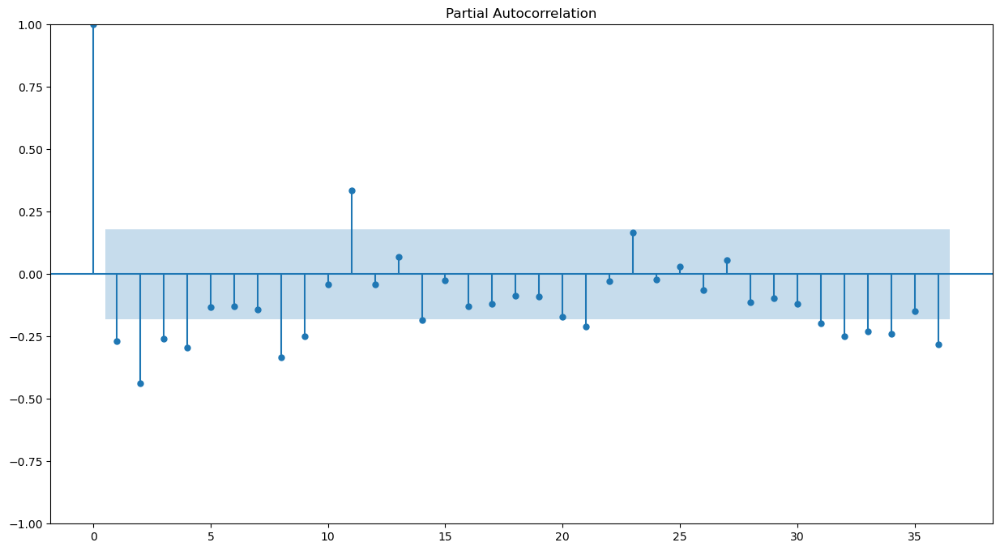

In [284]:
# Checking the ACF and the PACF plots for the new modified Time Series.
plot_acf((train_rose['Rose'].diff(12).dropna()).diff().dropna(),lags=50)
plot_pacf((train_rose['Rose'].diff(12).dropna()).diff().dropna(),lags=36);

In [285]:
import statsmodels.api as sm

manual_SARIMA_6 = sm.tsa.statespace.SARIMAX(train_rose['Rose'].values,
                                order=(2, 1, 2),
                                seasonal_order=(2, 1, 4, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_manual_SARIMA_6 = manual_SARIMA_6.fit(maxiter=1000)
print(results_manual_SARIMA_6.summary())

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


                                           SARIMAX Results                                           
Dep. Variable:                                             y   No. Observations:                  132
Model:             SARIMAX(2, 1, 2)x(2, 1, [1, 2, 3, 4], 12)   Log Likelihood                -276.118
Date:                                       Sun, 02 Apr 2023   AIC                            574.236
Time:                                               23:21:31   BIC                            598.651
Sample:                                                    0   HQIC                           583.910
                                                       - 132                                         
Covariance Type:                                         opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.0068     

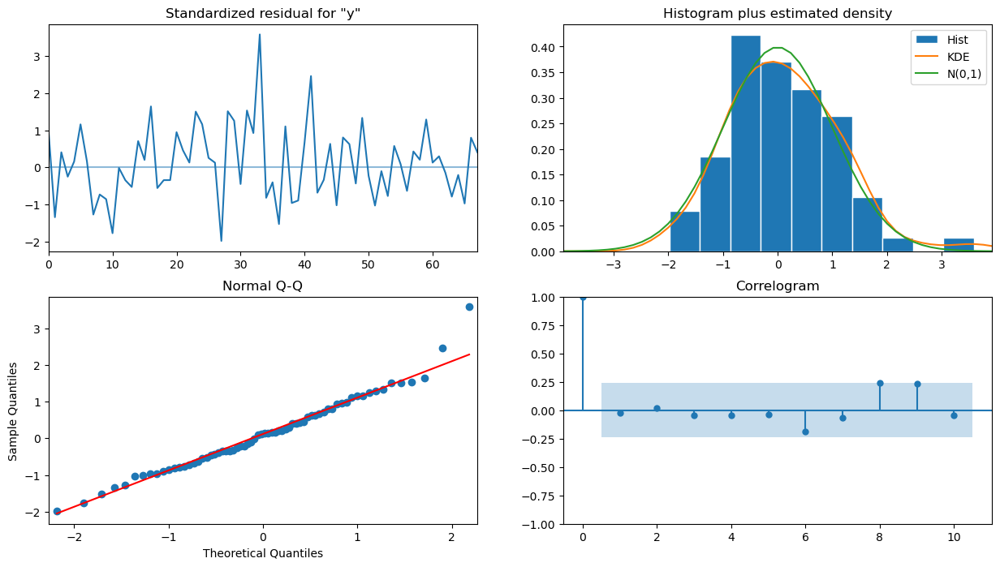

In [286]:
results_manual_SARIMA_6.plot_diagnostics()
plt.show()

In [287]:
predicted_manual_SARIMA_6 = results_manual_SARIMA_6.get_forecast(steps=len(test_rose))

In [288]:
predicted_manual_SARIMA_6.summary_frame(alpha=0.05).head()

y,mean,mean_se,mean_ci_lower,mean_ci_upper
0,45.358826,13.090124,19.702655,71.014998
1,58.633082,12.900673,33.348228,83.917937
2,72.015393,12.901341,46.729230,97.301557
3,71.130139,13.118372,45.418603,96.841675
4,71.865091,13.117695,46.154882,97.575300


In [289]:
rmse = mean_squared_error(test_rose['Rose'],predicted_manual_SARIMA_6.predicted_mean,squared=False)
print(rmse)

16.931327895503397


In [290]:
resultsDf_8_1 = pd.DataFrame({'Test RMSE Rose': [rmse]}
                           ,index=['SARIMA(2,1,2)(2,1,4,12) Manual plot'])

resultsDf_rose = pd.concat([resultsDf_rose, resultsDf_8_1])
resultsDf_rose

,Test RMSE Rose
Linear Regression,15.268955
Naive Model,79.718773
Simple Average Model,53.460570
2pointTrailingMovingAverage,11.529278
4pointTrailingMovingAverage,14.451403
6pointTrailingMovingAverage,14.566327
9pointTrailingMovingAverage,14.727630
"Alpha=0.098,SimpleExponentialSmoothing",36.796242
"Alpha=0.07,SimpleExponentialSmoothing",36.435772
"Alpha=1.4e-08,Beta=7.3e-09:DoubleExponentialSmoothing",15.268957


#### Q8) Build a table with all the models built along with their corresponding parameters and the respective RMSE values on the test data.

In [291]:
resultsDf_rose

,Test RMSE Rose
Linear Regression,15.268955
Naive Model,79.718773
Simple Average Model,53.460570
2pointTrailingMovingAverage,11.529278
4pointTrailingMovingAverage,14.451403
6pointTrailingMovingAverage,14.566327
9pointTrailingMovingAverage,14.727630
"Alpha=0.098,SimpleExponentialSmoothing",36.796242
"Alpha=0.07,SimpleExponentialSmoothing",36.435772
"Alpha=1.4e-08,Beta=7.3e-09:DoubleExponentialSmoothing",15.268957


### Building the most optimum model on the complete data and predicting 12 months into the future with appropriate confidence intervals/bands.

Best time series model for Rose dataset is Triple Exponential Smoothing with parameters Alpha = 0.2, Beta = 0.7 and Gamma = 0.2

Let us build a model on the complete dataset using this model.

In [292]:
fullmodel1 = ExponentialSmoothing(df_rose,
                                  trend='multiplicative',
                                  seasonal='multiplicative').fit(smoothing_level=0.2,
                                                                 smoothing_trend=0.7,
                                                                 smoothing_seasonal=0.2)

C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\cheru\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:83: RuntimeWarning: overflow encountered in matmul
  return err.T @ err


In [293]:
RMSE_fullmodel1 = metrics.mean_squared_error(df_rose['Rose'],fullmodel1.fittedvalues,squared=False)

print('RMSE:',RMSE_fullmodel1)

RMSE: 20.68138070976704


In [294]:
# Getting the predictions for 12 months into the future
prediction_1 = fullmodel1.forecast(steps=12)

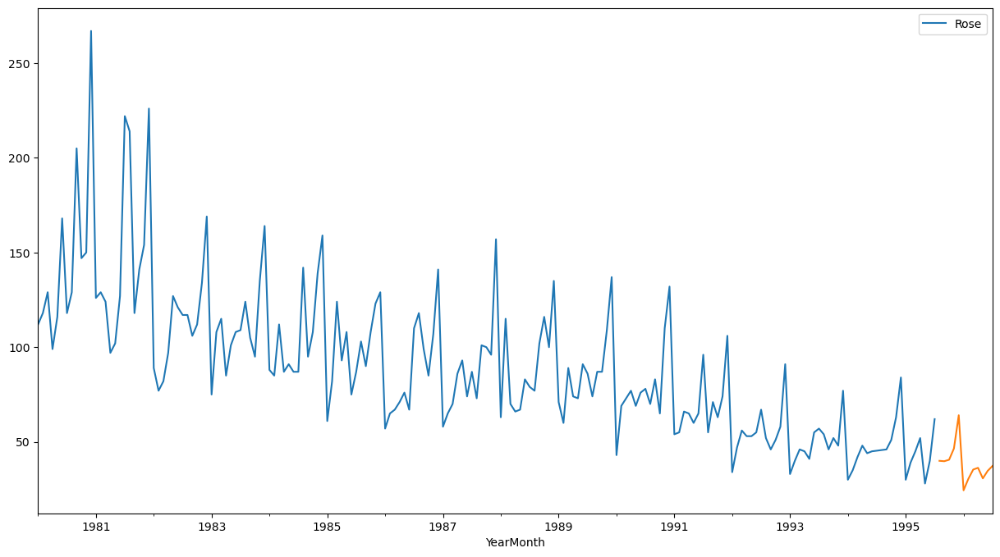

In [295]:
df_rose.plot()
prediction_1.plot();

In [296]:
#In the below code, we have calculated the upper and lower confidence bands at 95% confidence level
#Here we are taking the multiplier to be 1.96 as we want to plot with respect to a 95% confidence intervals.
pred_1_df = pd.DataFrame({'lower_CI':prediction_1 - 1.96*np.std(fullmodel1.resid,ddof=1),
                          'prediction':prediction_1,
                          'upper_ci': prediction_1 + 1.96*np.std(fullmodel1.resid,ddof=1)})
pred_1_df

,lower_CI,prediction,upper_ci
1995-08-01,-0.538512,39.978826,80.496163
1995-09-01,-0.744895,39.772443,80.289780
1995-10-01,0.034643,40.551980,81.069317
1995-11-01,5.969811,46.487148,87.004486
1995-12-01,23.535284,64.052621,104.569959
1996-01-01,-16.118008,24.399329,64.916666
1996-02-01,-10.029195,30.488142,71.005479
1996-03-01,-5.152912,35.364425,75.881762
1996-04-01,-4.223767,36.293570,76.810907
1996-05-01,-9.811922,30.705416,71.222753


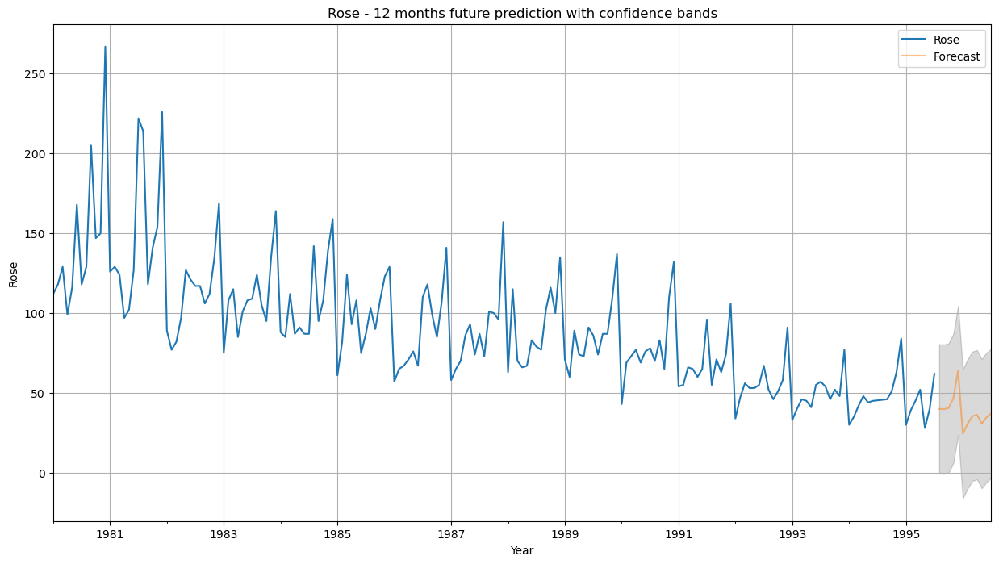

In [297]:
# plot the forecast along with the confidence band

axis = df_rose.plot(label='Actual', figsize=(15,8))
pred_1_df['prediction'].plot(ax=axis, label='Forecast', alpha=0.5)
axis.fill_between(pred_1_df.index, pred_1_df['lower_CI'], pred_1_df['upper_ci'], color='k', alpha=.15)
axis.set_xlabel('Year')
axis.set_ylabel('Rose')
plt.legend(loc='best')
plt.grid()
plt.title('Rose - 12 months future prediction with confidence bands')
plt.show()

### Comment on the model the measures suggested for the company's future sales.

#### Recommendations:

1. Use a time series model like triple exponential smoothing with Alpha = 0.2, Beta = 0.7, Gamma = 0.2 to predict future sales and make better inventory decisions.


2. Review customer feedback over the years to identify areas for improvement in the quality of your rose wine.


3. Once the quality is up to standard, invest in marketing and promotional activities to increase awareness and encourage people to try the new improved version.


4. Utilize social media platforms to reach a wider audience and promote your rose wine.


5. Prepare your inventory in advance to meet the high demand during the 4th quarter, which typically sees higher sales.


6. Ensure that you have enough stock to fulfill the market demand during the festival season in November and December.


7. Invest in effective marketing resources to promote your wine and increase sales.


8. Encourage wine tasting sessions and offer samples of the new improved version based on customer feedback.


9. Gather and analyze data to understand which areas and sections of people are consuming more rose wine, and tailor your marketing efforts accordingly.


10. Experiment with new offers, discounts, and marketing schemes to attract customers in areas with low sales and expand your customer base. Research changes in customer behavior resulting from these changes to fine-tune your tactics.


